#

Group 11 - A Hybrid Deep Learning Framework for Accurate Jute Pest Detection

Team Members:
Name 1: Madhav Savani - sava3510@mylaurier.ca
Name 2: Dhrumil Makwana - makw9200@mylaurier.ca
Name 3: Harshil Amin - amin8750@mylaurier.ca
Name 4: Nishita Patel - pate7220@mylaurier.ca

Objective:
The goal of this project is to create a robust and comprehensive image dataset for the classification of pests that affect jute crops by combining two distinct datasets—one primary jute pest dataset and another auxiliary dataset containing additional pest images, including a new "Grasshopper" category. The combined dataset will thereafter be used to build and test deep learning models for accurate pest classification.

Dataset Integration and Preparation for Jute Pest Classification

In [ ]:
# Import necessary libraries
import os
import shutil
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split

# Define paths to the original datasets and the working directory
jute_dataset_path = "/kaggle/input/jute-dataset/Jute_Pest_Dataset"  # Path for the Jute dataset
newcat_dataset_path = "/kaggle/input/newcat"  # Path for the grasshopper images dataset
working_dataset_path = "/kaggle/working/Jute_Pest_Dataset"  # Destination for the final integrated dataset

# Create the working directory if it doesn't exist
if not os.path.exists(working_dataset_path):
    os.makedirs(working_dataset_path)
    print("Created working directory:", working_dataset_path)
else:
    print("Working directory exists:", working_dataset_path)

# ------------------------------------------------------------------------
# STEP 1: Copy the main Jute Pest Dataset to the working directory
# ------------------------------------------------------------------------
# Iterate through the 'train', 'validation', and 'test' splits

for split in ["train", "val", "test"]:
  # Construct paths to the source and destination splits
    src_split_path = os.path.join(jute_dataset_path, split)
    dest_split_path = os.path.join(working_dataset_path, split)

    # Create the destination split directory if it doesn't exist
    os.makedirs(dest_split_path, exist_ok=True)

    # Copy images from the source to the destination
    if os.path.exists(src_split_path):
      # Get a list of image categories in the current split
        categories = os.listdir(src_split_path)
        for category in categories:
          # Construct paths to the source and destination categories
            src_cat_path = os.path.join(src_split_path, category)
            dest_cat_path = os.path.join(dest_split_path, category)

            # Create the destination category directory
            os.makedirs(dest_cat_path, exist_ok=True)

            # Copy individual images within the category
            for img in os.listdir(src_cat_path):
                src_img_path = os.path.join(src_cat_path, img)
                dest_img_path = os.path.join(dest_cat_path, img)
                try:
                    shutil.copy(src_img_path, dest_img_path)
                except Exception as e:
                    print(f"Error copying {src_img_path}: {e}")
        print(f"Copied {split} images from main dataset.")
    else:
        print(f"Split path not found: {src_split_path}")

# ------------------------------------------------------------------------
# STEP 2: Integrate Grasshopper Category from the newcat Dataset
# ------------------------------------------------------------------------
# Define paths to the CSV files containing image information in the 'newcat' dataset
train_csv_path = os.path.join(newcat_dataset_path, "train.csv")
test_csv_path = os.path.join(newcat_dataset_path, "test.csv")

# Read the CSV files into pandas DataFrames
train_csv = pd.read_csv(train_csv_path)
test_csv = pd.read_csv(test_csv_path)

# Print the column names of the CSV files for inspection
print("newcat Train CSV columns:", train_csv.columns.tolist())
print("newcat Test CSV columns:", test_csv.columns.tolist())

# Add a 'source' column to indicate whether the image is from the train or test set
train_csv['source'] = 'train'
test_csv['source'] = 'test'

# Combine the train and test CSV data into a single DataFrame
all_images_df = pd.concat([train_csv, test_csv], ignore_index=True)
print("Unique labels in newcat dataset:", all_images_df['label'].unique())

# Define a function to update image paths based on CSV data
def update_path(row):
    # Construct the full image path using information from the CSV row
    filename = os.path.basename(row['filename'])
    return f"{newcat_dataset_path}/{row['source']}/{row['label']}/{filename}"

# Apply the 'update_path' function to update the 'filename' column in the DataFrame
all_images_df['filename'] = all_images_df.apply(update_path, axis=1)

# Filter the DataFrame to select only images labeled as 'grasshopper'
grasshopper_df = all_images_df[all_images_df['label'] == 'grasshopper']
grasshopper_images = grasshopper_df['filename'].tolist()  # Get a list of grasshopper image paths

# Check if any grasshopper images were found
if not grasshopper_images:
    print("No 'grasshopper' images found. Check the CSV label or file paths.")
else:
    print(f"Found {len(grasshopper_images)} grasshopper images in newcat dataset.")

    # -------------------------------
    # Split grasshopper images into train, validation, and test sets
    # -------------------------------
    # Define desired number of images for validation and test sets
    desired_val_count = 24
    desired_test_count = 22

    total_needed = desired_val_count + desired_test_count
    np.random.seed(42)  # Set random seed for reproducibility

    # Split the images if there are enough for the desired counts
    if len(grasshopper_images) >= total_needed:
        indices = np.random.permutation(len(grasshopper_images))  # Shuffle image indices
        test_indices = indices[:desired_test_count]
        val_indices = indices[desired_test_count:desired_test_count + desired_val_count]
        train_indices = indices[desired_test_count + desired_val_count:]

        test_imgs = [grasshopper_images[i] for i in test_indices] # Select test images
        val_imgs = [grasshopper_images[i] for i in val_indices]  # Select validation images
        train_imgs = [grasshopper_images[i] for i in train_indices] # Select training images
    # If not enough images, use proportional splits
    else:
        print("Not enough grasshopper images to sample fixed counts; falling back to proportional splits.")
        test_ratio = desired_test_count / len(grasshopper_images)
        train_val_imgs, test_imgs = train_test_split(grasshopper_images, test_size=test_ratio, random_state=42)
        val_ratio = desired_val_count / len(train_val_imgs)
        train_imgs, val_imgs = train_test_split(train_val_imgs, test_size=val_ratio, random_state=42)

    # --- Create directories for the Grasshopper category in each split ---
    category_name = "Grasshopper"
    for split in ["train", "val", "test"]:
        os.makedirs(os.path.join(working_dataset_path, split, category_name), exist_ok=True)

    # Define a function to copy images to their respective directories
    def copy_images(image_list, split):
        for img_path in image_list:
            dest_path = os.path.join(working_dataset_path, split, category_name, os.path.basename(img_path))
            try:
                shutil.copy(img_path, dest_path)  # Copy the image
            except FileNotFoundError as e:
                print(f"Skipping {img_path} in {split} (not found): {e}") # Print error if image is not found
            except Exception as e:
                print(f"Error copying {img_path} in {split}: {e}") # Print error if copying fails

    # Copy the grasshopper images to their respective directories
    copy_images(train_imgs, "train")
    copy_images(val_imgs, "val")
    copy_images(test_imgs, "test")

    print("Grasshopper category copied into working directory successfully!")
    print(f"Train Grasshopper images: {len(os.listdir(os.path.join(working_dataset_path, 'train', category_name)))}")
    print(f"Validation Grasshopper images: {len(os.listdir(os.path.join(working_dataset_path, 'val', category_name)))}")
    print(f"Test Grasshopper images: {len(os.listdir(os.path.join(working_dataset_path, 'test', category_name)))}")

# ------------------------------------------------------------------------
# STEP 3: Verify the final working directory structure
# ------------------------------------------------------------------------
print("\nFinal working dataset structure:")
for split in ["train", "val", "test"]:
    split_path = os.path.join(working_dataset_path, split)
    print(f"\n{split.capitalize()} split folders: {os.listdir(split_path)}")


Created working directory: /kaggle/working/Jute_Pest_Dataset
Copied train images from main dataset.
Copied val images from main dataset.
Copied test images from main dataset.
newcat Train CSV columns: ['filename', 'label']
newcat Test CSV columns: ['filename', 'label']
Unique labels in newcat dataset: ['snail' 'wasp' 'bees' 'grasshopper' 'weevil' 'earwig' 'beetle'
 'earthworms' 'ants' 'slug' 'catterpillar' 'moth']
Found 485 grasshopper images in newcat dataset.
Grasshopper category copied into working directory successfully!
Train Grasshopper images: 439
Validation Grasshopper images: 24
Test Grasshopper images: 22

Final working dataset structure:

Train split folders: ['Termite', 'Scopula Emissaria', 'Jute Hairy', 'Pod Borer', 'Jute Aphid', 'Mealybug', 'Cutworm', 'Jute Semilooper', 'Yellow Mite', 'Leaf Beetle', 'Black Hairy', 'Termite odontotermes (Rambur)', 'Jute Stem Girdler', 'Jute Stem Weevil', 'Field Cricket', 'Beet Armyworm', 'Jute Red Mite', 'Grasshopper']

Val split folders: 

Verify Dataset Path

In [ ]:
# Set the path to the integrated Jute Pest Dataset
dataset_path = "/kaggle/working/Jute_Pest_Dataset"

# Import the 'os' module for operating system interactions (file/directory operations)
import os

# Check if the dataset directory exists at the specified path
if os.path.exists(dataset_path):
    # If the directory exists, print a confirmation message with the path
    print("Dataset found at:", dataset_path)
else:
    # If the directory does not exist, print an error message
    print("Dataset not found. Check the path again!")

Dataset found at: /kaggle/working/Jute_Pest_Dataset


Inspecting Directory Structure of the Integrated Dataset

In [ ]:
# List contents of dataset directory
train_path = os.path.join(dataset_path, "train")
val_path = os.path.join(dataset_path, "val")
test_path = os.path.join(dataset_path, "test")

print("Training Categories:", os.listdir(train_path))
print("Validation Categories:", os.listdir(val_path))
print("Test Categories:", os.listdir(test_path))

Training Categories: ['Jute Red Mite', 'Jute Stem Weevil', 'Jute Aphid', 'Pod Borer', 'Cutworm', 'Jute Stem Girdler', 'Scopula Emissaria', 'Mealybug', 'Beet Armyworm', 'Jute Semilooper', 'Yellow Mite', 'Field Cricket', 'Termite odontotermes (Rambur)', 'Black Hairy', 'Leaf Beetle', 'Grasshopper', 'Jute Hairy', 'Termite']
Validation Categories: ['Jute Red Mite', 'Jute Stem Weevil', 'Jute Aphid', 'Pod Borer', 'Cutworm', 'Jute Stem Girdler', 'Scopula Emissaria', 'Mealybug', 'Beet Armyworm', 'Jute Semilooper', 'Yellow Mite', 'Field Cricket', 'Termite odontotermes (Rambur)', 'Black Hairy', 'Leaf Beetle', 'Grasshopper', 'Jute Hairy', 'Termite']
Test Categories: ['Jute Red Mite', 'Jute Stem Weevil', 'Jute Aphid', 'Pod Borer', 'Cutworm', 'Jute Stem Girdler', 'Scopula Emissaria', 'Mealybug', 'Beet Armyworm', 'Jute Semilooper', 'Yellow Mite', 'Field Cricket', 'Termite odontotermes (Rambur)', 'Black Hairy', 'Leaf Beetle', 'Grasshopper', 'Jute Hairy', 'Termite']


Generating Dataset Statistics for Each Category

In [ ]:
import pandas as pd
import os
import matplotlib.pyplot as plt

# Define dataset paths
working_dataset_path = "/kaggle/working/Jute_Pest_Dataset"
train_path = os.path.join(working_dataset_path, "train")
val_path = os.path.join(working_dataset_path, "val")
test_path = os.path.join(working_dataset_path, "test")

# Function to count the number of images in each category within a given directory
def count_images_per_category(base_path):
    category_counts = {}  # Initialize an empty dictionary to store category counts
    if os.path.exists(base_path):  # Check if the directory exists
        for category in os.listdir(base_path):  # Iterate through each subdirectory (category)
            category_dir = os.path.join(base_path, category)  # Construct the full path to the category directory
            if os.path.isdir(category_dir):  # Check if the item is a directory (not a file)
                try:
                    # Count the number of files (images) in the category directory
                    category_counts[category] = len(os.listdir(category_dir))
                except Exception as e:
                    # If an error occurs during counting, print an error message and set the count to 0
                    print(f"Error counting images in {category_dir}: {e}")
                    category_counts[category] = 0
    else:
        # If the base path does not exist, print an error message
        print(f"Path does not exist: {base_path}")
    return category_counts  # Return the dictionary containing category counts

# Count images in each category for the train, validation, and test sets
train_counts = count_images_per_category(train_path)
val_counts = count_images_per_category(val_path)
test_counts = count_images_per_category(test_path)

# Create pandas DataFrames from the image counts
df_train = pd.DataFrame(list(train_counts.items()), columns=["Category", "Train Images"])
df_val = pd.DataFrame(list(val_counts.items()), columns=["Category", "Validation Images"])
df_test = pd.DataFrame(list(test_counts.items()), columns=["Category", "Test Images"])

# Merge the DataFrames to create a single DataFrame with all image counts
df = df_train.merge(df_val, on="Category", how="outer").merge(df_test, on="Category", how="outer")
# Fill any missing values with 0 and convert the image count columns to integers
df = df.fillna(0).astype({"Train Images": int, "Validation Images": int, "Test Images": int})

# Display the dataset statistics
print("Dataset Statistics:")
print(df)


Dataset Statistics:
                         Category  Train Images  Validation Images  \
0                   Beet Armyworm           199                 40   
1                     Black Hairy           309                 30   
2                         Cutworm           399                 18   
3                   Field Cricket           392                 14   
4                     Grasshopper           439                 24   
5                      Jute Aphid           531                 27   
6                      Jute Hairy           414                  8   
7                   Jute Red Mite           457                 49   
8                 Jute Semilooper           372                  5   
9               Jute Stem Girdler           281                  6   
10               Jute Stem Weevil           676                 71   
11                    Leaf Beetle           310                  9   
12                       Mealybug           466                 35   


Loading Dataset with PyTorch and Creating Subsets for Model Training

In [ ]:
import os
import torch
from torchvision import datasets
from sklearn.model_selection import train_test_split
from collections import Counter
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset using ImageFolder
train_dataset = datasets.ImageFolder(train_path)

# Get basic information about the dataset
total_images = len(train_dataset.imgs)  # Total number of images
total_classes = len(train_dataset.classes)  # Total number of classes
class_names = train_dataset.classes  # List of class names

# Calculate the distribution of images per class
class_distribution = Counter([label for _, label in train_dataset.imgs])

# Print a summary of the dataset
print(f"Dataset Name: Jute Pest Dataset")
print(f"Total Images: {total_images}")
print(f"Total Classes: {total_classes}")
print(f"Class Names: {class_names}")
print(f"Class Distribution: {class_distribution}")

# Split the dataset into train, validation, and test sets
# 10% for validation, further split into 5% each for validation and test
train_indices, val_indices = train_test_split(
    list(range(total_images)), test_size=0.1, stratify=list(train_dataset.targets), random_state=42
)
val_indices, test_indices = train_test_split(
    val_indices, test_size=0.5, stratify=[train_dataset.targets[i] for i in val_indices], random_state=42
)

# Create subsets for training, validation, and testing
train_subset = torch.utils.data.Subset(train_dataset, train_indices)
val_subset = torch.utils.data.Subset(train_dataset, val_indices)
test_subset = torch.utils.data.Subset(train_dataset, test_indices)

# Print the number of images in each subset
print(f"Training Images: {len(train_subset)}")
print(f"Validation Images: {len(val_subset)}")
print(f"Test Images: {len(test_subset)}")

Dataset Name: Jute Pest Dataset
Total Images: 6883
Total Classes: 18
Class Names: ['Beet Armyworm', 'Black Hairy', 'Cutworm', 'Field Cricket', 'Grasshopper', 'Jute Aphid', 'Jute Hairy', 'Jute Red Mite', 'Jute Semilooper', 'Jute Stem Girdler', 'Jute Stem Weevil', 'Leaf Beetle', 'Mealybug', 'Pod Borer', 'Scopula Emissaria', 'Termite', 'Termite odontotermes (Rambur)', 'Yellow Mite']
Class Distribution: Counter({10: 676, 5: 531, 12: 466, 7: 457, 4: 439, 6: 414, 2: 399, 3: 392, 13: 384, 8: 372, 17: 342, 14: 320, 11: 310, 1: 309, 16: 301, 15: 291, 9: 281, 0: 199})
Training Images: 6194
Validation Images: 344
Test Images: 345


Visualizing Class Distribution with a Pie Chart

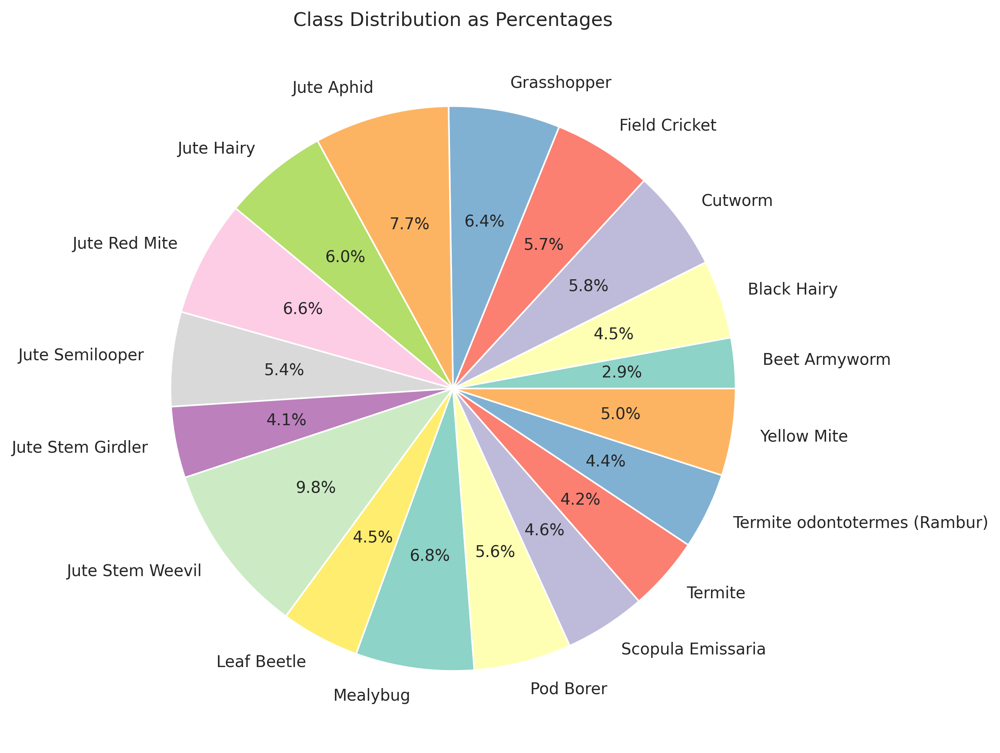

In [ ]:
# Get class counts from class_distribution
class_counts = list(class_distribution.values())

# Pie Chart: Class distribution as percentages
class_percentages = [count / total_images * 100 for count in class_counts]
plt.figure(figsize=(8, 8), dpi=300)
plt.pie(class_percentages, labels=class_names, autopct='%1.1f%%', colors=sns.color_palette("Set3", len(class_names)))
plt.title("Class Distribution as Percentages")

# Save the plot with 300 DPI
class_dist_pie_chart_path = "/kaggle/working/class_distribution_pie_chart.png"
plt.savefig(class_dist_pie_chart_path, dpi=300)

# Display the plot
plt.show()

Stacked Bar Chart of Image Distribution Across Dataset Splits

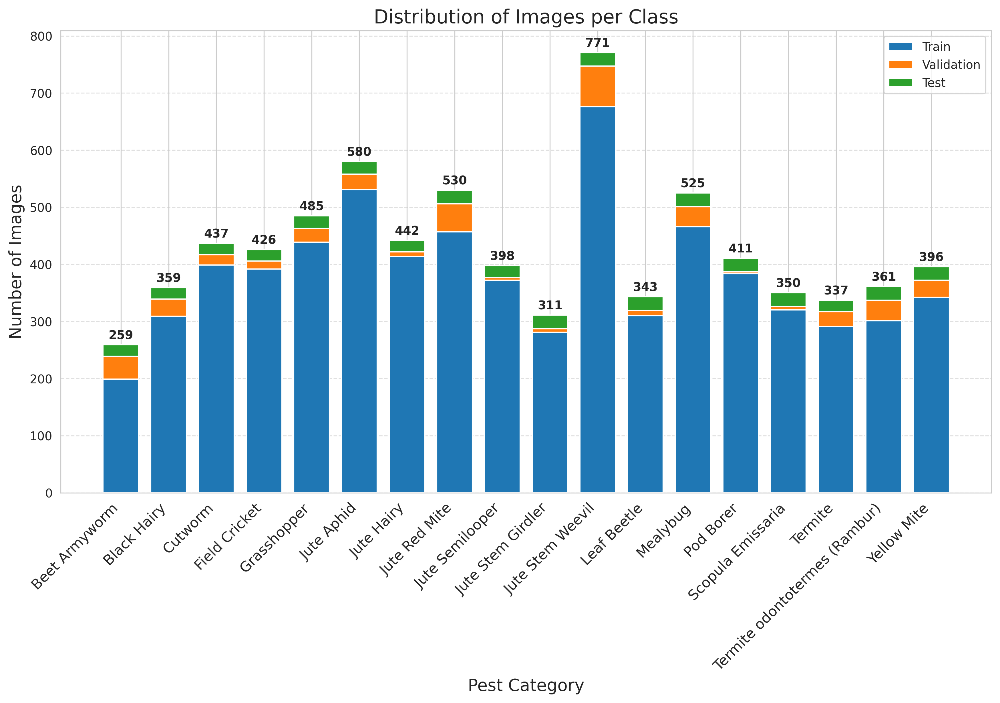

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Create a figure and axes object with a specific size and resolution
plt.figure(figsize=(14, 7), dpi=300)

# Define colors for the train, validation, and test sets
colors = ["#1f77b4", "#ff7f0e", "#2ca02c"]

# Extract data from the DataFrame (df is assumed to be defined earlier)
categories = df["Category"]  # Pest categories for the x-axis
train_counts = df["Train Images"]  # Image counts for the training set
val_counts = df["Validation Images"]  # Image counts for the validation set
test_counts = df["Test Images"]  # Image counts for the test set

# Set the width of the bars
bar_width = 0.75

# Create the stacked bar chart
plt.bar(categories, train_counts, color=colors[0], label="Train", width=bar_width)  # Train set bar
plt.bar(categories, val_counts, color=colors[1], label="Validation", width=bar_width,
        bottom=train_counts)  # Validation set bar stacked on top of Train
plt.bar(categories, test_counts, color=colors[2], label="Test", width=bar_width,
        bottom=np.array(train_counts) + np.array(val_counts))  # Test set bar stacked on top

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha="right", fontsize=12)

# Add labels and title to the plot
plt.xlabel("Pest Category", fontsize=14)
plt.ylabel("Number of Images", fontsize=14)
plt.title("Distribution of Images per Class", fontsize=16)

# Add grid lines to the y-axis for better readability
plt.grid(axis="y", linestyle="--", alpha=0.6)

# Add total image count labels on top of each bar
for i, (train, val, test) in enumerate(zip(train_counts, val_counts, test_counts)):
    total = train + val + test
    plt.text(i, total + 10, str(total), ha='center', fontsize=10, fontweight="bold")

# Display the legend to identify the dataset splits
plt.legend()

# Show the plot
plt.show()

Analyzing Image Dimensions and Aspect Ratios in the Dataset

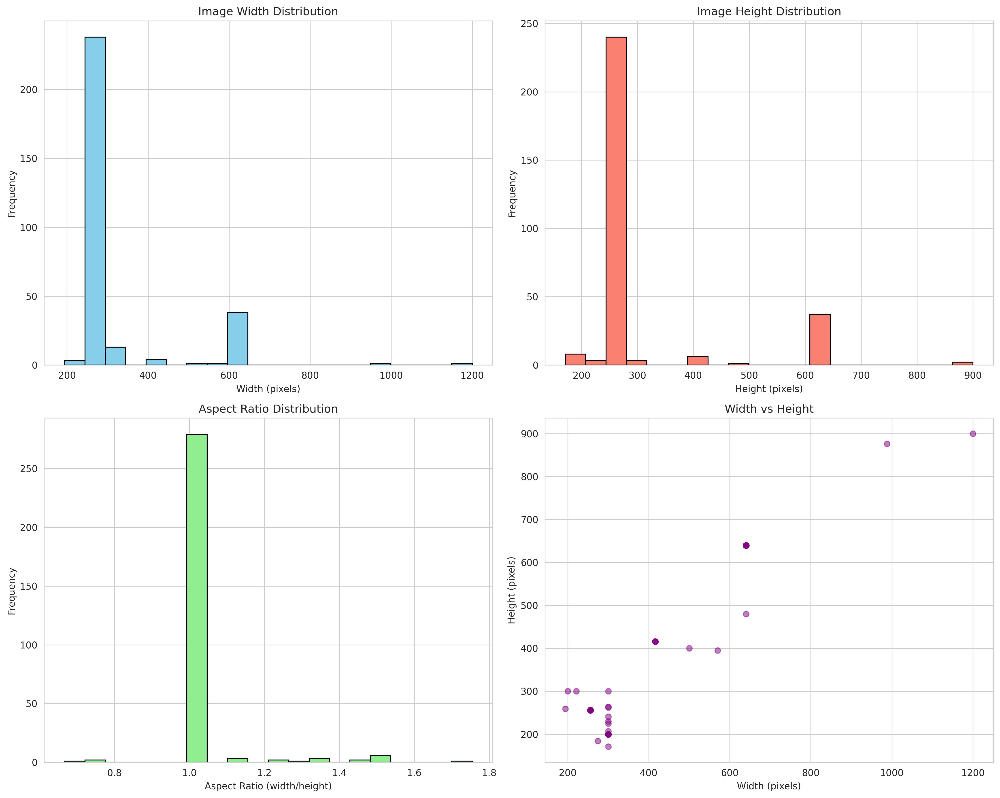

Width - Min: 194, Max: 1200, Mean: 315.7, Median: 256.0
Height - Min: 171, Max: 900, Mean: 310.0, Median: 256.0
Aspect Ratio - Min: 0.67, Max: 1.75, Mean: 1.02


In [ ]:
import os
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import random

# Set the number of images to sample for analysis
sample_size = 300

# Initialize a list to store paths of all images in the training set
all_image_paths = []

# Iterate through categories (subfolders) in the training dataset directory
for category in os.listdir(train_path):
    category_path = os.path.join(train_path, category)  # Construct path to the category folder
    # Check if the item is a directory (a category folder)
    if os.path.isdir(category_path):
        # Iterate through image files within the category folder
        for img_file in os.listdir(category_path):
            img_path = os.path.join(category_path, img_file)  # Construct full path to the image file
            # Check if the item is a file and has a valid image extension
            if os.path.isfile(img_path) and img_path.lower().endswith(('.png', '.jpg', '.jpeg')):
                all_image_paths.append(img_path)  # Add the image path to the list

# Randomly sample a subset of images from the training set
sampled_paths = random.sample(all_image_paths, min(sample_size, len(all_image_paths)))

# Initialize lists to store image dimensions and aspect ratios
widths = []
heights = []
aspect_ratios = []

# Iterate through the sampled image paths
for img_path in sampled_paths:
    try:
        with Image.open(img_path) as img:
            width, height = img.size
            widths.append(width)
            heights.append(height)
            aspect_ratios.append(width / height)
    except Exception as e:
        print(f"Error processing {img_path}: {e}")

# Create a figure and axes for subplots
fig, axes = plt.subplots(2, 2, figsize=(15, 12), dpi=300)

# Plot width distribution
axes[0, 0].hist(widths, bins=20, color='skyblue', edgecolor='black')
axes[0, 0].set_title('Image Width Distribution')
axes[0, 0].set_xlabel('Width (pixels)')
axes[0, 0].set_ylabel('Frequency')

# Plot height distribution
axes[0, 1].hist(heights, bins=20, color='salmon', edgecolor='black')
axes[0, 1].set_title('Image Height Distribution')
axes[0, 1].set_xlabel('Height (pixels)')
axes[0, 1].set_ylabel('Frequency')

# Plot aspect ratio distribution
axes[1, 0].hist(aspect_ratios, bins=20, color='lightgreen', edgecolor='black')
axes[1, 0].set_title('Aspect Ratio Distribution')
axes[1, 0].set_xlabel('Aspect Ratio (width/height)')
axes[1, 0].set_ylabel('Frequency')

# Scatter plot of width vs height
axes[1, 1].scatter(widths, heights, alpha=0.5, color='purple')
axes[1, 1].set_title('Width vs Height')
axes[1, 1].set_xlabel('Width (pixels)')
axes[1, 1].set_ylabel('Height (pixels)')

plt.tight_layout()
plt.show()

# Print summary statistics
print(f"Width - Min: {min(widths)}, Max: {max(widths)}, Mean: {np.mean(widths):.1f}, Median: {np.median(widths)}")
print(f"Height - Min: {min(heights)}, Max: {max(heights)}, Mean: {np.mean(heights):.1f}, Median: {np.median(heights)}")
print(f"Aspect Ratio - Min: {min(aspect_ratios):.2f}, Max: {max(aspect_ratios):.2f}, Mean: {np.mean(aspect_ratios):.2f}")

Zipping Specific Folder for Download or Transfer

In [ ]:
import shutil

# Define the path of the folder to be zipped
folder_to_zip = '/kaggle/working/Jute_Pest_Dataset/val/Jute Stem Weevil'

# Define the zip file path
zip_file_path = '/kaggle/working/Weevil_images.zip'

# Create a zip archive of the 'Weevil' folder
shutil.make_archive(zip_file_path.replace('.zip', ''), 'zip', folder_to_zip)

# Now the 'Weevil' folder is zipped and ready to be downloaded.
print(f"Folder '{folder_to_zip}' is zipped and available for download as '{zip_file_path}'")


Folder '/kaggle/working/Jute_Pest_Dataset/val/Jute Stem Weevil' is zipped and available for download as '/kaggle/working/Weevil_images.zip'


Displaying Sample Images from Randomly Selected Classes

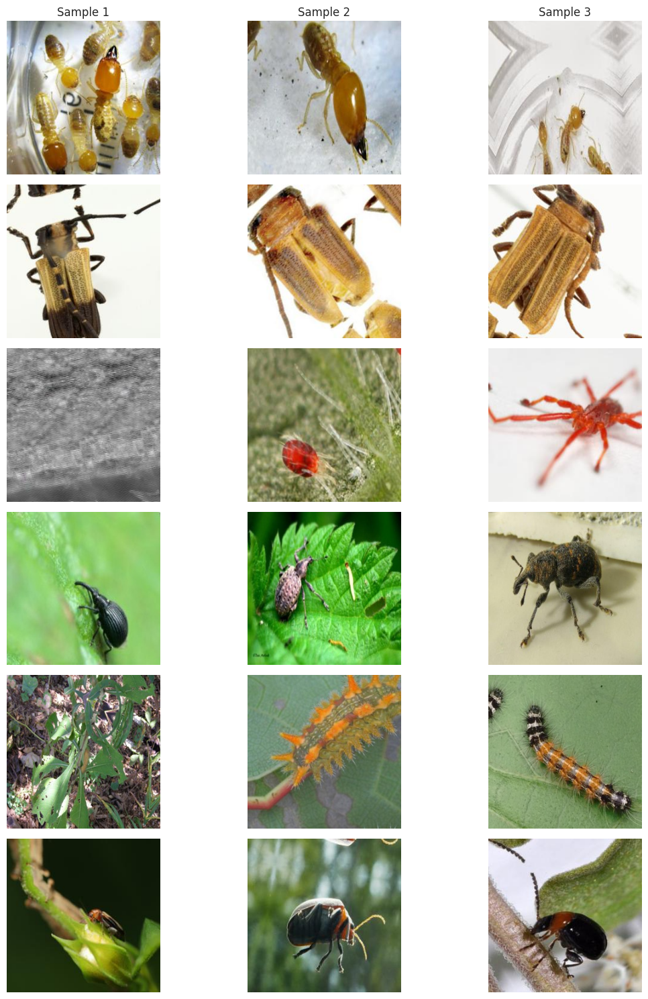

In [ ]:
# Function to display a subset of image samples from random classes
def plot_subset_sample_images(num_classes=6, samples_per_class=3):
    """
    Displays a grid of images from randomly selected classes in the dataset.

    Args:
        num_classes (int, optional): Number of classes to randomly select. Defaults to 6.
        samples_per_class (int, optional): Number of image samples to display per class. Defaults to 3.
    """
    # Randomly select a subset of classes from the available class names
    selected_classes = random.sample(class_names, min(num_classes, len(class_names)))

    # Create a figure and subplots to display the images in a grid layout
    fig, axes = plt.subplots(len(selected_classes), samples_per_class,
                            figsize=(samples_per_class * 4, len(selected_classes) * 2.5))

    # Iterate through the selected classes
    for i, class_name in enumerate(selected_classes):
        # Construct the path to the directory containing images for the current class
        class_dir = os.path.join(train_path, class_name)

        # Check if the class directory exists
        if os.path.isdir(class_dir):
            # Get a list of all image files within the class directory
            image_files = [f for f in os.listdir(class_dir)
                         if os.path.isfile(os.path.join(class_dir, f)) and
                         f.lower().endswith(('.png', '.jpg', '.jpeg'))]

            # Randomly select a subset of image files from the class directory
            selected_samples = random.sample(image_files,
                                           min(samples_per_class, len(image_files)))

            # Iterate through the selected image samples for the current class
            for j, sample in enumerate(selected_samples):
                try:
                    # Construct the full path to the image file
                    img_path = os.path.join(class_dir, sample)

                    # Open the image using Pillow library
                    img = Image.open(img_path)

                    # Convert the image to RGB format if it's not already
                    if img.mode != 'RGB':
                        img = img.convert('RGB')

                    # Display the image in the corresponding subplot
                    axes[i, j].imshow(img)

                    # Turn off axis ticks and labels for the subplot
                    axes[i, j].axis('off')

                    # Set the title for the subplot in the first row (sample number)
                    if i == 0:
                        axes[i, j].set_title(f"Sample {j+1}")

                    # Set the y-label for the subplot in the first column (class name)
                    if j == 0:
                        axes[i, j].set_ylabel(class_name, rotation=45,
                                           fontsize=12, labelpad=15)

                # Handle exceptions that may occur during image loading or display
                except Exception as e:
                    print(f"Error displaying {img_path}: {e}")
                    axes[i, j].text(0.5, 0.5, "Error loading image",
                                  ha='center', va='center')
                    axes[i, j].axis('off')

    # Adjust subplot spacing for better layout
    plt.tight_layout()

    # Display the figure with the images
    plt.show()

# Call the function to display 6 classes with 3 samples each
plot_subset_sample_images(num_classes=6, samples_per_class=3)

Class-wise Image Size Analysis and Visual Comparison

Processing 199 images for class Beet Armyworm
Processing 309 images for class Black Hairy
Processing 399 images for class Cutworm
Processing 392 images for class Field Cricket
Processing 439 images for class Grasshopper
Processing 530 images for class Jute Aphid
Processing 414 images for class Jute Hairy
Processing 457 images for class Jute Red Mite
Processing 372 images for class Jute Semilooper
Processing 281 images for class Jute Stem Girdler
Processing 676 images for class Jute Stem Weevil
Processing 310 images for class Leaf Beetle
Processing 466 images for class Mealybug
Processing 384 images for class Pod Borer
Processing 320 images for class Scopula Emissaria
Processing 291 images for class Termite
Processing 301 images for class Termite odontotermes (Rambur)
Processing 342 images for class Yellow Mite
Total images analyzed: 6882


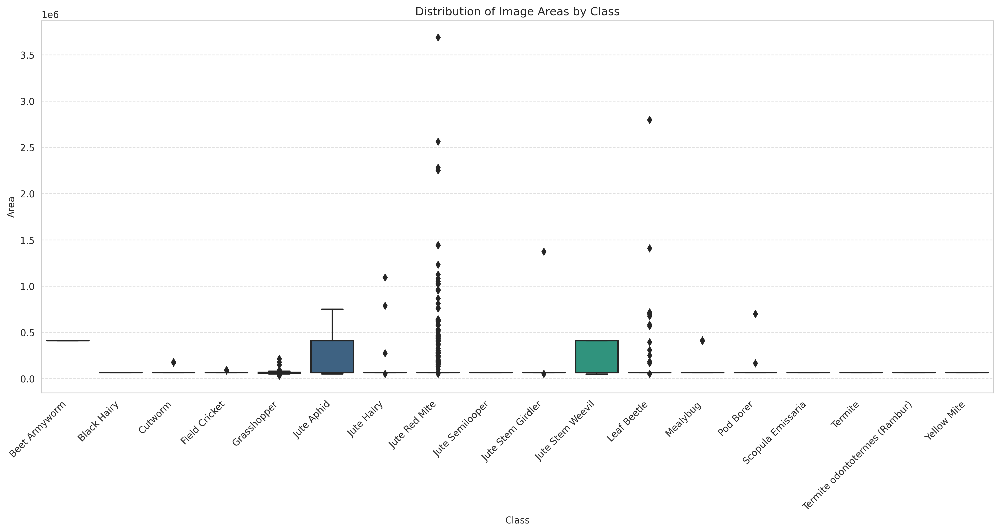

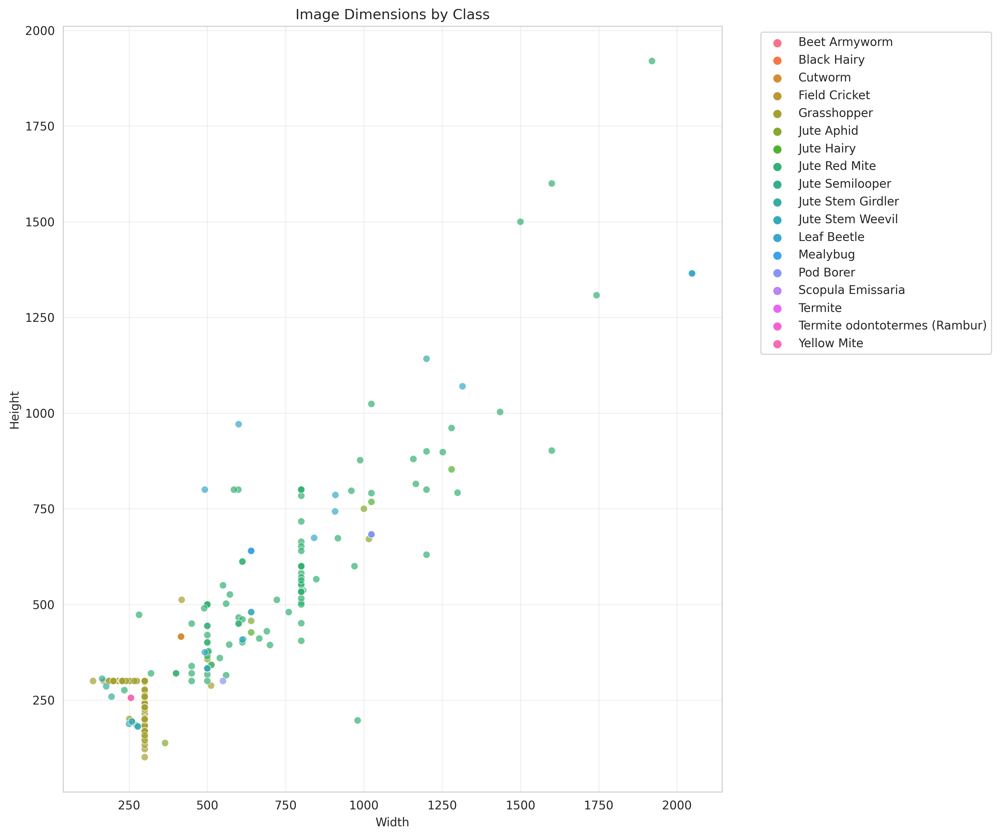

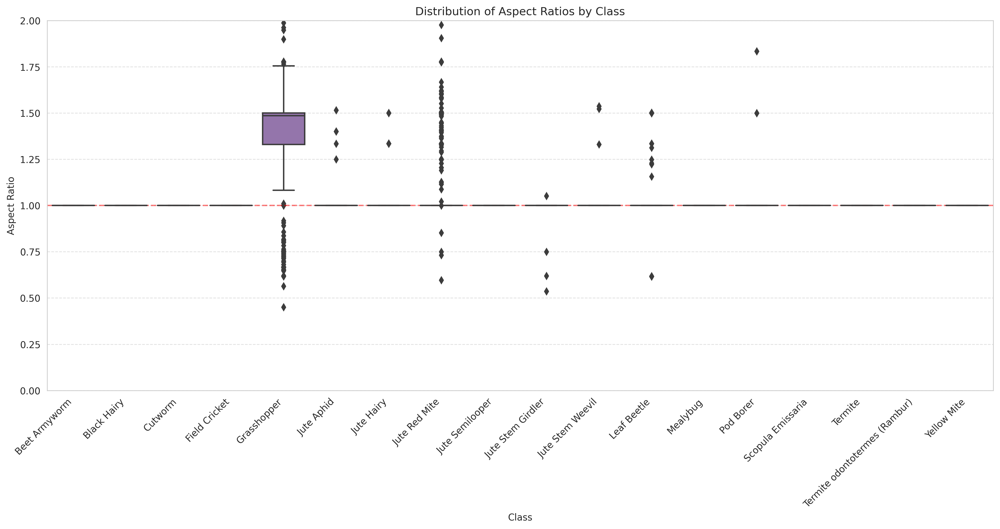

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import random

# Collect size data from ALL images per class
size_data = []

# Iterate through each class in the dataset
for class_name in class_names:
    class_dir = os.path.join(train_path, class_name)  # Path to the directory for the current class
    if os.path.isdir(class_dir):  # Check if the class directory exists
        # Get a list of all image files in the class directory
        image_files = [f for f in os.listdir(class_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

        print(f"Processing {len(image_files)} images for class {class_name}")

        # Iterate through each image file in the class directory
        for img_file in image_files:
            img_path = os.path.join(class_dir, img_file)  # Full path to the image file
            try:
                # Open the image using Pillow library
                with Image.open(img_path) as img:
                    width, height = img.size  # Get image width and height
                    # Store image data in a dictionary
                    size_data.append({
                        'Class': class_name,
                        'Width': width,
                        'Height': height,
                        'Area': width * height,  # Calculate image area
                        'Aspect Ratio': width / height  # Calculate aspect ratio
                    })
            except Exception as e:
                print(f"Error processing {img_path}: {e}")  # Print error message if image processing fails

# Create a pandas DataFrame from the collected image data
size_df = pd.DataFrame(size_data)
print(f"Total images analyzed: {len(size_df)}")

# --- Visualizations ---

# Boxplot of image areas by class
plt.figure(figsize=(15, 8), dpi=300)
sns.boxplot(x='Class', y='Area', data=size_df, palette='viridis')
plt.xticks(rotation=45, ha='right')
plt.title('Distribution of Image Areas by Class')
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# Scatter plot of width vs height colored by class
plt.figure(figsize=(12, 10), dpi=300)
sns.scatterplot(x='Width', y='Height', hue='Class', data=size_df, alpha=0.7)
plt.title('Image Dimensions by Class')
plt.grid(True, alpha=0.3)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# Boxplot of aspect ratios by class
plt.figure(figsize=(15, 8), dpi=300)
sns.boxplot(x='Class', y='Aspect Ratio', data=size_df, palette='muted')
plt.axhline(y=1, color='red', linestyle='--', alpha=0.5)  # Line at square aspect ratio
plt.xticks(rotation=45, ha='right')
plt.title('Distribution of Aspect Ratios by Class')
plt.ylim(0, 2)  # Limit y-axis to focus on meaningful aspect ratios
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

Top Image Resolutions in the Dataset

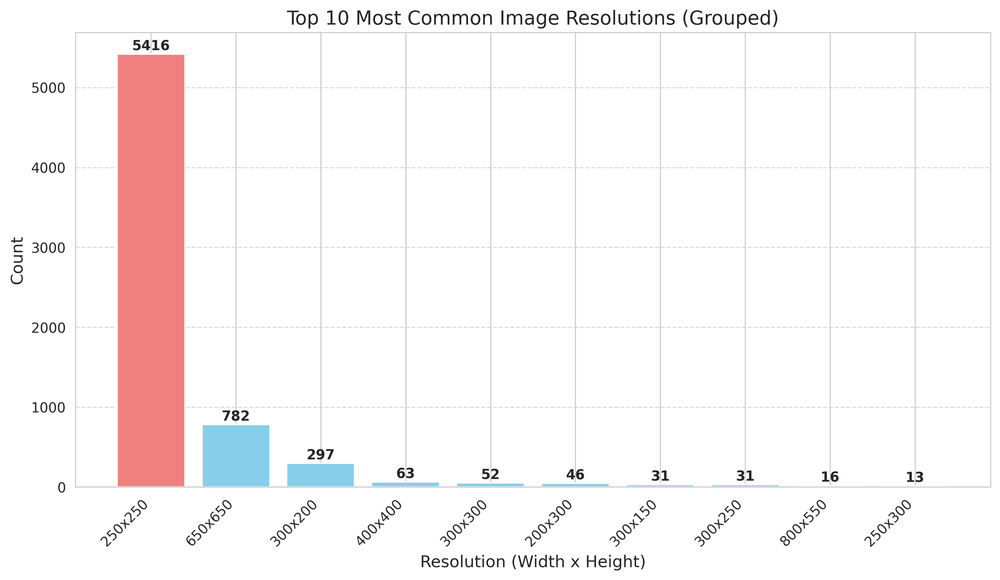

In [ ]:
import numpy as np
from collections import Counter
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import os

# Get image sizes from the training dataset
image_sizes = []
for category in os.listdir(train_path):  # Iterate through each category folder
    category_path = os.path.join(train_path, category)
    for img_file in os.listdir(category_path):  # Iterate through images in the category
        img_path = os.path.join(category_path, img_file)
        try:
            with Image.open(img_path) as img:
                image_sizes.append(img.size)  # Store image size (width, height)
        except Exception as e:
            print(f"Error processing {img_path}: {e}")  # Handle image loading errors

# Function to round resolutions to the nearest 50 pixels
def round_resolution(size, base=50):
    return (base * round(size[0] / base), base * round(size[1] / base))

# Round image resolutions for grouping
rounded_sizes = [round_resolution(size) for size in image_sizes]

# Count occurrences of each rounded resolution
size_counts = Counter(rounded_sizes)

# Convert resolution counts to a pandas DataFrame
sizes_df = pd.DataFrame(size_counts.items(), columns=["Resolution", "Count"])

# Sort resolutions by count (descending order)
sizes_df = sizes_df.sort_values(by="Count", ascending=False)

# Select the top 10 most common resolutions
top_n = 10
sizes_df_top = sizes_df.head(top_n)

# Get the most common resolution for highlighting
highlight_resolution = sizes_df_top.iloc[0]["Resolution"]

# Assign colors for the bars (highlighting the most common)
colors = ["lightcoral" if res == highlight_resolution else "skyblue" for res in sizes_df_top["Resolution"]]

# Create the bar chart
plt.figure(figsize=(12, 6), dpi=300)  # Set figure size and DPI
plt.bar(
    [f"{res[0]}x{res[1]}" for res in sizes_df_top["Resolution"]],  # X-axis: Resolutions
    sizes_df_top["Count"],  # Y-axis: Counts
    color=colors  # Bar colors
)
plt.xlabel("Resolution (Width x Height)", fontsize=12)  # X-axis label
plt.ylabel("Count", fontsize=12)  # Y-axis label
plt.title(f"Top {top_n} Most Common Image Resolutions (Grouped)", fontsize=14)  # Title
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.grid(axis="y", linestyle="--", alpha=0.7)  # Add grid lines

# Add count labels on top of bars
for i, (res, count) in enumerate(zip(sizes_df_top["Resolution"], sizes_df_top["Count"])):
    plt.text(i, count + 50, str(count), ha='center', fontsize=10, fontweight="bold")

plt.show()  # Display the chart

# **DenseNet201 without Augmentation**

Training and Evaluating a Raw DenseNet201 Model for Jute Pest Classification

In [ ]:
# Import necessary libraries
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, models
from sklearn.metrics import classification_report, confusion_matrix
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time

# Define paths to the dataset splits
DATASET_PATH = "/kaggle/working/Jute_Pest_Dataset"
train_path = os.path.join(DATASET_PATH, "train")
val_path = os.path.join(DATASET_PATH, "val")
test_path = os.path.join(DATASET_PATH, "test")

# Define image transformations for preprocessing
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

# Load datasets
train_dataset = datasets.ImageFolder(train_path, transform=transform)
val_dataset = datasets.ImageFolder(val_path, transform=transform)
test_dataset = datasets.ImageFolder(test_path, transform=transform)
train_dataset_eval = datasets.ImageFolder(train_path, transform=transform)

# Create data loaders for batch processing
batch_size = 64
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)
train_loader_eval = DataLoader(train_dataset_eval, batch_size=batch_size, shuffle=False)

# Get class names and number of classes
class_names = train_dataset.classes
num_classes = len(class_names)

# Initialize DenseNet201 (no pretraining)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = models.densenet201(weights=None)
model.classifier = nn.Linear(model.classifier.in_features, num_classes)
model = model.to(device)

# Define optimizer, loss function, and learning rate scheduler
optimizer = optim.Adam(model.parameters(), lr=0.00005)
criterion = nn.CrossEntropyLoss()
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=5)

# Training loop with early stopping
best_model_path = '/kaggle/working/best_model.pth'
best_val_acc = 0
early_stop_counter = 0
patience = 5

for epoch in range(10):
    model.train()
    running_loss, correct, total = 0.0, 0, 0

    # Iterate through batches of training data
    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        correct += (outputs.argmax(1) == labels).sum().item()
        total += labels.size(0)

    train_acc = correct / total

    # Validation
    model.eval()
    val_loss, val_correct, val_total = 0.0, 0, 0
    with torch.no_grad():
        # Iterate through batches of validation data
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            val_correct += (outputs.argmax(1) == labels).sum().item()
            val_total += labels.size(0)

    val_acc = val_correct / val_total  # Calculate validation accuracy
    val_loss /= len(val_loader)  # Calculate average validation loss
    scheduler.step(val_loss)  # Adjust learning rate based on validation loss

    print(f"Epoch {epoch+1}: Train Acc: {train_acc:.4f}, Val Acc: {val_acc:.4f}, Val Loss: {val_loss:.4f}")

    # Save the best model based on validation accuracy
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save(model.state_dict(), best_model_path)
        early_stop_counter = 0
    else:
        early_stop_counter += 1
        if early_stop_counter >= patience:
            print("Early stopping triggered.")
            break

# Load best model
model.load_state_dict(torch.load(best_model_path))
model.eval()

# Test evaluation
true_labels, pred_labels = [], []
correct, total = 0, 0

with torch.no_grad():  # Disable gradient calculation during testing
    # Iterate through the test data
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        _, predicted = torch.max(outputs.data, 1)
        true_labels.extend(labels.cpu().numpy())
        pred_labels.extend(predicted.cpu().numpy())
        correct += (predicted == labels).sum().item()
        total += labels.size(0)

test_accuracy = correct / total  # Calculate test accuracy
print(f"Test Accuracy: {test_accuracy:.4f}")
print("Classification Report:")
print(classification_report(true_labels, pred_labels, target_names=class_names))  # Print classification report
print("Confusion Matrix:")
conf_matrix = confusion_matrix(true_labels, pred_labels)  # Calculate confusion matrix
print(conf_matrix)

# Visualize the confusion matrix using a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.savefig('/kaggle/working/confusion_matrix.png')
plt.close()

# Optional: Evaluate on training set
train_true, train_pred, train_correct, train_total = [], [], 0, 0
with torch.no_grad():
    for inputs, labels in train_loader_eval:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        _, predicted = torch.max(outputs, 1)
        train_true.extend(labels.cpu().numpy())
        train_pred.extend(predicted.cpu().numpy())
        train_correct += (predicted == labels).sum().item()
        train_total += labels.size(0)

train_acc = train_correct / train_total
print(f"\nTraining Accuracy: {train_acc:.4f}")
print("Training Classification Report:")
print(classification_report(train_true, train_pred, target_names=class_names))

# Calculate and visualize the confusion matrix for the training set
train_conf_matrix = confusion_matrix(train_true, train_pred)
plt.figure(figsize=(10, 8))
sns.heatmap(train_conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.title("Training Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.savefig('/kaggle/working/train_confusion_matrix.png')
plt.close()

Epoch 1: Train Acc: 0.3003, Val Acc: 0.2998, Val Loss: 2.3255
Epoch 2: Train Acc: 0.5435, Val Acc: 0.3959, Val Loss: 2.0283
Epoch 3: Train Acc: 0.6882, Val Acc: 0.4805, Val Loss: 1.7675
Epoch 4: Train Acc: 0.7702, Val Acc: 0.5286, Val Loss: 1.5566
Epoch 5: Train Acc: 0.8220, Val Acc: 0.5606, Val Loss: 1.4700
Epoch 6: Train Acc: 0.8546, Val Acc: 0.6064, Val Loss: 1.4085
Epoch 7: Train Acc: 0.8931, Val Acc: 0.5995, Val Loss: 1.4428
Epoch 8: Train Acc: 0.9105, Val Acc: 0.5789, Val Loss: 1.4976
Epoch 9: Train Acc: 0.9237, Val Acc: 0.6270, Val Loss: 1.3839
Epoch 10: Train Acc: 0.9340, Val Acc: 0.6087, Val Loss: 1.5110


/tmp/ipykernel_31/4023925026.py:106: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(best_model_path))


Test Accuracy: 0.7781
Classification Report:
                               precision    recall  f1-score   support

                Beet Armyworm       0.43      0.15      0.22        20
                  Black Hairy       0.67      1.00      0.80        20
                      Cutworm       0.94      0.85      0.89        20
                Field Cricket       0.91      1.00      0.95        20
                  Grasshopper       0.48      0.50      0.49        22
                   Jute Aphid       0.67      1.00      0.80        22
                   Jute Hairy       0.61      1.00      0.75        20
                Jute Red Mite       0.90      0.75      0.82        24
              Jute Semilooper       0.67      0.29      0.40        21
            Jute Stem Girdler       1.00      0.83      0.91        24
             Jute Stem Weevil       0.47      0.58      0.52        24
                  Leaf Beetle       0.86      1.00      0.92        24
                     Mealybug  

Confusion Matrix Visualization of Raw DensNet201 Model

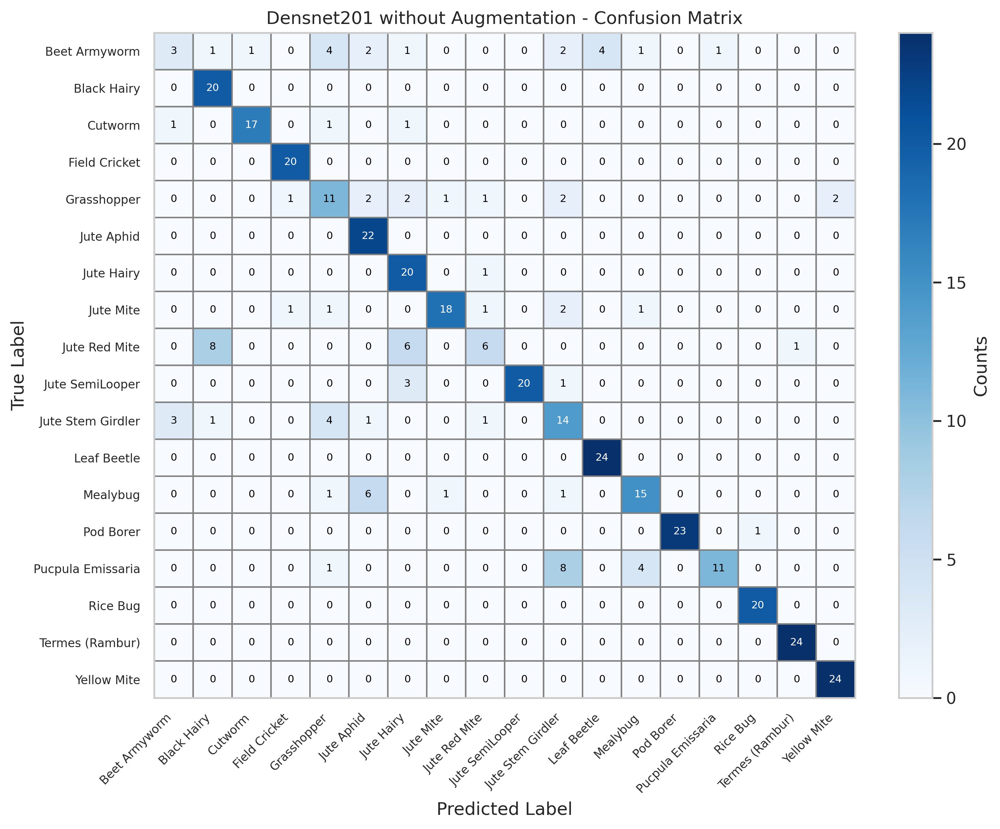

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# -------------------------------------------------------------------
# 1) CONFUSION MATRIX VALUES
# -------------------------------------------------------------------
cm = np.array([
    [ 3,  1,  1,  0,  4,  2,  1,  0,  0,  0,  2,  4,  1,  0,  1,  0,  0,  0],
    [ 0, 20,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
    [ 1,  0, 17,  0,  1,  0,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
    [ 0,  0,  0, 20,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
    [ 0,  0,  0,  1, 11,  2,  2,  1,  1,  0,  2,  0,  0,  0,  0,  0,  0,  2],
    [ 0,  0,  0,  0,  0, 22,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
    [ 0,  0,  0,  0,  0,  0, 20,  0,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0],
    [ 0,  0,  0,  1,  1,  0,  0, 18,  1,  0,  2,  0,  1,  0,  0,  0,  0,  0],
    [ 0,  8,  0,  0,  0,  0,  6,  0,  6,  0,  0,  0,  0,  0,  0,  0,  1,  0],
    [ 0,  0,  0,  0,  0,  0,  3,  0,  0, 20,  1,  0,  0,  0,  0,  0,  0,  0],
    [ 3,  1,  0,  0,  4,  1,  0,  0,  1,  0, 14,  0,  0,  0,  0,  0,  0,  0],
    [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 24,  0,  0,  0,  0,  0,  0],
    [ 0,  0,  0,  0,  1,  6,  0,  1,  0,  0,  1,  0, 15,  0,  0,  0,  0,  0],
    [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 23,  0,  1,  0,  0],
    [ 0,  0,  0,  0,  1,  0,  0,  0,  0,  0,  8,  0,  4,  0, 11,  0,  0,  0],
    [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 20,  0,  0],
    [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 24,  0],
    [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 24]
])

# -------------------------------------------------------------------
# 2) LABELS (from your figure)
# -------------------------------------------------------------------
labels = [
    "Beet Armyworm",
    "Black Hairy",
    "Cutworm",
    "Field Cricket",
    "Grasshopper",
    "Jute Aphid",
    "Jute Hairy",
    "Jute Mite",
    "Jute Red Mite",
    "Jute SemiLooper",
    "Jute Stem Girdler",
    "Leaf Beetle",
    "Mealybug",
    "Pod Borer",
    "Pucpula Emissaria",
    "Rice Bug",
    "Termes (Rambur)",
    "Yellow Mite"
]

# -------------------------------------------------------------------
# 3) PLOTTING WITH CLEAR CELL LINES
# -------------------------------------------------------------------
fig, ax = plt.subplots(figsize=(10, 8), dpi=300)

# Use pcolor to plot the matrix with black edges around each cell
# We flip cm vertically when plotting with pcolor to match typical matrix orientation
pc = ax.pcolor(cm, cmap='Blues', edgecolors='gray', linewidths=1)

# Add a colorbar (with label)
cbar = plt.colorbar(pc, ax=ax)
cbar.set_label("Counts")

# Set the axis limits to match the shape of cm
num_rows, num_cols = cm.shape
ax.set_xlim([0, num_cols])
ax.set_ylim([0, num_rows])

# Major ticks at cell centers
ax.set_xticks(np.arange(num_cols) + 0.5)
ax.set_yticks(np.arange(num_rows) + 0.5)

# Label each cell with its value
for i in range(num_rows):
    for j in range(num_cols):
        val = cm[i, j]
        # Pick a text color ensuring contrast
        color = 'white' if val > (cm.max() / 2.) else 'black'
        ax.text(j + 0.5, i + 0.5, str(val), ha='center', va='center', color=color, fontsize=7)

# Tick labels (rotating the x-axis labels for clarity)
ax.set_xticklabels(labels, rotation=45, ha='right', fontsize=8)
ax.set_yticklabels(labels, fontsize=8)
ax.invert_yaxis()


# Invert the y-axis if you prefer the first label at the top
# (By default, pcolor starts y=0 at bottom. If you want the first row on top, uncomment below.)
# ax.invert_yaxis()

# Title and axis labels
ax.set_title("Densnet201 without Augmentation - Confusion Matrix")
ax.set_xlabel("Predicted Label")
ax.set_ylabel("True Label")

plt.tight_layout()
plt.show()


# **DenseNet201 With Augmentation**

Training and Evaluating an Optimized DenseNet201 Model for Jute Pest Classification

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import torchvision
from torchvision import datasets, transforms, models
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils.class_weight import compute_class_weight
import time
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image

# Define dataset path
DATASET_PATH = "/kaggle/working/Jute_Pest_Dataset"
train_path = os.path.join(DATASET_PATH, "train")
val_path = os.path.join(DATASET_PATH, "val")
test_path = os.path.join(DATASET_PATH, "test")

# Define data transformations for training set (with augmentations)
train_transforms = transforms.Compose([
    transforms.Resize(224),
    transforms.RandomResizedCrop(224, scale=(0.5, 1.0)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3, hue=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Define data transformations for validation and test sets (without augmentations)
test_transforms = transforms.Compose([
    transforms.Resize(224),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Load datasets using the defined transformations
train_dataset = datasets.ImageFolder(train_path, transform=train_transforms)
val_dataset = datasets.ImageFolder(val_path, transform=test_transforms)
test_dataset = datasets.ImageFolder(test_path, transform=test_transforms)

# Create a separate training dataset for evaluation (no augmentations)
train_dataset_eval = datasets.ImageFolder(train_path, transform=test_transforms)

# Create data loaders for batch processing
batch_size = 64
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)
train_loader_eval = DataLoader(train_dataset_eval, batch_size=batch_size, shuffle=False)  # For evaluation

# Get the class names from the dataset
class_names = train_dataset.classes

# Initialize DenseNet201 model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = models.densenet201(weights=models.DenseNet201_Weights.IMAGENET1K_V1)
num_ftrs = model.classifier.in_features
model.classifier = nn.Linear(num_ftrs, 18)  # 18 classes for jute pests
model = model.to(device)

# Use DataParallel if multiple GPUs are available
if torch.cuda.device_count() > 1:
    model = nn.DataParallel(model)

# Unfreeze all layers for fine-tuning
for param in model.parameters():
    param.requires_grad = True

# Use DataParallel if multiple GPUs are available
class_weights = compute_class_weight('balanced', classes=np.unique(train_dataset.targets), y=train_dataset.targets)
class_weights = torch.tensor(class_weights, dtype=torch.float).to(device)
class_weights[5] *= 1.5  # Jute Hairy (index 5)
class_weights[0] *= 1.2  # Beet Armyworm (index 0)
class_weights[2] *= 1.2  # Cutworm (index 2)
class_weights[11] *= 1.2  # Mealybug (index 11)

# Define optimizer, loss function, and learning rate scheduler
optimizer = optim.Adam(model.parameters(), lr=0.0001)  # Adam optimizer with initial learning rate
criterion = nn.CrossEntropyLoss(weight=class_weights)  # Cross-entropy loss with class weights
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=3, verbose=True)  # Reduce LR on plateau

# Define Mixup and CutMix augmentation functions
def mixup_data(x, y, alpha=1.0):
    if alpha > 0:
        lam = np.random.beta(alpha, alpha)
    else:
        lam = 1
    batch_size = x.size()[0]
    index = torch.randperm(batch_size).to(device)
    mixed_x = lam * x + (1 - lam) * x[index, :]
    y_a, y_b = y, y[index]
    return mixed_x, y_a, y_b, lam

def cutmix_data(inputs, labels, alpha=1.0):
    lam = np.random.beta(alpha, alpha)
    batch_size = inputs.size()[0]
    index = torch.randperm(batch_size).to(device)
    bbx1, bby1, bbx2, bby2 = rand_bbox(inputs.size(), lam)
    inputs[:, :, bbx1:bbx2, bby1:bby2] = inputs[index, :, bbx1:bbx2, bby1:bby2]
    lam = 1 - ((bbx2 - bbx1) * (bby2 - bby1) / (inputs.size()[-1] * inputs.size()[-2]))
    return inputs, labels, labels[index], lam

def rand_bbox(size, lam):
    W = size[2]
    H = size[3]
    cut_rat = np.sqrt(1. - lam)
    cut_w = int(W * cut_rat)
    cut_h = int(H * cut_rat)
    cx = np.random.randint(W)
    cy = np.random.randint(H)
    bbx1 = np.clip(cx - cut_w // 2, 0, W)
    bby1 = np.clip(cy - cut_h // 2, 0, H)
    bbx2 = np.clip(cx + cut_w // 2, 0, W)
    bby2 = np.clip(cy + cut_h // 2, 0, H)
    return bbx1, bby1, bbx2, bby2

def mixup_criterion(criterion, pred, y_a, y_b, lam):
    return lam * criterion(pred, y_a) + (1 - lam) * criterion(pred, y_b)

# Initialize variables for training loop
best_validation_acc = 0.0
best_model_path = '/kaggle/working/best_densenet201_model.pth'
total_start_time = time.time()
patience = 5
early_stop_counter = 0
log_file = open('/kaggle/working/training_log.txt', 'w')

# Write initial information to the log file
log_file.write(f"Device: {device}\n")
log_file.write(f"Number of classes: {len(class_names)}\n")
log_file.write(f"Class names: {class_names}\n")
log_file.write(f"Adjusted Class weights: {class_weights.tolist()}\n\n")

# Training for 10 epochs
for epoch in range(10):
    start_time = time.time()
    model.train()
    running_loss = 0.0
    train_correct = 0
    total = 0

    # Iterate over the training data loader
    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()

        # Apply Mixup or CutMix augmentation randomly
        if np.random.rand() < 0.5:  # 50% Mixup
            inputs, labels_a, labels_b, lam = mixup_data(inputs, labels, alpha=1.0)
            outputs = model(inputs)
            loss = mixup_criterion(criterion, outputs, labels_a, labels_b, lam)
        else:  # 50% CutMix
            inputs, labels_a, labels_b, lam = cutmix_data(inputs, labels, alpha=1.0)
            outputs = model(inputs)
            loss = mixup_criterion(criterion, outputs, labels_a, labels_b, lam)

        loss.backward()  # Backpropagation
        optimizer.step()  # Update model parameters

        running_loss += loss.item()
        train_correct += (outputs.argmax(1) == labels).sum().item()
        total += labels.size(0)
    train_acc = train_correct / total

    # Validation phase
    model.eval()
    validation_losses = []
    validation_correct = 0
    total_val = 0

    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            predictions = model(inputs)
            loss = criterion(predictions, labels)
            validation_losses.append(loss.item())
            validation_correct += (predictions.argmax(1) == labels).sum().item()
            total_val += labels.size(0)

        validation_loss = sum(validation_losses) / len(validation_losses)
        validation_acc = validation_correct / total_val

    # Learning rate scheduling
    scheduler.step(validation_loss)

    # Log epoch results
    end_time = time.time()
    epoch_log = (f'Epoch {epoch+1}, Train Loss: {running_loss / len(train_loader):.4f}, '
                 f'Train Acc: {train_acc:.4f}, Val Loss: {validation_loss:.4f}, '
                 f'Val Acc: {validation_acc:.4f}, Time: {end_time - start_time:.2f} seconds, '
                 f'LR: {optimizer.param_groups[0]["lr"]:.6f}\n')
    print(epoch_log)
    log_file.write(epoch_log)

    # Early stopping
    if validation_acc > best_validation_acc:
        best_validation_acc = validation_acc
        torch.save(model.state_dict(), best_model_path)
        print(f"Saved best model with Val Acc: {validation_acc:.4f}")
        log_file.write(f"Saved best model with Val Acc: {validation_acc:.4f}\n")
        early_stop_counter = 0
    else:
        early_stop_counter += 1
        if early_stop_counter >= patience:
            print("Early stopping triggered")
            log_file.write("Early stopping triggered\n")
            break

# Test phase with detailed logging
model.load_state_dict(torch.load(best_model_path, weights_only=True))
model.eval()
true_labels = []
pred_labels = []
total = 0
correct = 0
sample_images_saved = 0

os.makedirs('/kaggle/working/sample_predictions', exist_ok=True)

with torch.no_grad(): # Disable gradient calculation during testing
    # Iterate over the test data loader
    for i, (inputs, labels) in enumerate(test_loader):
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        _, predicted = torch.max(outputs.data, 1)
        predicted = predicted.cpu()
        pred_labels.extend(predicted.numpy())
        true_labels.extend(labels.cpu().numpy())
        correct += (predicted == labels.cpu()).sum().item()
        total += labels.size(0)

        # Save a few misclassified images for analysis
        if predicted != labels.cpu() and sample_images_saved < 5:
            img = inputs[0].cpu().numpy().transpose(1, 2, 0)
            img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
            img = np.clip(img, 0, 1)
            plt.imshow(img)
            plt.title(f"True: {class_names[labels[0]]}, Pred: {class_names[predicted[0]]}")
            plt.savefig(f'/kaggle/working/sample_predictions/misclassified_{sample_images_saved}.png')
            plt.close()
            sample_images_saved += 1

test_accuracy = correct / total
total_end_time = time.time()  # Define total_end_time here

# Log test results
log_file.write(f'\nTotal Time: {total_end_time - total_start_time:.2f} seconds\n')
log_file.write(f'Test Accuracy: {test_accuracy:.4f}\n')
log_file.write("Classification Report:\n")
log_file.write(classification_report(true_labels, pred_labels, target_names=class_names))
log_file.write("\nConfusion Matrix:\n")
conf_matrix = confusion_matrix(true_labels, pred_labels)
log_file.write(np.array2string(conf_matrix))
log_file.write("\n")

print(f'Total Time: {total_end_time - total_start_time:.2f} seconds')
print(f'Test Accuracy: {test_accuracy:.4f}')
print("Classification Report:")
print(classification_report(true_labels, pred_labels, target_names=class_names))
print("Confusion Matrix:")
print(conf_matrix)

# Visualize the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.savefig('/kaggle/working/confusion_matrix.png')
plt.close()

# Evaluate on training dataset without augmentations
model.eval()
train_true_labels = []
train_pred_labels = []
train_total = 0
train_correct = 0

with torch.no_grad():   # Disable gradient calculation during evaluation
    # Iterate over the training data loader (without augmentations)
    for inputs, labels in train_loader_eval:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        _, predicted = torch.max(outputs.data, 1)
        predicted = predicted.cpu()
        train_pred_labels.extend(predicted.numpy())
        train_true_labels.extend(labels.cpu().numpy())
        train_correct += (predicted == labels.cpu()).sum().item()
        train_total += labels.size(0)

train_accuracy = train_correct / train_total  # Calculate training accuracy

# Log training set evaluation results
log_file.write(f'\nTraining Accuracy (without augmentations): {train_accuracy:.4f}\n')
log_file.write("Training Classification Report:\n")
log_file.write(classification_report(train_true_labels, train_pred_labels, target_names=class_names))
log_file.write("\nTraining Confusion Matrix:\n")
train_conf_matrix = confusion_matrix(train_true_labels, train_pred_labels)
log_file.write(np.array2string(train_conf_matrix))
log_file.write("\n")

print(f'\nTraining Accuracy (without augmentations): {train_accuracy:.4f}')
print("Training Classification Report:")
print(classification_report(train_true_labels, train_pred_labels, target_names=class_names))
print("Training Confusion Matrix:")
print(train_conf_matrix)

# Visualize the training confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(train_conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.title("Training Confusion Matrix (without augmentations)")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.savefig('/kaggle/working/train_confusion_matrix.png')
plt.close()

log_file.close()

Downloading: "https://download.pytorch.org/models/densenet201-c1103571.pth" to /root/.cache/torch/hub/checkpoints/densenet201-c1103571.pth
100%|██████████| 77.4M/77.4M [00:00<00:00, 210MB/s]
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch 1, Train Loss: 1.9225, Train Acc: 0.4345, Val Loss: 0.8735, Val Acc: 0.8124, Time: 131.55 seconds, LR: 0.000100

Saved best model with Val Acc: 0.8124
Epoch 2, Train Loss: 1.2789, Train Acc: 0.5835, Val Loss: 0.7320, Val Acc: 0.8513, Time: 132.28 seconds, LR: 0.000100

Saved best model with Val Acc: 0.8513
Epoch 3, Train Loss: 1.2020, Train Acc: 0.5672, Val Loss: 0.5482, Val Acc: 0.8993, Time: 132.56 seconds, LR: 0.000100

Saved best model with Val Acc: 0.8993
Epoch 4, Train Loss: 1.1173, Train Acc: 0.6443, Val Loss: 0.5662, Val Acc: 0.8696, Time: 131.70 seconds, LR: 0.000100

Epoch 5, Train Loss: 1.1543, Train Acc: 0.5793, Val Loss: 0.5025, Val Acc: 0.9085, Time: 131.92 seconds, LR: 0.000100

Saved best model with Val Acc: 0.9085
Epoch 6, Train Loss: 1.0729, Train Acc: 0.6260, Val Loss: 0.5023, Val Acc: 0.9039, Time: 132.31 seconds, LR: 0.000100

Epoch 7, Train Loss: 0.9991, Train Acc: 0.6182, Val Loss: 0.5059, Val Acc: 0.9062, Time: 133.35 seconds, LR: 0.000100

Epoch 8, Train 

Confusion Matrix Visualization of Raw DensNet201 Model

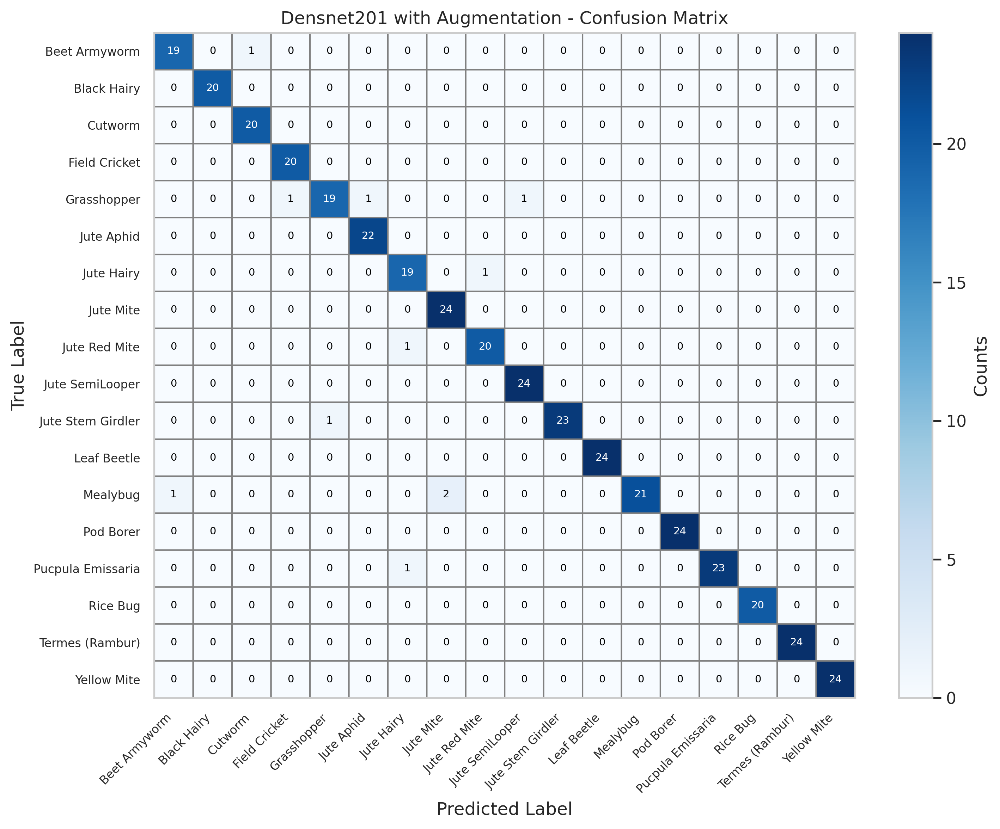

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# -------------------------------------------------------------------
# 1) CONFUSION MATRIX VALUES
# -------------------------------------------------------------------
cm = np.array([
    [19,  0,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
    [ 0, 20,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
    [ 0,  0, 20,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
    [ 0,  0,  0, 20,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
    [ 0,  0,  0,  1, 19,  1,  0,  0,  0,  1,  0,  0,  0,  0,  0,  0,  0,  0],
    [ 0,  0,  0,  0,  0, 22,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
    [ 0,  0,  0,  0,  0,  0, 19,  0,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0],
    [ 0,  0,  0,  0,  0,  0,  0, 24,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
    [ 0,  0,  0,  0,  0,  0,  1,  0, 20,  0,  0,  0,  0,  0,  0,  0,  0,  0],
    [ 0,  0,  0,  0,  0,  0,  0,  0,  0, 24,  0,  0,  0,  0,  0,  0,  0,  0],
    [ 0,  0,  0,  0,  1,  0,  0,  0,  0,  0, 23,  0,  0,  0,  0,  0,  0,  0],
    [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 24,  0,  0,  0,  0,  0,  0],
    [ 1,  0,  0,  0,  0,  0,  0,  2,  0,  0,  0,  0, 21,  0,  0,  0,  0,  0],
    [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 24,  0,  0,  0,  0],
    [ 0,  0,  0,  0,  0,  0,  1,  0,  0,  0,  0,  0,  0,  0, 23,  0,  0,  0],
    [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 20,  0,  0],
    [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 24,  0],
    [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 24]
])

# -------------------------------------------------------------------
# 2) LABELS (from your figure)
# -------------------------------------------------------------------
labels = [
    "Beet Armyworm",
    "Black Hairy",
    "Cutworm",
    "Field Cricket",
    "Grasshopper",
    "Jute Aphid",
    "Jute Hairy",
    "Jute Mite",
    "Jute Red Mite",
    "Jute SemiLooper",
    "Jute Stem Girdler",
    "Leaf Beetle",
    "Mealybug",
    "Pod Borer",
    "Pucpula Emissaria",
    "Rice Bug",
    "Termes (Rambur)",
    "Yellow Mite"
]

# -------------------------------------------------------------------
# 3) PLOTTING WITH CLEAR CELL LINES
# -------------------------------------------------------------------
fig, ax = plt.subplots(figsize=(10, 8), dpi=300)

# Use pcolor to plot the matrix with black edges around each cell
# We flip cm vertically when plotting with pcolor to match typical matrix orientation
pc = ax.pcolor(cm, cmap='Blues', edgecolors='gray', linewidths=1)

# Add a colorbar (with label)
cbar = plt.colorbar(pc, ax=ax)
cbar.set_label("Counts")

# Set the axis limits to match the shape of cm
num_rows, num_cols = cm.shape
ax.set_xlim([0, num_cols])
ax.set_ylim([0, num_rows])

# Major ticks at cell centers
ax.set_xticks(np.arange(num_cols) + 0.5)
ax.set_yticks(np.arange(num_rows) + 0.5)

# Label each cell with its value
for i in range(num_rows):
    for j in range(num_cols):
        val = cm[i, j]
        # Pick a text color ensuring contrast
        color = 'white' if val > (cm.max() / 2.) else 'black'
        ax.text(j + 0.5, i + 0.5, str(val), ha='center', va='center', color=color, fontsize=7)

# Tick labels (rotating the x-axis labels for clarity)
ax.set_xticklabels(labels, rotation=45, ha='right', fontsize=8)
ax.set_yticklabels(labels, fontsize=8)
ax.invert_yaxis()


# Invert the y-axis if you prefer the first label at the top
# (By default, pcolor starts y=0 at bottom. If you want the first row on top, uncomment below.)
# ax.invert_yaxis()

# Title and axis labels
ax.set_title("Densnet201 with Augmentation - Confusion Matrix")
ax.set_xlabel("Predicted Label")
ax.set_ylabel("True Label")

plt.tight_layout()
plt.show()


# **EfficientV2 Without Augmentation**

Training and Evaluating Raw EfficientNetV2-S for Jute Pest Classification

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, models
from sklearn.metrics import classification_report, confusion_matrix
import os
import time
import numpy as np
import gc

# Define paths to the Jute Pest Dataset splits
DATASET_PATH = "/kaggle/working/Jute_Pest_Dataset"
train_path = os.path.join(DATASET_PATH, "train")
val_path = os.path.join(DATASET_PATH, "val")
test_path = os.path.join(DATASET_PATH, "test")

# Define image transformations for preprocessing (resize and center crop to 384x384, convert to tensor)
basic_transform = transforms.Compose([
    transforms.Resize(384),          # Resize shorter side to 384
    transforms.CenterCrop(384),      # Crop to 384x384
    transforms.ToTensor()
])

# Load the training, validation, and test datasets using ImageFolder
train_dataset = datasets.ImageFolder(train_path, transform=basic_transform)
val_dataset = datasets.ImageFolder(val_path, transform=basic_transform)
test_dataset = datasets.ImageFolder(test_path, transform=basic_transform)

# Create DataLoaders for batch processing
batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

# Get class names and the number of classes in the dataset
class_names = train_dataset.classes
num_classes = len(class_names)

# Set device to GPU if available, otherwise CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Model: EfficientNetV2-S without pretrained weights
model = models.efficientnet_v2_s(weights=None)
model.classifier = nn.Linear(model.classifier[1].in_features, num_classes)
model = model.to(device)

# Define the optimizer (Adam), loss function (CrossEntropyLoss), and learning rate
optimizer = optim.Adam(model.parameters(), lr=0.00005)
criterion = nn.CrossEntropyLoss()

# Initialize training parameters for early stopping
best_val_acc = 0.0
early_stop_counter = 0
patience = 5
best_model_path = "/kaggle/working/best_model.pth"

# Training loop
for epoch in range(10):
    model.train()
    running_loss, correct, total = 0.0, 0, 0

    # Iterate through batches of training data
    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        correct += (outputs.argmax(1) == labels).sum().item()
        total += labels.size(0)

        # Clear intermediate variables at batch level --------
        del inputs, labels, outputs, loss
        gc.collect()
        torch.cuda.empty_cache()
        #------------------------
    train_acc = correct / total

    # Validation
    model.eval()
    val_loss, val_correct, val_total = 0.0, 0, 0
    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            val_correct += (outputs.argmax(1) == labels).sum().item()
            val_total += labels.size(0)

            # Clear batch-level temporary tensors -----------
            del inputs, labels, outputs, loss
            gc.collect()
            torch.cuda.empty_cache()
            #---------------------------

    val_acc = val_correct / val_total
    val_loss /= len(val_loader)

    # Print training and validation metrics for the epoch
    print(f"Epoch {epoch+1}: Train Acc: {train_acc:.4f}, Val Acc: {val_acc:.4f}, Val Loss: {val_loss:.4f}")

    # Save the model if validation accuracy improves
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save(model.state_dict(), best_model_path)
        early_stop_counter = 0
    else:
        early_stop_counter += 1
        if early_stop_counter >= patience:
            print("Early stopping triggered.")
            break

    # Clean up memory at the end of each epoch----------
    gc.collect()
    torch.cuda.empty_cache()
    #-----------------------

# Load best model for testing
model.load_state_dict(torch.load(best_model_path))
model.eval()

# Test phase: evaluate the model on the test dataset
true_labels = []
pred_labels = []
correct, total = 0, 0

with torch.no_grad():   # Disable gradient calculation during testing
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        _, predicted = torch.max(outputs, 1)
        pred_labels.extend(predicted.cpu().numpy())
        true_labels.extend(labels.cpu().numpy())
        correct += (predicted == labels).sum().item()
        total += labels.size(0)

        # Clear batch-level temporary variables --------------
        del inputs, labels, outputs, predicted
        gc.collect()
        torch.cuda.empty_cache()

test_acc = correct / total
print(f"\nTest Accuracy: {test_acc:.4f}")
print("\nClassification Report:")
print(classification_report(true_labels, pred_labels, target_names=class_names))
print("Confusion Matrix:")
print(confusion_matrix(true_labels, pred_labels))

Epoch 1: Train Acc: 0.1457, Val Acc: 0.2037, Val Loss: 3.9254
Epoch 2: Train Acc: 0.2586, Val Acc: 0.2700, Val Loss: 2.8265
Epoch 3: Train Acc: 0.3599, Val Acc: 0.3387, Val Loss: 2.3900
Epoch 4: Train Acc: 0.4440, Val Acc: 0.3684, Val Loss: 2.1678
Epoch 5: Train Acc: 0.5136, Val Acc: 0.4485, Val Loss: 2.5217
Epoch 6: Train Acc: 0.5691, Val Acc: 0.5011, Val Loss: 2.2082
Epoch 7: Train Acc: 0.6137, Val Acc: 0.5034, Val Loss: 2.1205
Epoch 8: Train Acc: 0.6621, Val Acc: 0.5492, Val Loss: 2.0616
Epoch 9: Train Acc: 0.7011, Val Acc: 0.5103, Val Loss: 1.9791
Epoch 10: Train Acc: 0.7267, Val Acc: 0.5606, Val Loss: 1.8188


/tmp/ipykernel_31/4140651009.py:120: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(best_model_path))



Test Accuracy: 0.7681

Classification Report:
                               precision    recall  f1-score   support

                Beet Armyworm       0.25      0.05      0.08        20
                  Black Hairy       0.71      0.85      0.77        20
                      Cutworm       0.39      0.65      0.49        20
                Field Cricket       0.57      0.60      0.59        20
                  Grasshopper       0.60      0.14      0.22        22
                   Jute Aphid       0.71      1.00      0.83        22
                   Jute Hairy       0.82      0.70      0.76        20
                Jute Red Mite       0.83      0.83      0.83        24
              Jute Semilooper       0.91      0.95      0.93        21
            Jute Stem Girdler       0.96      0.92      0.94        24
             Jute Stem Weevil       0.75      0.88      0.81        24
                  Leaf Beetle       0.89      1.00      0.94        24
                     Mealybug

Confusion Matrix Visualization of Raw EfficientNetV2-S Model

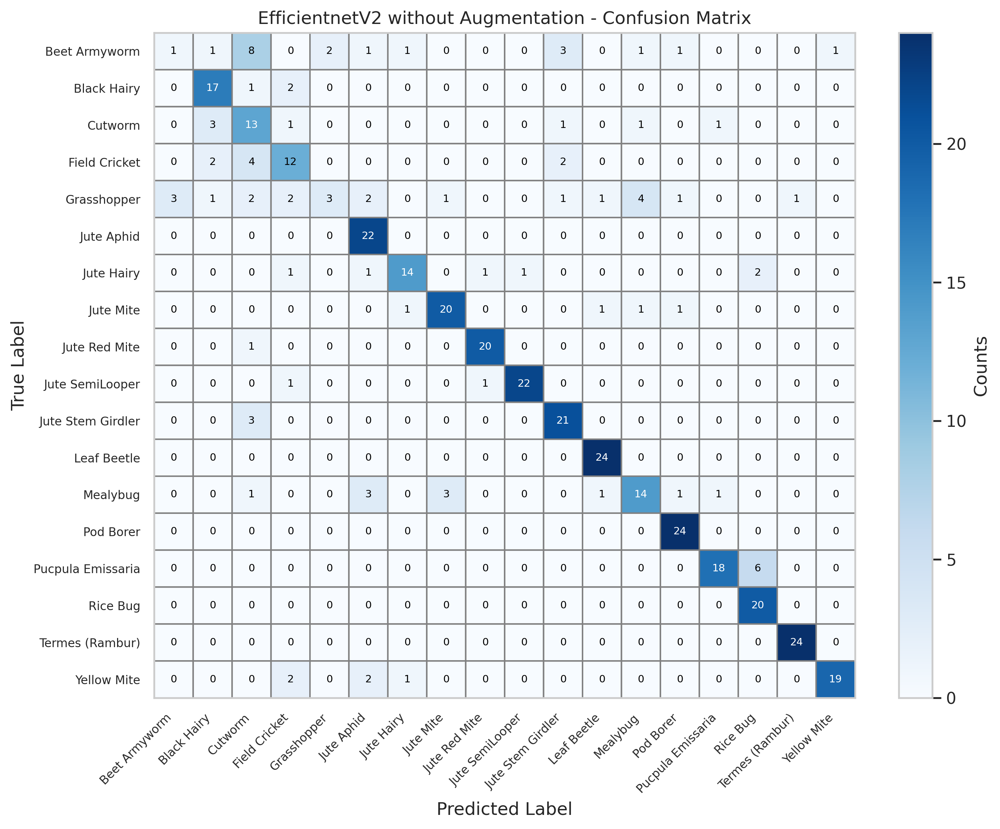

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# -------------------------------------------------------------------
# 1) CONFUSION MATRIX VALUES
# -------------------------------------------------------------------
cm = np.array([
    [ 1,  1,  8,  0,  2,  1,  1,  0,  0,  0,  3,  0,  1,  1,  0,  0,  0,  1],
    [ 0, 17,  1,  2,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
    [ 0,  3, 13,  1,  0,  0,  0,  0,  0,  0,  1,  0,  1,  0,  1,  0,  0,  0],
    [ 0,  2,  4, 12,  0,  0,  0,  0,  0,  0,  2,  0,  0,  0,  0,  0,  0,  0],
    [ 3,  1,  2,  2,  3,  2,  0,  1,  0,  0,  1,  1,  4,  1,  0,  0,  1,  0],
    [ 0,  0,  0,  0,  0, 22,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
    [ 0,  0,  0,  1,  0,  1, 14,  0,  1,  1,  0,  0,  0,  0,  0,  2,  0,  0],
    [ 0,  0,  0,  0,  0,  0,  1, 20,  0,  0,  0,  1,  1,  1,  0,  0,  0,  0],
    [ 0,  0,  1,  0,  0,  0,  0,  0, 20,  0,  0,  0,  0,  0,  0,  0,  0,  0],
    [ 0,  0,  0,  1,  0,  0,  0,  0,  1, 22,  0,  0,  0,  0,  0,  0,  0,  0],
    [ 0,  0,  3,  0,  0,  0,  0,  0,  0,  0, 21,  0,  0,  0,  0,  0,  0,  0],
    [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 24,  0,  0,  0,  0,  0,  0],
    [ 0,  0,  1,  0,  0,  3,  0,  3,  0,  0,  0,  1, 14,  1,  1,  0,  0,  0],
    [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 24,  0,  0,  0,  0],
    [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 18,  6,  0,  0],
    [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 20,  0,  0],
    [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 24,  0],
    [ 0,  0,  0,  2,  0,  2,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 19]
])

# -------------------------------------------------------------------
# 2) LABELS (from your figure)
# -------------------------------------------------------------------
labels = [
    "Beet Armyworm",
    "Black Hairy",
    "Cutworm",
    "Field Cricket",
    "Grasshopper",
    "Jute Aphid",
    "Jute Hairy",
    "Jute Mite",
    "Jute Red Mite",
    "Jute SemiLooper",
    "Jute Stem Girdler",
    "Leaf Beetle",
    "Mealybug",
    "Pod Borer",
    "Pucpula Emissaria",
    "Rice Bug",
    "Termes (Rambur)",
    "Yellow Mite"
]

# -------------------------------------------------------------------
# 3) PLOTTING WITH CLEAR CELL LINES
# -------------------------------------------------------------------
fig, ax = plt.subplots(figsize=(10, 8), dpi=300)

# Use pcolor to plot the matrix with black edges around each cell
# We flip cm vertically when plotting with pcolor to match typical matrix orientation
pc = ax.pcolor(cm, cmap='Blues', edgecolors='gray', linewidths=1)

# Add a colorbar (with label)
cbar = plt.colorbar(pc, ax=ax)
cbar.set_label("Counts")

# Set the axis limits to match the shape of cm
num_rows, num_cols = cm.shape
ax.set_xlim([0, num_cols])
ax.set_ylim([0, num_rows])

# Major ticks at cell centers
ax.set_xticks(np.arange(num_cols) + 0.5)
ax.set_yticks(np.arange(num_rows) + 0.5)

# Label each cell with its value
for i in range(num_rows):
    for j in range(num_cols):
        val = cm[i, j]
        # Pick a text color ensuring contrast
        color = 'white' if val > (cm.max() / 2.) else 'black'
        ax.text(j + 0.5, i + 0.5, str(val), ha='center', va='center', color=color, fontsize=7)

# Tick labels (rotating the x-axis labels for clarity)
ax.set_xticklabels(labels, rotation=45, ha='right', fontsize=8)
ax.set_yticklabels(labels, fontsize=8)
ax.invert_yaxis()


# Invert the y-axis if you prefer the first label at the top

# Title and axis labels
ax.set_title("EfficientnetV2 without Augmentation - Confusion Matrix")
ax.set_xlabel("Predicted Label")
ax.set_ylabel("True Label")

plt.tight_layout()
plt.show()


# **EfficientV2 With Augmentation**

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import torchvision
from torchvision import datasets, transforms, models
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils.class_weight import compute_class_weight
import time
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import gc

# --- 1. Data Loading and Preprocessing ---
# Define dataset path
DATASET_PATH = "/kaggle/working/Jute_Pest_Dataset"
train_path = os.path.join(DATASET_PATH, "train")
val_path = os.path.join(DATASET_PATH, "val")
test_path = os.path.join(DATASET_PATH, "test")

# Define data transformations for the training set (with augmentations)
# These transformations help to make the model more robust to variations in the input data
train_transforms = transforms.Compose([
    transforms.Resize(384),  # Adjusted to 384 for EfficientNetV2
    transforms.RandomResizedCrop(384, scale=(0.5, 1.0)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3, hue=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Define data transformations for the validation and test sets (without augmentations)
test_transforms = transforms.Compose([
    transforms.Resize(384),
    transforms.CenterCrop(384),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Load the datasets using the defined transformations
train_dataset = datasets.ImageFolder(train_path, transform=train_transforms)
val_dataset = datasets.ImageFolder(val_path, transform=test_transforms)
test_dataset = datasets.ImageFolder(test_path, transform=test_transforms)

# Create a separate training dataset for evaluation (no augmentations)
train_dataset_eval = datasets.ImageFolder(train_path, transform=test_transforms)

# Create data loaders to efficiently iterate over the datasets in batches during training and evaluation
batch_size = 16
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)
train_loader_eval = DataLoader(train_dataset_eval, batch_size=batch_size, shuffle=False)  # For evaluation

# Get the class names from the dataset
class_names = train_dataset.classes

# --- 2. Model Initialization and Setup ---
# Set the device to use for training (GPU if available, otherwise CPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# Load a pre-trained EfficientNetV2-L model from torchvision.models
model = models.efficientnet_v2_l(weights=models.EfficientNet_V2_L_Weights.IMAGENET1K_V1)
# Get the number of features in the final layer of the pre-trained model
num_ftrs = model.classifier[1].in_features
# Replace the classifier head of the pre-trained model with a new one for our specific task (18 classes)
model.classifier = nn.Sequential(
    nn.Dropout(p=0.4, inplace=True),  # Dropout layer for regularization
    nn.Linear(num_ftrs, 18)  # Linear layer to output predictions for 18 classes
)
# Move the model to the selected device (GPU or CPU)
model = model.to(device)

# Use DataParallel if multiple GPUs are available
if torch.cuda.device_count() > 1:
    model = nn.DataParallel(model)

# Unfreeze all layers in the model for fine-tuning
for param in model.parameters():
    param.requires_grad = True

# --- 3. Class Weighting and Loss Function ---
# Compute class weights and adjust for specific classes
class_weights = compute_class_weight('balanced', classes=np.unique(train_dataset.targets), y=train_dataset.targets)
class_weights = torch.tensor(class_weights, dtype=torch.float).to(device)
class_weights[5] *= 1.5  # Jute Hairy (index 5)
class_weights[0] *= 1.2  # Beet Armyworm (index 0)
class_weights[2] *= 1.2  # Cutworm (index 2)
class_weights[11] *= 1.2  # Mealybug (index 11)

# Define the optimizer, loss function, and learning rate scheduler
optimizer = optim.Adam(model.parameters(), lr=0.00005)  # Lowered learning rate slightly for the larger model
criterion = nn.CrossEntropyLoss(weight=class_weights)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=3, verbose=True)

# --- 4. Mixup and CutMix Augmentations ---
# Define functions for Mixup and CutMix data augmentation techniques
# These techniques help to improve model generalization and robustness
def mixup_data(x, y, alpha=1.0):
    if alpha > 0:
        lam = np.random.beta(alpha, alpha)
    else:
        lam = 1
    batch_size = x.size()[0]
    index = torch.randperm(batch_size).to(device)
    mixed_x = lam * x + (1 - lam) * x[index, :]
    y_a, y_b = y, y[index]
    return mixed_x, y_a, y_b, lam

def cutmix_data(inputs, labels, alpha=1.0):
    lam = np.random.beta(alpha, alpha)
    batch_size = inputs.size()[0]
    index = torch.randperm(batch_size).to(device)
    bbx1, bby1, bbx2, bby2 = rand_bbox(inputs.size(), lam)
    inputs[:, :, bbx1:bbx2, bby1:bby2] = inputs[index, :, bbx1:bbx2, bby1:bby2]
    lam = 1 - ((bbx2 - bbx1) * (bby2 - bby1) / (inputs.size()[-1] * inputs.size()[-2]))
    return inputs, labels, labels[index], lam

def rand_bbox(size, lam):
    W = size[2]
    H = size[3]
    cut_rat = np.sqrt(1. - lam)
    cut_w = int(W * cut_rat)
    cut_h = int(H * cut_rat)
    cx = np.random.randint(W)
    cy = np.random.randint(H)
    bbx1 = np.clip(cx - cut_w // 2, 0, W)
    bby1 = np.clip(cy - cut_h // 2, 0, H)
    bbx2 = np.clip(cx + cut_w // 2, 0, W)
    bby2 = np.clip(cy + cut_h // 2, 0, H)
    return bbx1, bby1, bbx2, bby2

def mixup_criterion(criterion, pred, y_a, y_b, lam):
    return lam * criterion(pred, y_a) + (1 - lam) * criterion(pred, y_b)

# Initialize the GradScaler for mixed precision training
scaler = torch.cuda.amp.GradScaler()

# --- 5. Training Loop ---
# Initialize variables for tracking the best model and early stopping
best_validation_acc = 0.0
best_model_path = '/kaggle/working/best_efficientnetv2_l_model.pth'
total_start_time = time.time()
patience = 5
early_stop_counter = 0
log_file = open('/kaggle/working/training_log.txt', 'w')

log_file.write(f"Device: {device}\n")
log_file.write(f"Number of classes: {len(class_names)}\n")
log_file.write(f"Class names: {class_names}\n")
log_file.write(f"Adjusted Class weights: {class_weights.tolist()}\n\n")

# Training for 10 epochs
for epoch in range(10):
    start_time = time.time()
    model.train()
    running_loss = 0.0
    train_correct = 0
    total = 0

    # Iterate over batches of training data
    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()

        with torch.cuda.amp.autocast():
            # Apply Mixup or CutMix with 50% probability each
            if np.random.rand() < 0.5:  # 50% Mixup
                inputs, labels_a, labels_b, lam = mixup_data(inputs, labels, alpha=1.0)
                outputs = model(inputs)
                loss = mixup_criterion(criterion, outputs, labels_a, labels_b, lam)
            else:  # 50% CutMix
                inputs, labels_a, labels_b, lam = cutmix_data(inputs, labels, alpha=1.0)
                outputs = model(inputs)
                loss = mixup_criterion(criterion, outputs, labels_a, labels_b, lam)

        scaler.scale(loss).backward()  # Scale the loss and perform backpropagation
        scaler.step(optimizer)  # Update the model's parameters
        scaler.update()  # Update the GradScaler

        running_loss += loss.item()
        train_correct += (outputs.argmax(1) == labels).sum().item()
        total += labels.size(0)

         # Clean up temporary tensors to free GPU memory after each batch  #----------------
        del inputs, labels, labels_a, labels_b, lam, outputs, loss
        gc.collect()
        torch.cuda.empty_cache()

    train_acc = train_correct / total

    # Validation phase
    model.eval()
    validation_losses = []
    validation_correct = 0
    total_val = 0

    with torch.no_grad():   # Disable gradient calculations during validation
        # Iterate over batches of validation data
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            with torch.cuda.amp.autocast():
                predictions = model(inputs)
                loss = criterion(predictions, labels)
            validation_losses.append(loss.item())
            validation_correct += (predictions.argmax(1) == labels).sum().item()
            total_val += labels.size(0)

            # Clean up validation batch tensors ----------------
            del inputs, labels, predictions, loss
            gc.collect()
            torch.cuda.empty_cache()

        validation_loss = sum(validation_losses) / len(validation_losses)
        validation_acc = validation_correct / total_val

    # Learning rate scheduling
    scheduler.step(validation_loss)

    # Logging
    end_time = time.time()
    epoch_log = (f'Epoch {epoch+1}, Train Loss: {running_loss / len(train_loader):.4f}, '
                 f'Train Acc: {train_acc:.4f}, Val Loss: {validation_loss:.4f}, '
                 f'Val Acc: {validation_acc:.4f}, Time: {end_time - start_time:.2f} seconds, '
                 f'LR: {optimizer.param_groups[0]["lr"]:.6f}\n')
    print(epoch_log)
    log_file.write(epoch_log)

    # Early stopping
    if validation_acc > best_validation_acc:
        best_validation_acc = validation_acc
        torch.save(model.state_dict(), best_model_path)
        print(f"Saved best model with Val Acc: {validation_acc:.4f}")
        log_file.write(f"Saved best model with Val Acc: {validation_acc:.4f}\n")
        early_stop_counter = 0
    else:
        early_stop_counter += 1
        if early_stop_counter >= patience:
            print("Early stopping triggered")
            log_file.write("Early stopping triggered\n")
            break

     # Clean up after each epoch---------------
    gc.collect()
    torch.cuda.empty_cache()

# --- 6. Testing and Evaluation ---
# Load the best model for testing
model.load_state_dict(torch.load(best_model_path, map_location=device))
model.eval()
true_labels = []
pred_labels = []
total = 0
correct = 0
sample_images_saved = 0

os.makedirs('/kaggle/working/sample_predictions', exist_ok=True)

with torch.no_grad():   # Disable gradient calculations during testing
    # Iterate over the test data
    for i, (inputs, labels) in enumerate(test_loader):
        inputs, labels = inputs.to(device), labels.to(device)
        with torch.cuda.amp.autocast():
            outputs = model(inputs)
        _, predicted = torch.max(outputs.data, 1)
        predicted = predicted.cpu()
        pred_labels.extend(predicted.numpy())
        true_labels.extend(labels.cpu().numpy())
        correct += (predicted == labels.cpu()).sum().item()
        total += labels.size(0)

        # Save sample images of misclassified predictions for analysis (up to 5 images)
        if predicted != labels.cpu() and sample_images_saved < 5:
            img = inputs[0].cpu().numpy().transpose(1, 2, 0)
            img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
            img = np.clip(img, 0, 1)
            plt.imshow(img)
            plt.title(f"True: {class_names[labels[0]]}, Pred: {class_names[predicted[0]]}")
            plt.savefig(f'/kaggle/working/sample_predictions/misclassified_{sample_images_saved}.png')
            plt.close()
            sample_images_saved += 1

test_accuracy = correct / total
total_end_time = time.time()

# --- Logging Test Results ---
log_file.write(f'\nTotal Time: {total_end_time - total_start_time:.2f} seconds\n')
log_file.write(f'Test Accuracy: {test_accuracy:.4f}\n')
log_file.write("Classification Report:\n")
log_file.write(classification_report(true_labels, pred_labels, target_names=class_names))
log_file.write("\nConfusion Matrix:\n")
conf_matrix = confusion_matrix(true_labels, pred_labels)
log_file.write(np.array2string(conf_matrix))
log_file.write("\n")

# Print test results to the console
print(f'Total Time: {total_end_time - total_start_time:.2f} seconds')
print(f'Test Accuracy: {test_accuracy:.4f}')
print("Classification Report:")
print(classification_report(true_labels, pred_labels, target_names=class_names))
print("Confusion Matrix:")
print(conf_matrix)

# --- Visualize Confusion Matrix ---
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.savefig('/kaggle/working/confusion_matrix.png')
plt.close()

# --- 7. Evaluate on Training Set (without augmentations) ---
model.eval()
train_true_labels = []
train_pred_labels = []
train_total = 0
train_correct = 0

with torch.no_grad():
    for inputs, labels in train_loader_eval:
        inputs, labels = inputs.to(device), labels.to(device)
        with torch.cuda.amp.autocast():
            outputs = model(inputs)
        _, predicted = torch.max(outputs.data, 1)
        predicted = predicted.cpu()
        train_pred_labels.extend(predicted.numpy())
        train_true_labels.extend(labels.cpu().numpy())
        train_correct += (predicted == labels.cpu()).sum().item()
        train_total += labels.size(0)

        # Clean up evaluation batch tensors ----------
        del inputs, labels, outputs, predicted
        gc.collect()
        torch.cuda.empty_cache()
        #--------------------
train_accuracy = train_correct / train_total

log_file.write(f'\nTraining Accuracy (without augmentations): {train_accuracy:.4f}\n')
log_file.write("Training Classification Report:\n")
log_file.write(classification_report(train_true_labels, train_pred_labels, target_names=class_names))
log_file.write("\nTraining Confusion Matrix:\n")
train_conf_matrix = confusion_matrix(train_true_labels, train_pred_labels)
log_file.write(np.array2string(train_conf_matrix))
log_file.write("\n")

print(f'\nTraining Accuracy (without augmentations): {train_accuracy:.4f}')
print("Training Classification Report:")
print(classification_report(train_true_labels, train_pred_labels, target_names=class_names))
print("Training Confusion Matrix:")
print(train_conf_matrix)

plt.figure(figsize=(10, 8))
sns.heatmap(train_conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.title("Training Confusion Matrix (without augmentations)")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.savefig('/kaggle/working/train_confusion_matrix.png')
plt.close()

log_file.close()


Downloading: "https://download.pytorch.org/models/efficientnet_v2_l-59c71312.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_v2_l-59c71312.pth
100%|██████████| 455M/455M [00:02<00:00, 202MB/s]  
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/tmp/ipykernel_31/3699656008.py:128: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler()
/tmp/ipykernel_31/3699656008.py:155: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
/tmp/ipykernel_31/3699656008.py:191: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Epoch 1, Train Loss: 1.9964, Train Acc: 0.3711, Val Loss: 0.7758, Val Acc: 0.8924, Time: 673.03 seconds, LR: 0.000050

Saved best model with Val Acc: 0.8924
Epoch 2, Train Loss: 1.4231, Train Acc: 0.5317, Val Loss: 0.5091, Val Acc: 0.9062, Time: 671.05 seconds, LR: 0.000050

Saved best model with Val Acc: 0.9062
Epoch 3, Train Loss: 1.3008, Train Acc: 0.5663, Val Loss: 0.5118, Val Acc: 0.9016, Time: 671.07 seconds, LR: 0.000050

Epoch 4, Train Loss: 1.2201, Train Acc: 0.5999, Val Loss: 0.5222, Val Acc: 0.8993, Time: 670.95 seconds, LR: 0.000050

Epoch 5, Train Loss: 1.1467, Train Acc: 0.6028, Val Loss: 0.6094, Val Acc: 0.8924, Time: 671.34 seconds, LR: 0.000050

Epoch 6, Train Loss: 1.1347, Train Acc: 0.6198, Val Loss: 0.4602, Val Acc: 0.9291, Time: 665.42 seconds, LR: 0.000050

Saved best model with Val Acc: 0.9291
Epoch 7, Train Loss: 1.0698, Train Acc: 0.6281, Val Loss: 0.4041, Val Acc: 0.9314, Time: 664.10 seconds, LR: 0.000050

Saved best model with Val Acc: 0.9314
Epoch 8, Train 

/tmp/ipykernel_31/3699656008.py:239: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(best_model_path, map_location=device))
/tmp/ipykernel_31/

Total Time: 6731.02 seconds
Test Accuracy: 0.9776
Classification Report:
                               precision    recall  f1-score   support

                Beet Armyworm       0.86      0.95      0.90        20
                  Black Hairy       0.91      1.00      0.95        20
                      Cutworm       0.94      0.85      0.89        20
                Field Cricket       1.00      1.00      1.00        20
                  Grasshopper       1.00      1.00      1.00        22
                   Jute Aphid       1.00      1.00      1.00        22
                   Jute Hairy       1.00      0.90      0.95        20
                Jute Red Mite       1.00      1.00      1.00        24
              Jute Semilooper       0.91      1.00      0.95        21
            Jute Stem Girdler       1.00      1.00      1.00        24
             Jute Stem Weevil       1.00      0.92      0.96        24
                  Leaf Beetle       1.00      1.00      1.00        24
   

/tmp/ipykernel_31/3699656008.py:308: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():



Training Accuracy (without augmentations): 0.9926
Training Classification Report:
                               precision    recall  f1-score   support

                Beet Armyworm       0.92      0.99      0.95       199
                  Black Hairy       0.97      1.00      0.99       309
                      Cutworm       0.98      0.97      0.97       399
                Field Cricket       1.00      1.00      1.00       392
                  Grasshopper       1.00      1.00      1.00       439
                   Jute Aphid       0.99      1.00      0.99       531
                   Jute Hairy       0.99      0.98      0.99       414
                Jute Red Mite       1.00      1.00      1.00       457
              Jute Semilooper       0.99      1.00      1.00       372
            Jute Stem Girdler       1.00      1.00      1.00       281
             Jute Stem Weevil       1.00      0.99      0.99       676
                  Leaf Beetle       1.00      1.00      1.00    

Confusion Matrix Visualization of Optimized EfficientNetV2 Model

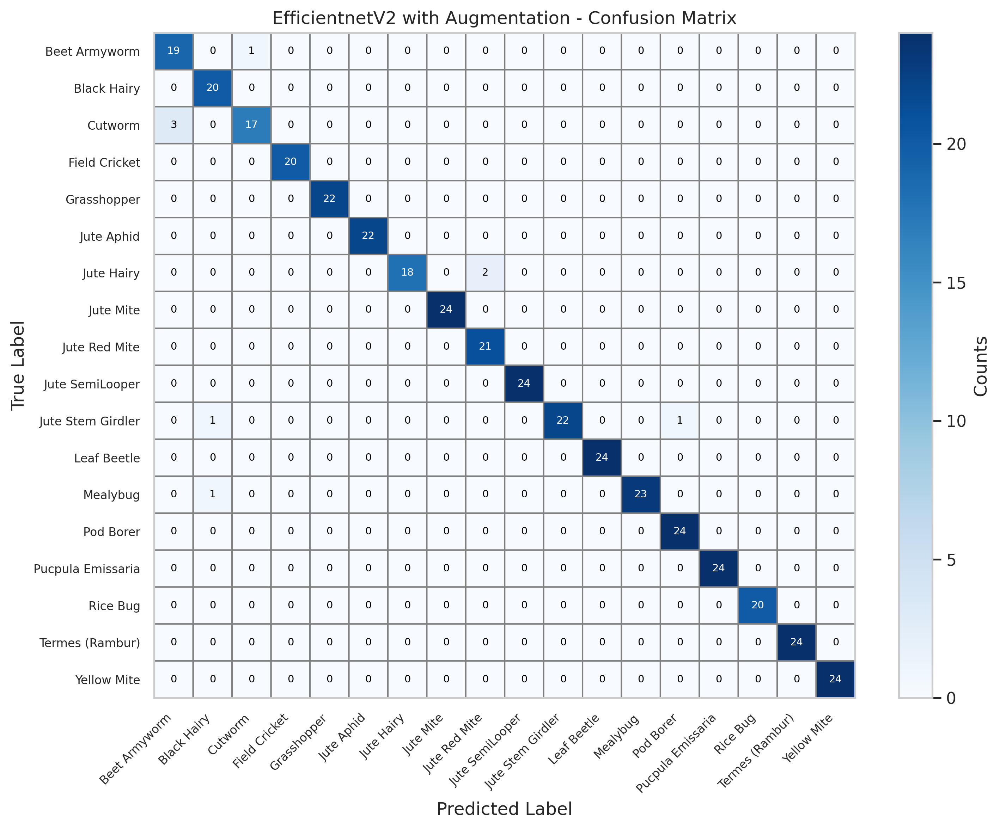

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# -------------------------------------------------------------------
# 1) CONFUSION MATRIX VALUES
# -------------------------------------------------------------------
cm = np.array([
    [19,  0,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
    [ 0, 20,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
    [ 3,  0, 17,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
    [ 0,  0,  0, 20,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
    [ 0,  0,  0,  0, 22,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
    [ 0,  0,  0,  0,  0, 22,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
    [ 0,  0,  0,  0,  0,  0, 18,  0,  2,  0,  0,  0,  0,  0,  0,  0,  0,  0],
    [ 0,  0,  0,  0,  0,  0,  0, 24,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
    [ 0,  0,  0,  0,  0,  0,  0,  0, 21,  0,  0,  0,  0,  0,  0,  0,  0,  0],
    [ 0,  0,  0,  0,  0,  0,  0,  0,  0, 24,  0,  0,  0,  0,  0,  0,  0,  0],
    [ 0,  1,  0,  0,  0,  0,  0,  0,  0,  0, 22,  0,  0,  1,  0,  0,  0,  0],
    [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 24,  0,  0,  0,  0,  0,  0],
    [ 0,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 23,  0,  0,  0,  0,  0],
    [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 24,  0,  0,  0,  0],
    [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 24,  0,  0,  0],
    [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 20,  0,  0],
    [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 24,  0],
    [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 24]
])

# -------------------------------------------------------------------
# 2) LABELS (from your figure)
# -------------------------------------------------------------------
labels = [
    "Beet Armyworm",
    "Black Hairy",
    "Cutworm",
    "Field Cricket",
    "Grasshopper",
    "Jute Aphid",
    "Jute Hairy",
    "Jute Mite",
    "Jute Red Mite",
    "Jute SemiLooper",
    "Jute Stem Girdler",
    "Leaf Beetle",
    "Mealybug",
    "Pod Borer",
    "Pucpula Emissaria",
    "Rice Bug",
    "Termes (Rambur)",
    "Yellow Mite"
]

# -------------------------------------------------------------------
# 3) PLOTTING WITH CLEAR CELL LINES
# -------------------------------------------------------------------
fig, ax = plt.subplots(figsize=(10, 8), dpi=300)

# Use pcolor to plot the matrix with black edges around each cell
# We flip cm vertically when plotting with pcolor to match typical matrix orientation
pc = ax.pcolor(cm, cmap='Blues', edgecolors='gray', linewidths=1)

# Add a colorbar (with label)
cbar = plt.colorbar(pc, ax=ax)
cbar.set_label("Counts")

# Set the axis limits to match the shape of cm
num_rows, num_cols = cm.shape
ax.set_xlim([0, num_cols])
ax.set_ylim([0, num_rows])

# Major ticks at cell centers
ax.set_xticks(np.arange(num_cols) + 0.5)
ax.set_yticks(np.arange(num_rows) + 0.5)

# Label each cell with its value
for i in range(num_rows):
    for j in range(num_cols):
        val = cm[i, j]
        # Pick a text color ensuring contrast
        color = 'white' if val > (cm.max() / 2.) else 'black'
        ax.text(j + 0.5, i + 0.5, str(val), ha='center', va='center', color=color, fontsize=7)

# Tick labels (rotating the x-axis labels for clarity)
ax.set_xticklabels(labels, rotation=45, ha='right', fontsize=8)
ax.set_yticklabels(labels, fontsize=8)
ax.invert_yaxis()


# Invert the y-axis if you prefer the first label at the top
# (By default, pcolor starts y=0 at bottom. If you want the first row on top, uncomment below.)
# ax.invert_yaxis()

# Title and axis labels
ax.set_title("EfficientnetV2 with Augmentation - Confusion Matrix")
ax.set_xlabel("Predicted Label")
ax.set_ylabel("True Label")

plt.tight_layout()
plt.show()


# **InceptonV3 Without Augmentation**

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, models
from sklearn.metrics import classification_report, confusion_matrix
import time
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import gc

# Define paths to the dataset
DATASET_PATH = "/kaggle/working/Jute_Pest_Dataset"
train_path = os.path.join(DATASET_PATH, "train")
val_path = os.path.join(DATASET_PATH, "val")
test_path = os.path.join(DATASET_PATH, "test")

# Define image transformations for preprocessing
basic_transform = transforms.Compose([
    transforms.Resize((299, 299)),  # Required size for InceptionV3
    transforms.ToTensor()  # No normalization
])

# Load the datasets using ImageFolder
train_dataset = datasets.ImageFolder(train_path, transform=basic_transform)
val_dataset = datasets.ImageFolder(val_path, transform=basic_transform)
test_dataset = datasets.ImageFolder(test_path, transform=basic_transform)

# Create data loaders for batch processing
batch_size = 64
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

# Get class names and number of classes from the training dataset
class_names = train_dataset.classes
num_classes = len(class_names)

# Check for GPU availability and set the device accordingly
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Initialize the InceptionV3 model with random weights
model = models.inception_v3(weights=None, aux_logits=False)  # No aux head, no pretrained weights
model.fc = nn.Linear(model.fc.in_features, num_classes)
model = model.to(device)

# Define the optimizer, loss function, and learning rate
optimizer = optim.Adam(model.parameters(), lr=0.00005)
criterion = nn.CrossEntropyLoss()

# Set up training configuration parameters
best_val_acc = 0  # Variable to store the best validation accuracy
patience = 5  # Number of epochs to wait before early stopping
early_stop_counter = 0  # Counter for early stopping
best_model_path = '/kaggle/working/best_model.pth'  # Path to save the best model

# Training loop with early stopping
for epoch in range(10):
    model.train()
    running_loss, correct, total = 0.0, 0, 0

    # Iterate through batches of training data
    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()  # Accumulate loss
        correct += (outputs.argmax(1) == labels).sum().item()  # Count correct predictions
        total += labels.size(0)  # Count total samples

        # Cleanup temporary tensors to free memory after each batch
        del inputs, labels, outputs, loss
        gc.collect()
        torch.cuda.empty_cache()

    train_acc = correct / total   # Calculate training accuracy

    # Validation
    model.eval()
    val_loss, val_correct, val_total = 0.0, 0, 0
    with torch.no_grad():   # Disable gradient calculation during validation
        # Iterate through batches of validation data
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            val_correct += (outputs.argmax(1) == labels).sum().item()
            val_total += labels.size(0)

            # Cleanup temporary tensors after each validation batch
            del inputs, labels, outputs, loss
            gc.collect()
            torch.cuda.empty_cache()

    val_acc = val_correct / val_total  # Calculate validation accuracy
    val_loss /= len(val_loader)  # Calculate average validation loss

    print(f"Epoch {epoch+1}: Train Acc: {train_acc:.4f}, Val Acc: {val_acc:.4f}, Val Loss: {val_loss:.4f}")

    # Save the best model based on validation accuracy
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save(model.state_dict(), best_model_path)
        early_stop_counter = 0
    else:
        early_stop_counter += 1
        if early_stop_counter >= patience:
            print("Early stopping triggered.")
            break

# Load best model
model.load_state_dict(torch.load(best_model_path))
model.eval()

# Test evaluation
true_labels = []  # List to store true labels
pred_labels = []  # List to store predicted labels
correct, total = 0, 0  # Initialize correct predictions and total samples

with torch.no_grad():   # Disable gradient calculation during testing
    # Iterate through the test data
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        _, predicted = torch.max(outputs.data, 1)
        true_labels.extend(labels.cpu().numpy())
        pred_labels.extend(predicted.cpu().numpy())
        correct += (predicted == labels).sum().item()
        total += labels.size(0)

         # Cleanup memory after each test batch
        del inputs, labels, outputs, predicted
        gc.collect()
        torch.cuda.empty_cache()

test_acc = correct / total  # Calculate test accuracy
print(f"Test Accuracy: {test_acc:.4f}")  # Print test accuracy
print("Classification Report:")
print(classification_report(true_labels, pred_labels, target_names=class_names))  # Print classification report
print("Confusion Matrix:")
conf_matrix = confusion_matrix(true_labels, pred_labels)  # Calculate confusion matrix
print(conf_matrix)  # Print confusion matrix

# Confusion matrix plot
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")

plt.savefig('/kaggle/working/confusion_matrix.png')
plt.close()

/usr/local/lib/python3.11/dist-packages/torchvision/models/inception.py:43: FutureWarning: The default weight initialization of inception_v3 will be changed in future releases of torchvision. If you wish to keep the old behavior (which leads to long initialization times due to scipy/scipy#11299), please set init_weights=True.
  warnings.warn(


Epoch 1: Train Acc: 0.1466, Val Acc: 0.1991, Val Loss: 2.5823
Epoch 2: Train Acc: 0.2638, Val Acc: 0.2952, Val Loss: 2.3479
Epoch 3: Train Acc: 0.3920, Val Acc: 0.3501, Val Loss: 2.2045
Epoch 4: Train Acc: 0.5079, Val Acc: 0.4485, Val Loss: 1.9130
Epoch 5: Train Acc: 0.5963, Val Acc: 0.4622, Val Loss: 1.7690
Epoch 6: Train Acc: 0.6791, Val Acc: 0.5080, Val Loss: 1.6488
Epoch 7: Train Acc: 0.7404, Val Acc: 0.5469, Val Loss: 1.5021
Epoch 8: Train Acc: 0.7879, Val Acc: 0.5309, Val Loss: 1.5615
Epoch 9: Train Acc: 0.8145, Val Acc: 0.5652, Val Loss: 1.4293
Epoch 10: Train Acc: 0.8480, Val Acc: 0.6133, Val Loss: 1.4304


/tmp/ipykernel_31/3302826231.py:116: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(best_model_path))


Test Accuracy: 0.7481
Classification Report:
                               precision    recall  f1-score   support

                Beet Armyworm       0.40      0.10      0.16        20
                  Black Hairy       0.77      1.00      0.87        20
                      Cutworm       0.62      0.75      0.68        20
                Field Cricket       0.86      0.95      0.90        20
                  Grasshopper       0.54      0.32      0.40        22
                   Jute Aphid       0.61      1.00      0.76        22
                   Jute Hairy       0.88      0.70      0.78        20
                Jute Red Mite       0.58      0.79      0.67        24
              Jute Semilooper       0.93      0.67      0.78        21
            Jute Stem Girdler       1.00      0.75      0.86        24
             Jute Stem Weevil       0.53      0.79      0.63        24
                  Leaf Beetle       0.89      1.00      0.94        24
                     Mealybug  

Confusion Matrix Visualization of Raw InceptionV3 Model

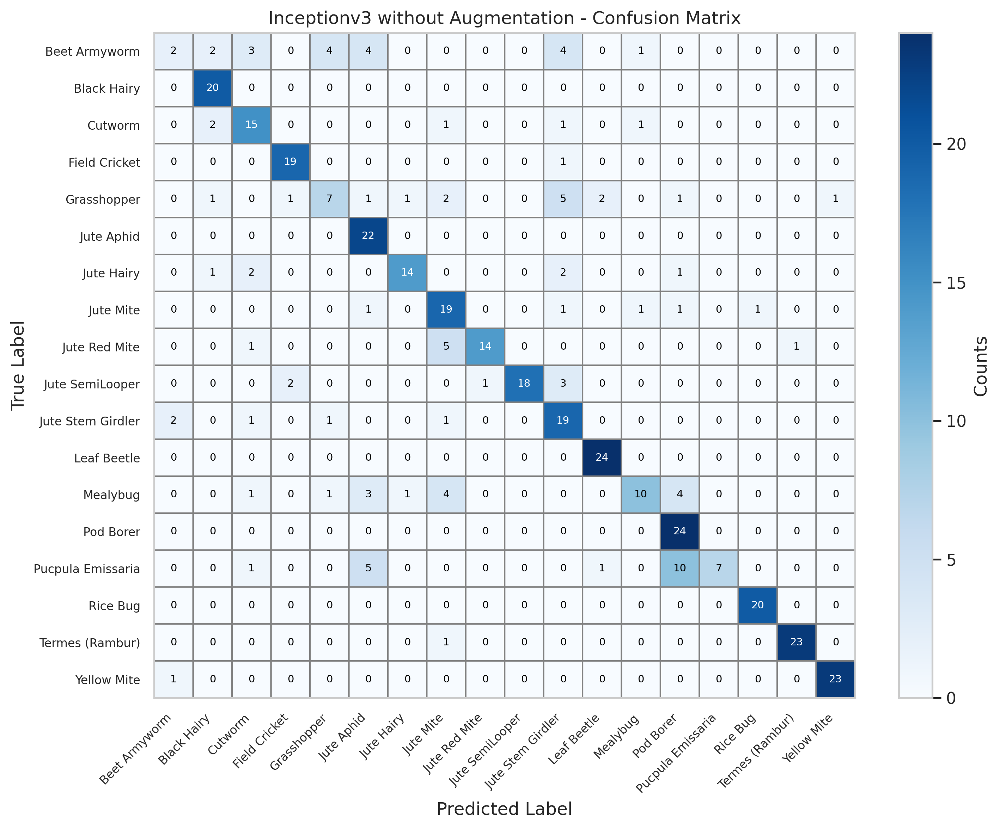

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# -------------------------------------------------------------------
# 1) CONFUSION MATRIX VALUES
# -------------------------------------------------------------------
cm = np.array([
    [ 2,  2,  3,  0,  4,  4,  0,  0,  0,  0,  4,  0,  1,  0,  0,  0,  0,  0],
    [ 0, 20,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
    [ 0,  2, 15,  0,  0,  0,  0,  1,  0,  0,  1,  0,  1,  0,  0,  0,  0,  0],
    [ 0,  0,  0, 19,  0,  0,  0,  0,  0,  0,  1,  0,  0,  0,  0,  0,  0,  0],
    [ 0,  1,  0,  1,  7,  1,  1,  2,  0,  0,  5,  2,  0,  1,  0,  0,  0,  1],
    [ 0,  0,  0,  0,  0, 22,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
    [ 0,  1,  2,  0,  0,  0, 14,  0,  0,  0,  2,  0,  0,  1,  0,  0,  0,  0],
    [ 0,  0,  0,  0,  0,  1,  0, 19,  0,  0,  1,  0,  1,  1,  0,  1,  0,  0],
    [ 0,  0,  1,  0,  0,  0,  0,  5, 14,  0,  0,  0,  0,  0,  0,  0,  1,  0],
    [ 0,  0,  0,  2,  0,  0,  0,  0,  1, 18,  3,  0,  0,  0,  0,  0,  0,  0],
    [ 2,  0,  1,  0,  1,  0,  0,  1,  0,  0, 19,  0,  0,  0,  0,  0,  0,  0],
    [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 24,  0,  0,  0,  0,  0,  0],
    [ 0,  0,  1,  0,  1,  3,  1,  4,  0,  0,  0,  0, 10,  4,  0,  0,  0,  0],
    [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 24,  0,  0,  0,  0],
    [ 0,  0,  1,  0,  0,  5,  0,  0,  0,  0,  0,  1,  0, 10,  7,  0,  0,  0],
    [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 20,  0,  0],
    [ 0,  0,  0,  0,  0,  0,  0,  1,  0,  0,  0,  0,  0,  0,  0,  0, 23,  0],
    [ 1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 23]
])

# -------------------------------------------------------------------
# 2) LABELS (from your figure)
# -------------------------------------------------------------------
labels = [
    "Beet Armyworm",
    "Black Hairy",
    "Cutworm",
    "Field Cricket",
    "Grasshopper",
    "Jute Aphid",
    "Jute Hairy",
    "Jute Mite",
    "Jute Red Mite",
    "Jute SemiLooper",
    "Jute Stem Girdler",
    "Leaf Beetle",
    "Mealybug",
    "Pod Borer",
    "Pucpula Emissaria",
    "Rice Bug",
    "Termes (Rambur)",
    "Yellow Mite"
]

# -------------------------------------------------------------------
# 3) PLOTTING WITH CLEAR CELL LINES
# -------------------------------------------------------------------
fig, ax = plt.subplots(figsize=(10, 8), dpi=300)

# Use pcolor to plot the matrix with black edges around each cell
# We flip cm vertically when plotting with pcolor to match typical matrix orientation
pc = ax.pcolor(cm, cmap='Blues', edgecolors='gray', linewidths=1)

# Add a colorbar (with label)
cbar = plt.colorbar(pc, ax=ax)
cbar.set_label("Counts")

# Set the axis limits to match the shape of cm
num_rows, num_cols = cm.shape
ax.set_xlim([0, num_cols])
ax.set_ylim([0, num_rows])

# Major ticks at cell centers
ax.set_xticks(np.arange(num_cols) + 0.5)
ax.set_yticks(np.arange(num_rows) + 0.5)

# Label each cell with its value
for i in range(num_rows):
    for j in range(num_cols):
        val = cm[i, j]
        # Pick a text color ensuring contrast
        color = 'white' if val > (cm.max() / 2.) else 'black'
        ax.text(j + 0.5, i + 0.5, str(val), ha='center', va='center', color=color, fontsize=7)

# Tick labels (rotating the x-axis labels for clarity)
ax.set_xticklabels(labels, rotation=45, ha='right', fontsize=8)
ax.set_yticklabels(labels, fontsize=8)
ax.invert_yaxis()


# Invert the y-axis if you prefer the first label at the top
# (By default, pcolor starts y=0 at bottom. If you want the first row on top, uncomment below.)
# ax.invert_yaxis()

# Title and axis labels
ax.set_title("Inceptionv3 without Augmentation - Confusion Matrix")
ax.set_xlabel("Predicted Label")
ax.set_ylabel("True Label")

plt.tight_layout()
plt.show()



#**Inceptionv3 With Augmentation**


Training and Evaluating a Optimized InceptionV3 Model for Jute Pest Classification

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import torchvision
from torchvision import datasets, transforms, models
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils.class_weight import compute_class_weight
import time
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import gc

# --- 1. Data Loading and Preprocessing ---
# Define dataset path
DATASET_PATH = "/kaggle/working/Jute_Pest_Dataset"
train_path = os.path.join(DATASET_PATH, "train")
val_path = os.path.join(DATASET_PATH, "val")
test_path = os.path.join(DATASET_PATH, "test")

# Define data transformations for training set (augmentation applied)
train_transforms = transforms.Compose([
    transforms.Resize(299),
    transforms.RandomResizedCrop(299, scale=(0.5, 1.0)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3, hue=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Define data transformations for validation and test sets (no augmentation)
test_transforms = transforms.Compose([
    transforms.Resize(299),
    transforms.CenterCrop(299),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Load the datasets using ImageFolder
train_dataset = datasets.ImageFolder(train_path, transform=train_transforms)
val_dataset = datasets.ImageFolder(val_path, transform=test_transforms)
test_dataset = datasets.ImageFolder(test_path, transform=test_transforms)

# Create data loaders for batch processing
batch_size = 64
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

# --- 2. Model Setup and Configuration ---

# Get class names and number of classes
class_names = train_dataset.classes
num_classes = 18  # Set to 18 classes as requested

# Initialize Inception V3 model with pre-trained weights from ImageNet
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = models.inception_v3(weights=models.Inception_V3_Weights.IMAGENET1K_V1)
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, num_classes)  # Output 18 classes
model.AuxLogits.fc = nn.Linear(model.AuxLogits.fc.in_features, num_classes)  # Match auxiliary logits
model = model.to(device)

# Use DataParallel if multiple GPUs are available
if torch.cuda.device_count() > 1:
    model = nn.DataParallel(model)

# Unfreeze all layers from the start for fine-tuning
for param in model.parameters():
    param.requires_grad = True

# --- 3. Class Weighting ---
# Calculate class weights to address class imbalance (using 'balanced' strategy)
class_weights = compute_class_weight('balanced', classes=np.arange(num_classes), y=train_dataset.targets)
class_weights = torch.tensor(class_weights, dtype=torch.float).to(device)
# Adjust weights for specific classes (e.g., Jute Hairy, Beet Armyworm, Cutworm, Mealybug)
# Assuming indices: 5 for Jute Hairy, 0 for Beet Armyworm, 2 for Cutworm, 11 for Mealybug
class_weights[5] *= 1.5  # Jute Hairy
class_weights[0] *= 1.2  # Beet Armyworm
class_weights[2] *= 1.2  # Cutworm
class_weights[11] *= 1.2  # Mealybug

# --- 4. Optimizer, Loss Function, and Scheduler ---
optimizer = optim.Adam(model.parameters(), lr=0.000050)  # Set learning rate to 0.000050
criterion = nn.CrossEntropyLoss(weight=class_weights)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=5, verbose=True)

# --- 5. Data Augmentation Techniques (Mixup and CutMix) ---
# Mixup and CutMix functions
def mixup_data(x, y, alpha=1.0):
    if alpha > 0:
        lam = np.random.beta(alpha, alpha)
    else:
        lam = 1
    batch_size = x.size()[0]
    index = torch.randperm(batch_size).to(device)
    mixed_x = lam * x + (1 - lam) * x[index, :]
    y_a, y_b = y, y[index]
    return mixed_x, y_a, y_b, lam

def cutmix_data(inputs, labels, alpha=1.0):
    lam = np.random.beta(alpha, alpha)
    batch_size = inputs.size()[0]
    index = torch.randperm(batch_size).to(device)
    bbx1, bby1, bbx2, bby2 = rand_bbox(inputs.size(), lam)
    inputs[:, :, bbx1:bbx2, bby1:bby2] = inputs[index, :, bbx1:bbx2, bby1:bby2]
    lam = 1 - ((bbx2 - bbx1) * (bby2 - bby1) / (inputs.size()[-1] * inputs.size()[-2]))
    return inputs, labels, labels[index], lam

def rand_bbox(size, lam):
    W = size[2]
    H = size[3]
    cut_rat = np.sqrt(1. - lam)
    cut_w = int(W * cut_rat)
    cut_h = int(H * cut_rat)
    cx = np.random.randint(W)
    cy = np.random.randint(H)
    bbx1 = np.clip(cx - cut_w // 2, 0, W)
    bby1 = np.clip(cy - cut_h // 2, 0, H)
    bbx2 = np.clip(cx + cut_w // 2, 0, W)
    bby2 = np.clip(cy + cut_h // 2, 0, H)
    return bbx1, bby1, bbx2, bby2

def mixup_criterion(criterion, pred, y_a, y_b, lam):
    return lam * criterion(pred, y_a) + (1 - lam) * criterion(pred, y_b)

# --- 6. Training Loop ---

# Initialize variables for training
best_validation_acc = 0.0
best_model_path = '/kaggle/working/best_inceptionv3_model.pth'  # Path to save the best model
total_start_time = time.time()  # Record the start time of training
patience = 8  # Number of epochs to wait before early stopping
early_stop_counter = 0  # Counter for early stopping
log_file = open('/kaggle/working/training_log.txt', 'w')  # Open log file for writing

# Log initial information
log_file.write(f"Device: {device}\n")
log_file.write(f"Number of classes: {num_classes}\n")
log_file.write(f"Class names: {class_names}\n")
log_file.write(f"Adjusted Class weights: {class_weights.tolist()}\n\n")

# Training loop for a specified number of epochs
for epoch in range(10):
    start_time = time.time()
    model.train()
    running_loss = 0.0
    train_correct = 0
    total = 0

    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        inputs = inputs.contiguous()
        optimizer.zero_grad()

        # Apply Mixup or CutMix with reduced probability
        if np.random.rand() < 0.3:  # 30% Mixup
            inputs, labels_a, labels_b, lam = mixup_data(inputs, labels, alpha=1.0)
            outputs = model(inputs)
            if isinstance(outputs, models.inception.InceptionOutputs):
                main_outputs, aux_outputs = outputs
                loss_main = mixup_criterion(criterion, main_outputs, labels_a, labels_b, lam)
                loss_aux = mixup_criterion(criterion, aux_outputs, labels_a, labels_b, lam)
                loss = loss_main + 0.4 * loss_aux
            else:
                loss = mixup_criterion(criterion, outputs, labels_a, labels_b, lam)
        elif np.random.rand() < 0.6:  # 30% CutMix (total 60% regularization)
            inputs, labels_a, labels_b, lam = cutmix_data(inputs, labels, alpha=1.0)
            outputs = model(inputs)
            if isinstance(outputs, models.inception.InceptionOutputs):
                main_outputs, aux_outputs = outputs
                loss_main = mixup_criterion(criterion, main_outputs, labels_a, labels_b, lam)
                loss_aux = mixup_criterion(criterion, aux_outputs, labels_a, labels_b, lam)
                loss = loss_main + 0.4 * loss_aux
            else:
                loss = mixup_criterion(criterion, outputs, labels_a, labels_b, lam)
        else:  # 40% clean samples
            outputs = model(inputs)
            if isinstance(outputs, models.inception.InceptionOutputs):
                main_outputs, aux_outputs = outputs
                loss_main = criterion(main_outputs, labels)
                loss_aux = criterion(aux_outputs, labels)
                loss = loss_main + 0.4 * loss_aux
            else:
                loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        train_correct += (main_outputs.argmax(1) == labels).sum().item() if isinstance(outputs, models.inception.InceptionOutputs) else (outputs.argmax(1) == labels).sum().item()
        total += labels.size(0)

        # Cleanup intermediate tensors
        del inputs, labels, outputs, loss
        gc.collect()
        torch.cuda.empty_cache()

    train_acc = train_correct / total

    # Validation phase
    model.eval()
    validation_losses = []
    validation_correct = 0
    total_val = 0

    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            if isinstance(outputs, models.inception.InceptionOutputs):
                main_outputs = outputs.logits  # Use main outputs for validation
            else:
                main_outputs = outputs
            loss = criterion(main_outputs, labels)
            validation_losses.append(loss.item())
            validation_correct += (main_outputs.argmax(1) == labels).sum().item()
            total_val += labels.size(0)

            # Cleanup validation batch
            del inputs, labels, outputs, loss, main_outputs
            gc.collect()
            torch.cuda.empty_cache()

        validation_loss = sum(validation_losses) / len(validation_losses)
        validation_acc = validation_correct / total_val

    # Learning rate scheduling
    scheduler.step(validation_loss)

    # Logging
    end_time = time.time()
    epoch_log = (f'Epoch {epoch+1}, Train Loss: {running_loss / len(train_loader):.4f}, '
                 f'Train Acc: {train_acc:.4f}, Val Loss: {validation_loss:.4f}, '
                 f'Val Acc: {validation_acc:.4f}, Time: {end_time - start_time:.2f} seconds, '
                 f'LR: {optimizer.param_groups[0]["lr"]:.6f}\n')
    print(epoch_log)
    log_file.write(epoch_log)

    # Early stopping
    if validation_acc > best_validation_acc:
        best_validation_acc = validation_acc
        torch.save(model.state_dict(), best_model_path)
        print(f"Saved best model with Val Acc: {validation_acc:.4f}")
        log_file.write(f"Saved best model with Val Acc: {validation_acc:.4f}\n")
        early_stop_counter = 0
    else:
        early_stop_counter += 1
        if early_stop_counter >= patience:
            print("Early stopping triggered")
            log_file.write("Early stopping triggered\n")
            break

    gc.collect()
    torch.cuda.empty_cache()

# --- 7. Testing and Evaluation ---
model.load_state_dict(torch.load(best_model_path, weights_only=True))
model.eval()
true_labels = []
pred_labels = []
total = 0
correct = 0
sample_images_saved = 0

os.makedirs('/kaggle/working/sample_predictions', exist_ok=True)

with torch.no_grad():
    for i, (inputs, labels) in enumerate(test_loader):
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        if isinstance(outputs, models.inception.InceptionOutputs):
            main_outputs = outputs.logits
        else:
            main_outputs = outputs
        _, predicted = torch.max(main_outputs.data, 1)
        predicted = predicted.cpu()
        pred_labels.extend(predicted.numpy())
        true_labels.extend(labels.cpu().numpy())
        correct += (predicted == labels.cpu()).sum().item()
        total += labels.size(0)

        if predicted != labels.cpu() and sample_images_saved < 5:
            img = inputs[0].cpu().numpy().transpose(1, 2, 0)
            img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
            img = np.clip(img, 0, 1)
            plt.imshow(img)
            plt.title(f"True: {class_names[labels[0]]}, Pred: {class_names[predicted[0]]}")
            plt.savefig(f'/kaggle/working/sample_predictions/misclassified_{sample_images_saved}.png')
            plt.close()
            sample_images_saved += 1

        del inputs, labels, outputs, predicted, main_outputs
        gc.collect()
        torch.cuda.empty_cache()

total_end_time = time.time()
accuracy = correct / total

log_file.write(f'\nTotal Time: {total_end_time - total_start_time:.2f} seconds\n')
log_file.write(f'Test Accuracy: {accuracy:.4f}\n')
log_file.write("Classification Report:\n")
log_file.write(classification_report(true_labels, pred_labels, target_names=class_names))
log_file.write("\nConfusion Matrix:\n")
conf_matrix = confusion_matrix(true_labels, pred_labels)
log_file.write(np.array2string(conf_matrix))
log_file.write("\n")

print(f'Total Time: {total_end_time - total_start_time:.2f} seconds')
print(f'Test Accuracy: {accuracy:.4f}')
print("Classification Report:")
print(classification_report(true_labels, pred_labels, target_names=class_names))
print("Confusion Matrix:")
print(conf_matrix)

plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.savefig('/kaggle/working/confusion_matrix.png')
plt.close()

log_file.close()

Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth
100%|██████████| 104M/104M [00:00<00:00, 211MB/s]  
/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch 1, Train Loss: 2.9359, Train Acc: 0.4180, Val Loss: 0.9914, Val Acc: 0.7529, Time: 196.48 seconds, LR: 0.000050

Saved best model with Val Acc: 0.7529
Epoch 2, Train Loss: 1.8764, Train Acc: 0.5986, Val Loss: 0.5993, Val Acc: 0.8467, Time: 199.28 seconds, LR: 0.000050

Saved best model with Val Acc: 0.8467
Epoch 3, Train Loss: 1.5619, Train Acc: 0.6926, Val Loss: 0.6533, Val Acc: 0.8604, Time: 196.98 seconds, LR: 0.000050

Saved best model with Val Acc: 0.8604
Epoch 4, Train Loss: 1.4782, Train Acc: 0.6605, Val Loss: 0.5650, Val Acc: 0.8764, Time: 200.08 seconds, LR: 0.000050

Saved best model with Val Acc: 0.8764
Epoch 5, Train Loss: 1.2365, Train Acc: 0.7619, Val Loss: 0.4563, Val Acc: 0.9039, Time: 199.64 seconds, LR: 0.000050

Saved best model with Val Acc: 0.9039
Epoch 6, Train Loss: 1.2498, Train Acc: 0.7532, Val Loss: 0.4838, Val Acc: 0.8993, Time: 201.32 seconds, LR: 0.000050

Epoch 7, Train Loss: 1.2443, Train Acc: 0.7106, Val Loss: 0.5197, Val Acc: 0.8902, Time: 199.31 

Confusion Matrix Visualization of Optimized InceptionV3 Model

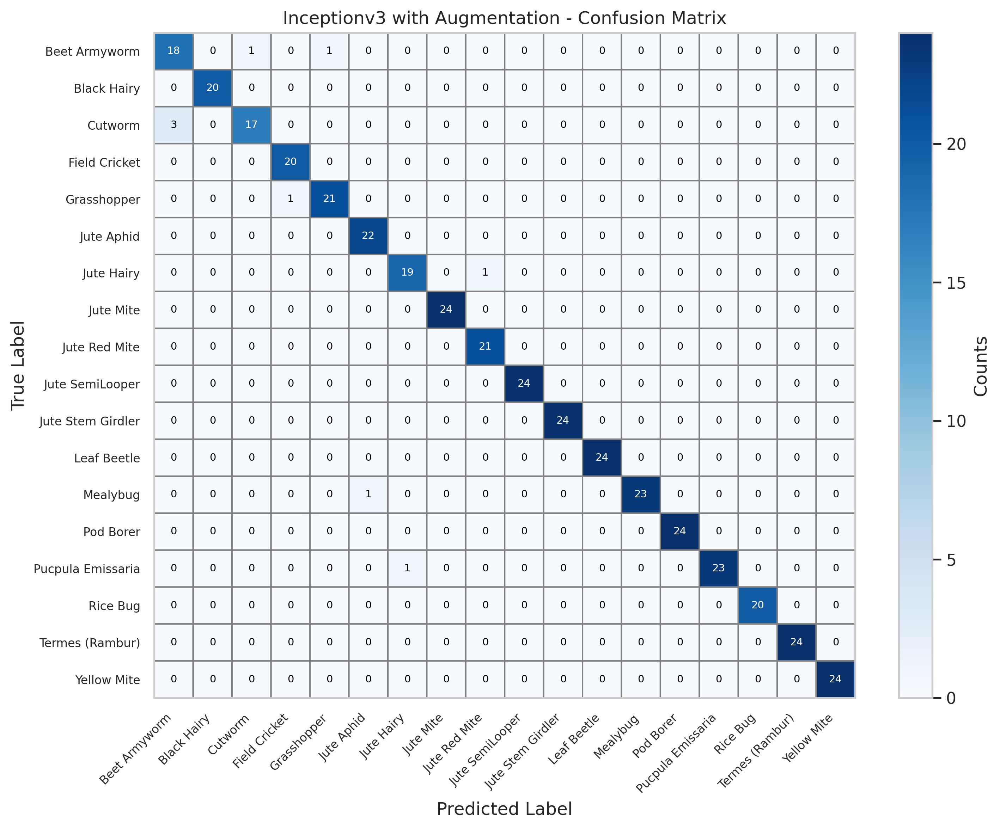

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# -------------------------------------------------------------------
# 1) CONFUSION MATRIX VALUES
# -------------------------------------------------------------------
cm = np.array([
    [18,  0,  1,  0,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
    [ 0, 20,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
    [ 3,  0, 17,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
    [ 0,  0,  0, 20,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
    [ 0,  0,  0,  1, 21,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
    [ 0,  0,  0,  0,  0, 22,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
    [ 0,  0,  0,  0,  0,  0, 19,  0,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0],
    [ 0,  0,  0,  0,  0,  0,  0, 24,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
    [ 0,  0,  0,  0,  0,  0,  0,  0, 21,  0,  0,  0,  0,  0,  0,  0,  0,  0],
    [ 0,  0,  0,  0,  0,  0,  0,  0,  0, 24,  0,  0,  0,  0,  0,  0,  0,  0],
    [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 24,  0,  0,  0,  0,  0,  0,  0],
    [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 24,  0,  0,  0,  0,  0,  0],
    [ 0,  0,  0,  0,  0,  1,  0,  0,  0,  0,  0,  0, 23,  0,  0,  0,  0,  0],
    [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 24,  0,  0,  0,  0],
    [ 0,  0,  0,  0,  0,  0,  1,  0,  0,  0,  0,  0,  0,  0, 23,  0,  0,  0],
    [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 20,  0,  0],
    [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 24,  0],
    [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 24]
])

# -------------------------------------------------------------------
# 2) LABELS (from your figure)
# -------------------------------------------------------------------
labels = [
    "Beet Armyworm",
    "Black Hairy",
    "Cutworm",
    "Field Cricket",
    "Grasshopper",
    "Jute Aphid",
    "Jute Hairy",
    "Jute Mite",
    "Jute Red Mite",
    "Jute SemiLooper",
    "Jute Stem Girdler",
    "Leaf Beetle",
    "Mealybug",
    "Pod Borer",
    "Pucpula Emissaria",
    "Rice Bug",
    "Termes (Rambur)",
    "Yellow Mite"
]

# -------------------------------------------------------------------
# 3) PLOTTING WITH CLEAR CELL LINES
# -------------------------------------------------------------------
fig, ax = plt.subplots(figsize=(10, 8), dpi=300)

# Use pcolor to plot the matrix with black edges around each cell
# We flip cm vertically when plotting with pcolor to match typical matrix orientation
pc = ax.pcolor(cm, cmap='Blues', edgecolors='gray', linewidths=1)

# Add a colorbar (with label)
cbar = plt.colorbar(pc, ax=ax)
cbar.set_label("Counts")

# Set the axis limits to match the shape of cm
num_rows, num_cols = cm.shape
ax.set_xlim([0, num_cols])
ax.set_ylim([0, num_rows])

# Major ticks at cell centers
ax.set_xticks(np.arange(num_cols) + 0.5)
ax.set_yticks(np.arange(num_rows) + 0.5)

# Label each cell with its value
for i in range(num_rows):
    for j in range(num_cols):
        val = cm[i, j]
        # Pick a text color ensuring contrast
        color = 'white' if val > (cm.max() / 2.) else 'black'
        ax.text(j + 0.5, i + 0.5, str(val), ha='center', va='center', color=color, fontsize=7)

# Tick labels (rotating the x-axis labels for clarity)
ax.set_xticklabels(labels, rotation=45, ha='right', fontsize=8)
ax.set_yticklabels(labels, fontsize=8)
ax.invert_yaxis()


# Invert the y-axis if you prefer the first label at the top
# (By default, pcolor starts y=0 at bottom. If you want the first row on top, uncomment below.)
# ax.invert_yaxis()

# Title and axis labels
ax.set_title("Inceptionv3 with Augmentation - Confusion Matrix")
ax.set_xlabel("Predicted Label")
ax.set_ylabel("True Label")

plt.tight_layout()
plt.show()


Comparison of Test Accuracy: Raw vs Optimized Models Across Architectures

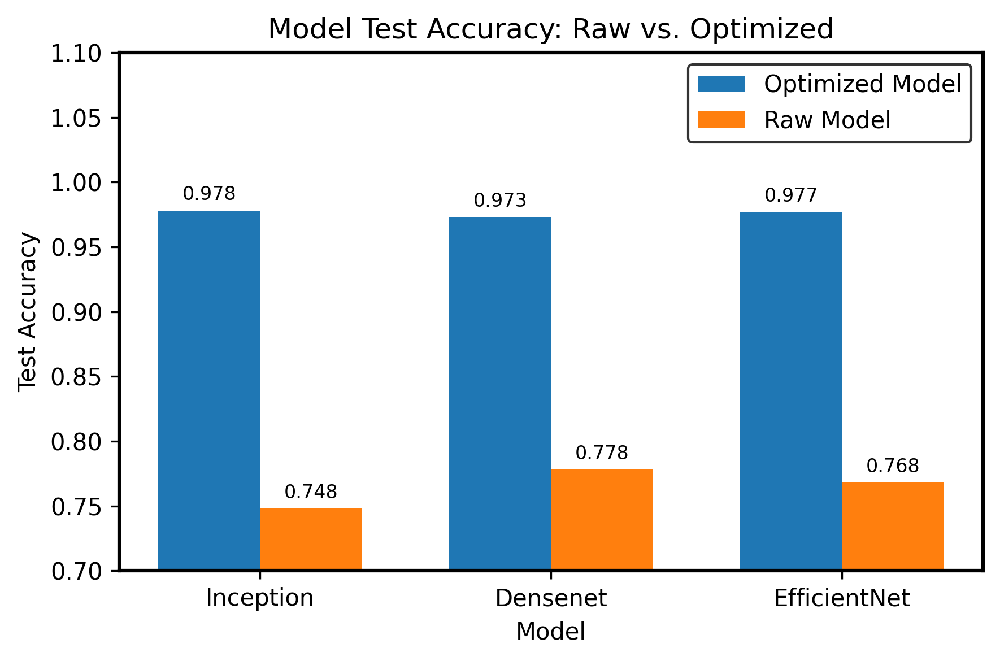

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Data for plotting
models = ['Inception', 'Densenet', 'EfficientNet']
with_aug = [0.978, 0.973, 0.977]
without_aug = [0.748, 0.778, 0.768]

# X-axis positions
x = np.arange(len(models))
bar_width = 0.35

# Create the figure with 300 dpi resolution
fig, ax = plt.subplots(dpi=300, figsize=(6, 4))

# Plot the bars:
ax.bar(x - bar_width / 2, with_aug, width=bar_width, color='tab:blue', label='Optimized Model')
ax.bar(x + bar_width / 2, without_aug, width=bar_width, color='tab:orange', label='Raw Model')

# Annotate each bar with its value on top
for i in range(len(x)):
    ax.text(x[i] - bar_width / 2, with_aug[i] + 0.005, f"{with_aug[i]:.3f}",
            ha='center', va='bottom', fontsize=8)
    ax.text(x[i] + bar_width / 2, without_aug[i] + 0.005, f"{without_aug[i]:.3f}",
            ha='center', va='bottom', fontsize=8)

# Set title and labels
ax.set_title("Model Test Accuracy: Raw vs. Optimized")
ax.set_xlabel("Model")
ax.set_ylabel("Test Accuracy")
ax.set_xticks(x)
ax.set_xticklabels(models)

# Format y-axis tick labels as decimals and set y-limits
ax.yaxis.set_major_formatter(plt.FormatStrFormatter('%.2f'))
ax.set_ylim(0.7, 1.10)

# Ensure all four spines (borders) are visible and have a black color
for spine in ax.spines.values():
    spine.set_visible(True)
    spine.set_linewidth(1.5)
    spine.set_edgecolor('black')

# Add the boxed legend in the upper right corner with its own black border
legend = ax.legend(loc='upper right', frameon=True)
legend.get_frame().set_edgecolor('black')
legend.get_frame().set_linewidth(1.0)

# Adjust layout to ensure nothing is clipped
plt.tight_layout()

# Display the resulting
plt.show()

# **Hybrid Model (DenseNet201 + ViT)**

 Hybrid Deep Learning Model: DenseNet201 + Vision Transformer (ViT) with Mixup and CutMix Augmentation

Downloading: "https://download.pytorch.org/models/densenet201-c1103571.pth" to /root/.cache/torch/hub/checkpoints/densenet201-c1103571.pth
100%|██████████| 77.4M/77.4M [00:00<00:00, 217MB/s]


model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch 1, Train Loss: 2.0991, Train Acc: 0.3559, Val Loss: 0.5037, Val Acc: 0.9130, Time: 354.68 seconds, LR: 0.000050

Saved best model with Val Acc: 0.9130
Epoch 2, Train Loss: 1.3154, Train Acc: 0.5826, Val Loss: 0.4107, Val Acc: 0.9016, Time: 367.85 seconds, LR: 0.000050

Epoch 3, Train Loss: 1.1076, Train Acc: 0.5901, Val Loss: 0.3141, Val Acc: 0.9245, Time: 368.11 seconds, LR: 0.000050

Saved best model with Val Acc: 0.9245
Epoch 4, Train Loss: 1.0327, Train Acc: 0.5771, Val Loss: 0.3785, Val Acc: 0.9085, Time: 369.24 seconds, LR: 0.000050

Epoch 5, Train Loss: 0.9356, Train Acc: 0.6018, Val Loss: 0.4107, Val Acc: 0.9039, Time: 369.15 seconds, LR: 0.000050

Epoch 6, Train Loss: 0.9061, Train Acc: 0.6375, Val Loss: 0.3048, Val Acc: 0.9359, Time: 368.08 seconds, LR: 0.000050

Saved best model with Val Acc: 0.9359
Epoch 7, Train Loss: 0.8521, Train Acc: 0.6212, Val Loss: 0.2685, Val Acc: 0.9497, Time: 368.60 seconds, LR: 0.000050

Saved best model with Val Acc: 0.9497
Epoch 8, Train 

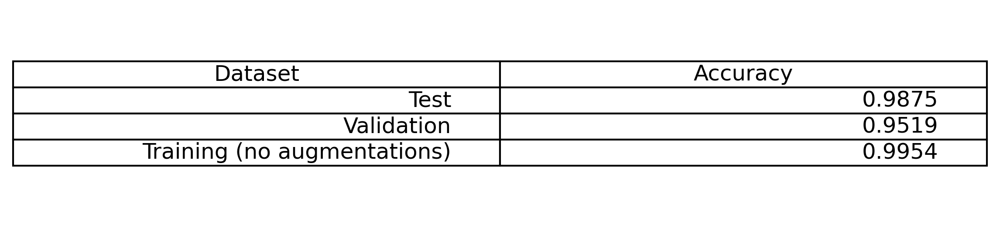

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import torchvision
from torchvision import datasets, transforms, models
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils.class_weight import compute_class_weight
import time
import os
import numpy as np
import timm
import matplotlib.pyplot as plt
import gc

# Define dataset path
DATASET_PATH = "/kaggle/working/Jute_Pest_Dataset"
train_path = os.path.join(DATASET_PATH, "train")
val_path = os.path.join(DATASET_PATH, "val")
test_path = os.path.join(DATASET_PATH, "test")

# Define data augmentation and normalization for training set
train_transforms = transforms.Compose([
    transforms.Resize(224),
    transforms.RandomResizedCrop(224, scale=(0.5, 1.0)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3, hue=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Define transformations for validation and test sets (no augmentation)
test_transforms = transforms.Compose([
    transforms.Resize(224),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Load datasets using ImageFolder
train_dataset = datasets.ImageFolder(train_path, transform=train_transforms)
val_dataset = datasets.ImageFolder(val_path, transform=test_transforms)
test_dataset = datasets.ImageFolder(test_path, transform=test_transforms)
train_dataset_eval = datasets.ImageFolder(train_path, transform=test_transforms)  # Training set for evaluation (no augmentations)

# Data loaders
batch_size = 64
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)
train_loader_eval = DataLoader(train_dataset_eval, batch_size=batch_size, shuffle=False)

# Get class names from the dataset
class_names = train_dataset.classes

# Define the hybrid model architecture (DenseNet201 + ViT)
class DenseNet_ViT_Hybrid(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        # Load pre-trained DenseNet201
        self.densenet = models.densenet201(weights=models.DenseNet201_Weights.IMAGENET1K_V1)
        num_ftrs = self.densenet.classifier.in_features  # Get number of features from DenseNet
        self.densenet.classifier = nn.Identity()  # Remove the original classifier layer

        # Enable fine-tuning of all DenseNet parameters
        for param in self.densenet.parameters():
            param.requires_grad = True

        # Load pre-trained Vision Transformer (ViT)
        self.vit = timm.create_model('vit_base_patch16_224', pretrained=True, num_classes=num_classes)
        self.vit.head = nn.Identity()  # Remove the original ViT classifier head

        # Define a custom classifier that combines features from DenseNet and ViT
        self.classifier = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(1920 + 768, 500),  # Adjusted for DenseNet201 (1920) + ViT (768)
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(500, num_classes)
        )

    def forward(self, x):
        # Pass input through DenseNet to get features
        densenet_features = self.densenet(x)

        # Pass input through ViT to get features
        vit_features = self.vit(x)

        # Concatenate features from DenseNet and ViT
        combined_features = torch.cat((densenet_features, vit_features), dim=1)

        # Pass combined features through the classifier
        logits = self.classifier(combined_features)
        return logits  # Return the model's predictions

# Set device (GPU if available, otherwise CPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = DenseNet_ViT_Hybrid(num_classes=18).to(device)

# If multiple GPUs are available, use DataParallel for parallel processing
if torch.cuda.device_count() > 1:
    model = nn.DataParallel(model)

# Calculate class weights to address class imbalance
class_weights = compute_class_weight('balanced', classes=np.unique(train_dataset.targets), y=train_dataset.targets)
class_weights = torch.tensor(class_weights, dtype=torch.float).to(device)  # Convert to tensor and move to device
# Manually adjust weights for specific classes if needed
class_weights[5] *= 1.5  # Jute Hairy (index 5)
class_weights[0] *= 1.2  # Beet Armyworm (index 0)
class_weights[2] *= 1.2  # Cutworm (index 2)
class_weights[11] *= 1.2  # Mealybug (index 11)

# Define optimizer, loss function, and learning rate scheduler
optimizer = optim.Adam(model.parameters(), lr=0.00005)  # Adam optimizer
criterion = nn.CrossEntropyLoss(weight=class_weights)  # Cross-entropy loss with class weights
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=3, verbose=True)  # Reduce LR on plateau

# Define Mixup and CutMix augmentation functions
def mixup_data(x, y, alpha=1.0):
    if alpha > 0:
        lam = np.random.beta(alpha, alpha)
    else:
        lam = 1
    batch_size = x.size()[0]
    index = torch.randperm(batch_size).to(device)
    mixed_x = lam * x + (1 - lam) * x[index, :]
    y_a, y_b = y, y[index]
    return mixed_x, y_a, y_b, lam

def cutmix_data(inputs, labels, alpha=1.0):
    lam = np.random.beta(alpha, alpha)
    batch_size = inputs.size()[0]
    index = torch.randperm(batch_size).to(device)
    bbx1, bby1, bbx2, bby2 = rand_bbox(inputs.size(), lam)
    inputs[:, :, bbx1:bbx2, bby1:bby2] = inputs[index, :, bbx1:bbx2, bby1:bby2]
    lam = 1 - ((bbx2 - bbx1) * (bby2 - bby1) / (inputs.size()[-1] * inputs.size()[-2]))
    return inputs, labels, labels[index], lam

def rand_bbox(size, lam):
    W = size[2]
    H = size[3]
    cut_rat = np.sqrt(1. - lam)
    cut_w = int(W * cut_rat)
    cut_h = int(H * cut_rat)
    cx = np.random.randint(W)
    cy = np.random.randint(H)
    bbx1 = np.clip(cx - cut_w // 2, 0, W)
    bby1 = np.clip(cy - cut_h // 2, 0, H)
    bbx2 = np.clip(cx + cut_w // 2, 0, W)
    bby2 = np.clip(cy + cut_h // 2, 0, H)
    return bbx1, bby1, bbx2, bby2

def mixup_criterion(criterion, pred, y_a, y_b, lam):
    return lam * criterion(pred, y_a) + (1 - lam) * criterion(pred, y_b)

# Initialize variables for training and logging
best_validation_acc = 0.0
best_model_path = '/kaggle/working/best_densenet_vit_hybrid_model.pth'  # Path to save the best model
total_start_time = time.time()  # Start time of training
patience = 5  # Patience for early stopping
early_stop_counter = 0  # Counter for early stopping
log_file = open('/kaggle/working/training_log_hybrid.txt', 'w')  # Open log file for writing

# Write initial information to the log file
log_file.write(f"Device: {device}\n")
log_file.write(f"Number of classes: {len(class_names)}\n")
log_file.write(f"Class names: {class_names}\n")
log_file.write(f"Adjusted Class weights: {class_weights.tolist()}\n\n")

# Main training loop
for epoch in range(10):  # Train for 10 epochs
    start_time = time.time()  # Start time of the epoch
    model.train()  # Set the model to training mode
    running_loss = 0.0  # Accumulate loss for the epoch
    train_correct = 0  # Count correctly classified images
    total = 0  # Total number of images processed

    # Iterate over the training data loader
    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)  # Move data to the device
        optimizer.zero_grad()  # Reset gradients

        # Apply Mixup or CutMix randomly
        if np.random.rand() < 0.5:  # 50% chance of Mixup
            inputs, labels_a, labels_b, lam = mixup_data(inputs, labels, alpha=1.0)  # Apply Mixup
            outputs = model(inputs)  # Forward pass
            loss = mixup_criterion(criterion, outputs, labels_a, labels_b, lam)  # Calculate loss
        else:  # 50% chance of CutMix
            inputs, labels_a, labels_b, lam = cutmix_data(inputs, labels, alpha=1.0)  # Apply CutMix
            outputs = model(inputs)  # Forward pass
            loss = mixup_criterion(criterion, outputs, labels_a, labels_b, lam)  # Calculate loss

        loss.backward()  # Calculate gradients
        optimizer.step()  # Update model parameters

        running_loss += loss.item()
        train_correct += (outputs.argmax(1) == labels).sum().item()
        total += labels.size(0)

        # Cleanup memory after each batch
        del inputs, labels, outputs, loss
        gc.collect()
        torch.cuda.empty_cache()

    train_acc = train_correct / total  # Calculate training accuracy

    # Validation phase
    model.eval()  # Set the model to evaluation mode
    validation_losses = []  # Store validation losses
    validation_correct = 0  # Count correct validation predictions
    total_val = 0  # Total number of validation images

    with torch.no_grad():  # Disable gradient calculation during validation
        # Iterate over the validation data loader
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            predictions = model(inputs)
            loss = criterion(predictions, labels)
            validation_losses.append(loss.item())
            validation_correct += (predictions.argmax(1) == labels).sum().item()
            total_val += labels.size(0)

            # Free up memory
            del inputs, labels, predictions, loss
            gc.collect()
            torch.cuda.empty_cache()

        validation_loss = sum(validation_losses) / len(validation_losses)
        validation_acc = validation_correct / total_val

    # Adjust learning rate based on validation loss
    scheduler.step(validation_loss)

    # Logging
    end_time = time.time()
    epoch_log = (f'Epoch {epoch+1}, Train Loss: {running_loss / len(train_loader):.4f}, '
                 f'Train Acc: {train_acc:.4f}, Val Loss: {validation_loss:.4f}, '
                 f'Val Acc: {validation_acc:.4f}, Time: {end_time - start_time:.2f} seconds, '
                 f'LR: {optimizer.param_groups[0]["lr"]:.6f}\n')
    print(epoch_log)
    log_file.write(epoch_log)

    # Early stopping
    if validation_acc > best_validation_acc:
        best_validation_acc = validation_acc
        torch.save(model.state_dict(), best_model_path)
        print(f"Saved best model with Val Acc: {validation_acc:.4f}")
        log_file.write(f"Saved best model with Val Acc: {validation_acc:.4f}\n")
        early_stop_counter = 0
    else:
        early_stop_counter += 1
        if early_stop_counter >= patience:
            print("Early stopping triggered")
            log_file.write("Early stopping triggered\n")
            break

    # Free up memory
    gc.collect()
    torch.cuda.empty_cache()

# Function to evaluate the model
def evaluate_model(model, loader, dataset_name):
    model.eval()  # Set the model to evaluation mode
    true_labels = []  # Store true labels
    pred_labels = []  # Store predicted labels
    total = 0  # Total number of images
    correct = 0  # Number of correct predictions

    with torch.no_grad():  # Disable gradient calculation during evaluation
        # Iterate over the data loader
        for inputs, labels in loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, predicted = torch.max(outputs.data, 1)
            predicted = predicted.cpu()
            pred_labels.extend(predicted.numpy())
            true_labels.extend(labels.cpu().numpy())
            correct += (predicted == labels.cpu()).sum().item()
            total += labels.size(0)

            del inputs, labels, outputs, predicted
            gc.collect()
            torch.cuda.empty_cache()

    accuracy = correct / total
    class_report = classification_report(true_labels, pred_labels, target_names=class_names, output_dict=True)
    conf_matrix = confusion_matrix(true_labels, pred_labels)

    return accuracy, class_report, conf_matrix, true_labels, pred_labels

# Evaluate on all datasets
model.load_state_dict(torch.load(best_model_path, weights_only=True))
total_end_time = time.time()

test_acc, test_report, test_conf_matrix, test_true_labels, test_pred_labels = evaluate_model(model, test_loader, "Test")
val_acc, val_report, val_conf_matrix, val_true_labels, val_pred_labels = evaluate_model(model, val_loader, "Validation")
train_acc, train_report, train_conf_matrix, train_true_labels, train_pred_labels = evaluate_model(model, train_loader_eval, "Training (no augmentations)")

# Log evaluation results
log_file.write(f'\nTotal Time: {total_end_time - total_start_time:.2f} seconds\n')
log_file.write(f'Test Accuracy: {test_acc:.4f}\n')
log_file.write("Test Classification Report:\n")
log_file.write(classification_report(test_true_labels, test_pred_labels, target_names=class_names))
log_file.write("\nTest Confusion Matrix:\n")
log_file.write(np.array2string(test_conf_matrix))
log_file.write("\n")
log_file.write(f'Validation Accuracy: {val_acc:.4f}\n')
log_file.write("Validation Classification Report:\n")
log_file.write(classification_report(val_true_labels, val_pred_labels, target_names=class_names))
log_file.write("\nValidation Confusion Matrix:\n")
log_file.write(np.array2string(val_conf_matrix))
log_file.write("\n")
log_file.write(f'Training Accuracy (no augmentations): {train_acc:.4f}\n')
log_file.write("Training Classification Report:\n")
log_file.write(classification_report(train_true_labels, train_pred_labels, target_names=class_names))
log_file.write("\nTraining Confusion Matrix:\n")
log_file.write(np.array2string(train_conf_matrix))
log_file.write("\n")

# Print results
print(f'Total Time: {total_end_time - total_start_time:.2f} seconds')
print(f'Test Accuracy: {test_acc:.4f}')
print("Test Classification Report:")
print(classification_report(test_true_labels, test_pred_labels, target_names=class_names))
print("Test Confusion Matrix:")
print(test_conf_matrix)
print(f'Validation Accuracy: {val_acc:.4f}')
print("Validation Classification Report:")
print(classification_report(val_true_labels, val_pred_labels, target_names=class_names))
print("Validation Confusion Matrix:")
print(val_conf_matrix)
print(f'Training Accuracy (no augmentations): {train_acc:.4f}')
print("Training Classification Report:")
print(classification_report(train_true_labels, train_pred_labels, target_names=class_names))
print("Training Confusion Matrix:")
print(train_conf_matrix)

# Create a summary table
summary_table = {
    "Dataset": ["Test", "Validation", "Training (no augmentations)"],
    "Accuracy": [test_acc, val_acc, train_acc]
}

print("\nSummary Table:")
print("| Dataset                    | Accuracy |")
print("|----------------------------|----------|")
for dataset, acc in zip(summary_table["Dataset"], summary_table["Accuracy"]):
    print(f"| {dataset:<26} | {acc:.4f}   |")

# Save summary table as an image
fig, ax = plt.subplots(figsize=(8, 2),dpi=300)
ax.axis('tight')
ax.axis('off')
table = ax.table(cellText=[[d, f"{a:.4f}"] for d, a in zip(summary_table["Dataset"], summary_table["Accuracy"])],
                 colLabels=["Dataset", "Accuracy"],
                 loc='center')
table.auto_set_font_size(False)
table.set_fontsize(12)
table.scale(1.2, 1.2)
plt.savefig('/kaggle/working/summary_table.png')
plt.show()
plt.close()

log_file.close()

# **Hybrid Model (EfficientV2 + ViT)**

Hybrid Deep Learning Model: EfficientNetV2-S + Vision Transformer (ViT) with Mixup & CutMix Training

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import torchvision
from torchvision import datasets, transforms, models
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils.class_weight import compute_class_weight
import time
import os
import numpy as np
import timm
import matplotlib.pyplot as plt
import warnings

# Define dataset path
DATASET_PATH = "/kaggle/working/Jute_Pest_Dataset"
train_path = os.path.join(DATASET_PATH, "train")
val_path = os.path.join(DATASET_PATH, "val")
test_path = os.path.join(DATASET_PATH, "test")

# Define data transformations for training and testing
# Training transformations include data augmentation techniques
train_transforms = transforms.Compose([
    transforms.Resize(224),
    transforms.RandomResizedCrop(224, scale=(0.5, 1.0)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3, hue=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Test transformations only include resizing and normalization
test_transforms = transforms.Compose([
    transforms.Resize(224),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Load datasets
train_dataset = datasets.ImageFolder(train_path, transform=train_transforms)
val_dataset = datasets.ImageFolder(val_path, transform=test_transforms)
test_dataset = datasets.ImageFolder(test_path, transform=test_transforms)
train_dataset_eval = datasets.ImageFolder(train_path, transform=test_transforms)  # For evaluation without augmentations

# Create data loaders for batch processing
batch_size = 64
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)
train_loader_eval = DataLoader(train_dataset_eval, batch_size=batch_size, shuffle=False)

# Get class names from the dataset
class_names = train_dataset.classes

# Define the hybrid model with EfficientNetV2-S and ViT
class EfficientNetV2S_ViT_Hybrid(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        # Load pre-trained EfficientNetV2-S, handle potential loading errors
        try:
            self.effnet = timm.create_model('efficientnetv2_s', pretrained=True)
            print("Loaded pretrained weights for EfficientNetV2-S.")
        except RuntimeError as e:
            warnings.warn(f"Failed to load pretrained weights for EfficientNetV2-S: {e}. Using random initialization.")
            self.effnet = timm.create_model('efficientnetv2_s', pretrained=False)
        num_ftrs = self.effnet.classifier.in_features  # Get the number of features from EfficientNetV2-S
        self.effnet.classifier = nn.Identity()  # Remove the original classification layer

        # Enable fine-tuning by unfreezing all layers
        for param in self.effnet.parameters():
            param.requires_grad = True

        # Load pre-trained ViT
        self.vit = timm.create_model('vit_base_patch16_224', pretrained=True, num_classes=num_classes)
        self.vit.head = nn.Identity()  # Remove the classification head (768 features)

        # Combined classifier (EfficientNetV2-S: 1280 features, ViT: 768 features)
        self.classifier = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(1280 + 768, 500),  # Adjusted for EfficientNetV2-S (1280) + ViT (768)
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(500, num_classes)
        )

    def forward(self, x):
        # Forward pass through EfficientNetV2-S
        effnet_features = self.effnet(x)

        # Forward pass through ViT
        vit_features = self.vit(x)

        # Concatenate features from both models
        combined_features = torch.cat((effnet_features, vit_features), dim=1)

        # Pass combined features through the classifier
        logits = self.classifier(combined_features)
        return logits  # Return the model's predictions

# Set up the device (GPU if available, otherwise CPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = EfficientNetV2S_ViT_Hybrid(num_classes=18).to(device)  # Create an instance of the model and move it to the device

# Use DataParallel if multiple GPUs are available
if torch.cuda.device_count() > 1:
    model = nn.DataParallel(model)

# Calculate class weights for handling class imbalance
class_weights = compute_class_weight('balanced', classes=np.unique(train_dataset.targets), y=train_dataset.targets)
class_weights = torch.tensor(class_weights, dtype=torch.float).to(device)
# Adjust class weights for specific classes
class_weights[5] *= 1.5  # Jute Hairy (index 5)
class_weights[0] *= 1.2  # Beet Armyworm (index 0)
class_weights[2] *= 1.2  # Cutworm (index 2)
class_weights[11] *= 1.2  # Mealybug (index 11)

# Define optimizer, loss function, and learning rate scheduler
optimizer = optim.Adam(model.parameters(), lr=0.00005)  # Adam optimizer
criterion = nn.CrossEntropyLoss(weight=class_weights)  # Cross-entropy loss with class weights
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=3, verbose=True)  # Learning rate scheduler

# Mixup and CutMix functions
def mixup_data(x, y, alpha=1.0):
    if alpha > 0:
        lam = np.random.beta(alpha, alpha)
    else:
        lam = 1
    batch_size = x.size()[0]
    index = torch.randperm(batch_size).to(device)
    mixed_x = lam * x + (1 - lam) * x[index, :]
    y_a, y_b = y, y[index]
    return mixed_x, y_a, y_b, lam

def cutmix_data(inputs, labels, alpha=1.0):
    lam = np.random.beta(alpha, alpha)
    batch_size = inputs.size()[0]
    index = torch.randperm(batch_size).to(device)
    bbx1, bby1, bbx2, bby2 = rand_bbox(inputs.size(), lam)
    inputs[:, :, bbx1:bbx2, bby1:bby2] = inputs[index, :, bbx1:bbx2, bby1:bby2]
    lam = 1 - ((bbx2 - bbx1) * (bby2 - bby1) / (inputs.size()[-1] * inputs.size()[-2]))
    return inputs, labels, labels[index], lam

def rand_bbox(size, lam):
    W = size[2]
    H = size[3]
    cut_rat = np.sqrt(1. - lam)
    cut_w = int(W * cut_rat)
    cut_h = int(H * cut_rat)
    cx = np.random.randint(W)
    cy = np.random.randint(H)
    bbx1 = np.clip(cx - cut_w // 2, 0, W)
    bby1 = np.clip(cy - cut_h // 2, 0, H)
    bbx2 = np.clip(cx + cut_w // 2, 0, W)
    bby2 = np.clip(cy + cut_h // 2, 0, H)
    return bbx1, bby1, bbx2, bby2

def mixup_criterion(criterion, pred, y_a, y_b, lam):
    return lam * criterion(pred, y_a) + (1 - lam) * criterion(pred, y_b)

# Training loop with logging
best_validation_acc = 0.0
best_model_path = '/kaggle/working/best_effnetv2s_vit_hybrid_model.pth'
total_start_time = time.time()
patience = 8
early_stop_counter = 0
log_file = open('/kaggle/working/training_log_hybrid.txt', 'w')

log_file.write(f"Device: {device}\n")
log_file.write(f"Number of classes: {len(class_names)}\n")
log_file.write(f"Class names: {class_names}\n")
log_file.write(f"Adjusted Class weights: {class_weights.tolist()}\n\n")

# Training for 10 epochs
for epoch in range(10):
    start_time = time.time()
    model.train()
    running_loss = 0.0
    train_correct = 0
    total = 0

    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()

        # Apply Mixup or CutMix with 100% probability (50% each)
        if np.random.rand() < 0.5:  # 50% Mixup
            inputs, labels_a, labels_b, lam = mixup_data(inputs, labels, alpha=1.0)
            outputs = model(inputs)
            loss = mixup_criterion(criterion, outputs, labels_a, labels_b, lam)
        else:  # 50% CutMix
            inputs, labels_a, labels_b, lam = cutmix_data(inputs, labels, alpha=1.0)
            outputs = model(inputs)
            loss = mixup_criterion(criterion, outputs, labels_a, labels_b, lam)

        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        train_correct += (outputs.argmax(1) == labels).sum().item()
        total += labels.size(0)
    train_acc = train_correct / total

    # Validation phase
    model.eval()
    validation_losses = []
    validation_correct = 0
    total_val = 0

    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            predictions = model(inputs)
            loss = criterion(predictions, labels)
            validation_losses.append(loss.item())
            validation_correct += (predictions.argmax(1) == labels).sum().item()
            total_val += labels.size(0)

        validation_loss = sum(validation_losses) / len(validation_losses)
        validation_acc = validation_correct / total_val

    # Learning rate scheduling
    scheduler.step(validation_loss)

    # Logging
    end_time = time.time()
    epoch_log = (f'Epoch {epoch+1}, Train Loss: {running_loss / len(train_loader):.4f}, '
                 f'Train Acc: {train_acc:.4f}, Val Loss: {validation_loss:.4f}, '
                 f'Val Acc: {validation_acc:.4f}, Time: {end_time - start_time:.2f} seconds, '
                 f'LR: {optimizer.param_groups[0]["lr"]:.6f}\n')
    print(epoch_log)
    log_file.write(epoch_log)

    # Early stopping
    if validation_acc > best_validation_acc:
        best_validation_acc = validation_acc
        torch.save(model.state_dict(), best_model_path)
        print(f"Saved best model with Val Acc: {validation_acc:.4f}")
        log_file.write(f"Saved best model with Val Acc: {validation_acc:.4f}\n")
        early_stop_counter = 0
    else:
        early_stop_counter += 1
        if early_stop_counter >= patience:
            print("Early stopping triggered")
            log_file.write("Early stopping triggered\n")
            break

# Evaluation function
def evaluate_model(model, loader, dataset_name):
    model.eval()
    true_labels = []
    pred_labels = []
    total = 0
    correct = 0

    with torch.no_grad():
        for inputs, labels in loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, predicted = torch.max(outputs.data, 1)
            predicted = predicted.cpu()
            pred_labels.extend(predicted.numpy())
            true_labels.extend(labels.cpu().numpy())
            correct += (predicted == labels.cpu()).sum().item()
            total += labels.size(0)

    accuracy = correct / total
    class_report = classification_report(true_labels, pred_labels, target_names=class_names, output_dict=True)
    conf_matrix = confusion_matrix(true_labels, pred_labels)

    return accuracy, class_report, conf_matrix, true_labels, pred_labels

# Evaluate on all datasets
model.load_state_dict(torch.load(best_model_path, weights_only=True))
total_end_time = time.time()

test_acc, test_report, test_conf_matrix, test_true_labels, test_pred_labels = evaluate_model(model, test_loader, "Test")
val_acc, val_report, val_conf_matrix, val_true_labels, val_pred_labels = evaluate_model(model, val_loader, "Validation")
train_acc, train_report, train_conf_matrix, train_true_labels, train_pred_labels = evaluate_model(model, train_loader_eval, "Training (no augmentations)")

# Log results
log_file.write(f'\nTotal Time: {total_end_time - total_start_time:.2f} seconds\n')
log_file.write(f'Test Accuracy: {test_acc:.4f}\n')
log_file.write("Test Classification Report:\n")
log_file.write(classification_report(test_true_labels, test_pred_labels, target_names=class_names))
log_file.write("\nTest Confusion Matrix:\n")
log_file.write(np.array2string(test_conf_matrix))
log_file.write("\n")
log_file.write(f'Validation Accuracy: {val_acc:.4f}\n')
log_file.write("Validation Classification Report:\n")
log_file.write(classification_report(val_true_labels, val_pred_labels, target_names=class_names))
log_file.write("\nValidation Confusion Matrix:\n")
log_file.write(np.array2string(val_conf_matrix))
log_file.write("\n")
log_file.write(f'Training Accuracy (no augmentations): {train_acc:.4f}\n')
log_file.write("Training Classification Report:\n")
log_file.write(classification_report(train_true_labels, train_pred_labels, target_names=class_names))
log_file.write("\nTraining Confusion Matrix:\n")
log_file.write(np.array2string(train_conf_matrix))
log_file.write("\n")

# Print results
print(f'Total Time: {total_end_time - total_start_time:.2f} seconds')
print(f'Test Accuracy: {test_acc:.4f}')
print("Test Classification Report:")
print(classification_report(test_true_labels, test_pred_labels, target_names=class_names))
print("Test Confusion Matrix:")
print(test_conf_matrix)
print(f'Validation Accuracy: {val_acc:.4f}')
print("Validation Classification Report:")
print(classification_report(val_true_labels, val_pred_labels, target_names=class_names))
print("Validation Confusion Matrix:")
print(val_conf_matrix)
print(f'Training Accuracy (no augmentations): {train_acc:.4f}')
print("Training Classification Report:")
print(classification_report(train_true_labels, train_pred_labels, target_names=class_names))
print("Training Confusion Matrix:")
print(train_conf_matrix)

# Create a summary table
summary_table = {
    "Dataset": ["Test", "Validation", "Training (no augmentations)"],
    "Accuracy": [test_acc, val_acc, train_acc]
}

print("\nSummary Table:")
print("| Dataset                    | Accuracy |")
print("|----------------------------|----------|")
for dataset, acc in zip(summary_table["Dataset"], summary_table["Accuracy"]):
    print(f"| {dataset:<26} | {acc:.4f}   |")

# Save summary table as an image
fig, ax = plt.subplots(figsize=(8, 2))
ax.axis('tight')
ax.axis('off')
table = ax.table(cellText=[[d, f"{a:.4f}"] for d, a in zip(summary_table["Dataset"], summary_table["Accuracy"])],
                 colLabels=["Dataset", "Accuracy"],
                 loc='center')
table.auto_set_font_size(False)
table.set_fontsize(12)
table.scale(1.2, 1.2)
plt.savefig('/kaggle/working/summary_table.png')
plt.close()

log_file.close()

/tmp/ipykernel_31/1374547077.py:65: UserWarning: Failed to load pretrained weights for EfficientNetV2-S: No pretrained weights exist for efficientnetv2_s. Use `pretrained=False` for random init.. Using random initialization.
  warnings.warn(f"Failed to load pretrained weights for EfficientNetV2-S: {e}. Using random initialization.")


model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch 1, Train Loss: 2.1599, Train Acc: 0.3257, Val Loss: 0.6842, Val Acc: 0.8192, Time: 249.12 seconds, LR: 0.000050

Saved best model with Val Acc: 0.8192
Epoch 2, Train Loss: 1.2544, Train Acc: 0.5746, Val Loss: 0.4961, Val Acc: 0.8970, Time: 262.43 seconds, LR: 0.000050

Saved best model with Val Acc: 0.8970
Epoch 3, Train Loss: 1.1121, Train Acc: 0.5743, Val Loss: 0.4189, Val Acc: 0.9016, Time: 262.27 seconds, LR: 0.000050

Saved best model with Val Acc: 0.9016
Epoch 4, Train Loss: 0.9687, Train Acc: 0.6467, Val Loss: 0.3681, Val Acc: 0.9062, Time: 262.04 seconds, LR: 0.000050

Saved best model with Val Acc: 0.9062
Epoch 5, Train Loss: 0.9757, Train Acc: 0.5920, Val Loss: 0.3179, Val Acc: 0.9336, Time: 262.26 seconds, LR: 0.000050

Saved best model with Val Acc: 0.9336
Epoch 6, Train Loss: 0.8802, Train Acc: 0.6353, Val Loss: 0.3023, Val Acc: 0.9359, Time: 261.96 seconds, LR: 0.000050

Saved best model with Val Acc: 0.9359
Epoch 7, Train Loss: 0.8074, Train Acc: 0.6308, Val Loss: 

# Hybrid (inceptionv2 + vit)


Hybrid Model: InceptionV3 + Vision Transformer (ViT) with Mixed Augmentation for Jute Pest Classification

/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch 1, Train Loss: 1.7311, Train Acc: 0.4534, Val Loss: 0.3746, Val Acc: 0.9176, Time: 448.27 seconds, LR: 0.000050

Saved best model with Val Acc: 0.9176
Epoch 2, Train Loss: 0.9737, Train Acc: 0.6968, Val Loss: 0.3013, Val Acc: 0.9268, Time: 447.59 seconds, LR: 0.000050

Saved best model with Val Acc: 0.9268
Epoch 3, Train Loss: 0.7561, Train Acc: 0.7333, Val Loss: 0.3002, Val Acc: 0.9222, Time: 447.27 seconds, LR: 0.000050

Epoch 4, Train Loss: 0.7769, Train Acc: 0.6855, Val Loss: 0.2720, Val Acc: 0.9428, Time: 448.17 seconds, LR: 0.000050

Saved best model with Val Acc: 0.9428
Epoch 5, Train Loss: 0.6811, Train Acc: 0.7293, Val Loss: 0.4252, Val Acc: 0.9245, Time: 447.08 seconds, LR: 0.000050

Epoch 6, Train Loss: 0.6570, Train Acc: 0.7401, Val Loss: 0.3350, Val Acc: 0.9062, Time: 448.09 seconds, LR: 0.000050

Epoch 7, Train Loss: 0.6410, Train Acc: 0.6984, Val Loss: 0.2662, Val Acc: 0.9382, Time: 447.55 seconds, LR: 0.000050

Epoch 8, Train Loss: 0.6311, Train Acc: 0.7507, Val L

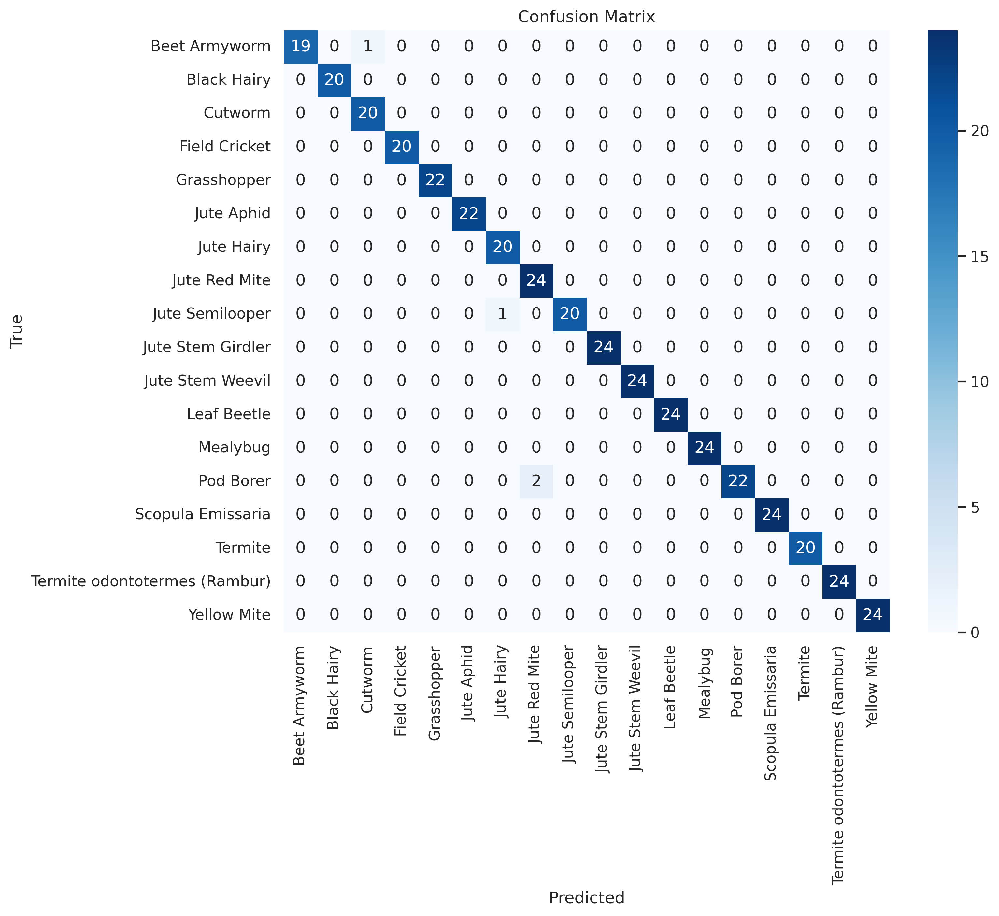

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import torchvision
from torchvision import datasets, transforms, models
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils.class_weight import compute_class_weight
import time
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import timm
import warnings
import gc

# Define dataset path
DATASET_PATH = "/kaggle/working/Jute_Pest_Dataset"
train_path = os.path.join(DATASET_PATH, "train")
val_path = os.path.join(DATASET_PATH, "val")
test_path = os.path.join(DATASET_PATH, "test")

# Define image transformations for training data (augmentation)
train_transforms = transforms.Compose([
    transforms.Resize(299),  # Resize images to 299x299 (Inception V3 input size)
    transforms.RandomResizedCrop(299, scale=(0.5, 1.0)),  # Randomly crop and resize
    transforms.RandomHorizontalFlip(),  # Randomly flip images horizontally
    transforms.RandomRotation(15),  # Randomly rotate images by up to 15 degrees
    transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3, hue=0.1),  # Adjust color properties
    transforms.ToTensor(),  # Convert images to PyTorch tensors
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize using ImageNet stats
])

# Define image transformations for validation and test data (no augmentation)
test_transforms = transforms.Compose([
    transforms.Resize(299),  # Resize images to 299x299
    transforms.CenterCrop(299),  # Center crop images
    transforms.ToTensor(),  # Convert images to PyTorch tensors
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize using ImageNet stats
])

# Load the datasets using ImageFolder
train_dataset = datasets.ImageFolder(train_path, transform=train_transforms)
val_dataset = datasets.ImageFolder(val_path, transform=test_transforms)
test_dataset = datasets.ImageFolder(test_path, transform=test_transforms)

# Create data loaders for batch processing
batch_size = 64
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)  # Shuffle training data
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)  # No need to shuffle validation data
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)  # Batch size 1 for test data

# Get class names from the dataset
class_names = train_dataset.classes

# Define the hybrid model with Inception V3 and ViT
class InceptionV3_ViT_Hybrid(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        # Load pre-trained Inception V3 and remove its classification layers
        self.inception = models.inception_v3(weights=models.Inception_V3_Weights.IMAGENET1K_V1)
        num_ftrs = self.inception.fc.in_features  # 2048 for Inception V3
        self.inception.fc = nn.Identity()  # Remove the final classification layer
        self.inception.AuxLogits.fc = nn.Identity()  # Remove auxiliary classifier

        # Unfreeze all layers for fine-tuning
        for param in self.inception.parameters():
            param.requires_grad = True

        # Load pre-trained ViT and remove its classification head
        self.vit = timm.create_model('vit_base_patch16_224', pretrained=True, num_classes=num_classes, img_size=299)
        self.vit.head = nn.Identity()  # Remove the classification head (768 features)

        # Combined classifier (Inception V3: 2048 features, ViT: 768 features)
        self.classifier = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(2048 + 768, 500),  # Adjusted for Inception V3 (2048) + ViT (768)
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(500, num_classes)
        )

    def forward(self, x):
        # Extract features from Inception V3 and ViT
        inception_features = self.inception(x) if not self.training else self.inception(x).logits  # Handle aux logits during training
        vit_features = self.vit(x)

        # Combine the features from Inception V3 and ViT
        combined_features = torch.cat((inception_features, vit_features), dim=1)

        # Pass the combined features through the classifier to get predictions
        logits = self.classifier(combined_features)
        return logits

# Set up the device (GPU if available, otherwise CPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = InceptionV3_ViT_Hybrid(num_classes=18).to(device)  # Create the model and move it to the device

# Use DataParallel if multiple GPUs are available
if torch.cuda.device_count() > 1:
    model = nn.DataParallel(model)

# Calculate class weights to address class imbalance
class_weights = compute_class_weight('balanced', classes=np.unique(train_dataset.targets), y=train_dataset.targets)
class_weights = torch.tensor(class_weights, dtype=torch.float).to(device)
# Adjust weights for specific classes (if needed)
class_weights[5] *= 1.5  # Jute Hairy (index 5)
class_weights[0] *= 1.2  # Beet Armyworm (index 0)
class_weights[2] *= 1.2  # Cutworm (index 2)
class_weights[11] *= 1.2  # Mealybug (index 11)

# Define optimizer, loss function, and learning rate scheduler
optimizer = optim.Adam(model.parameters(), lr=0.00005)  # Adam optimizer
criterion = nn.CrossEntropyLoss(weight=class_weights)  # Cross-entropy loss with class weights
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=5, verbose=True)  # Learning rate scheduler

# Define functions for Mixup and CutMix data augmentation
def mixup_data(x, y, alpha=1.0):
    if alpha > 0:
        lam = np.random.beta(alpha, alpha)
    else:
        lam = 1
    batch_size = x.size()[0]
    index = torch.randperm(batch_size).to(device)
    mixed_x = lam * x + (1 - lam) * x[index, :]
    y_a, y_b = y, y[index]
    return mixed_x, y_a, y_b, lam

def cutmix_data(inputs, labels, alpha=1.0):
    lam = np.random.beta(alpha, alpha)
    batch_size = inputs.size()[0]
    index = torch.randperm(batch_size).to(device)
    bbx1, bby1, bbx2, bby2 = rand_bbox(inputs.size(), lam)
    inputs[:, :, bbx1:bbx2, bby1:bby2] = inputs[index, :, bbx1:bbx2, bby1:bby2]
    lam = 1 - ((bbx2 - bbx1) * (bby2 - bby1) / (inputs.size()[-1] * inputs.size()[-2]))
    return inputs, labels, labels[index], lam

def rand_bbox(size, lam):
    W = size[2]
    H = size[3]
    cut_rat = np.sqrt(1. - lam)
    cut_w = int(W * cut_rat)
    cut_h = int(H * cut_rat)
    cx = np.random.randint(W)
    cy = np.random.randint(H)
    bbx1 = np.clip(cx - cut_w // 2, 0, W)
    bby1 = np.clip(cy - cut_h // 2, 0, H)
    bbx2 = np.clip(cx + cut_w // 2, 0, W)
    bby2 = np.clip(cy + cut_h // 2, 0, H)
    return bbx1, bby1, bbx2, bby2

def mixup_criterion(criterion, pred, y_a, y_b, lam):
    return lam * criterion(pred, y_a) + (1 - lam) * criterion(pred, y_b)

# --- Training Loop ---
best_validation_acc = 0.0
best_model_path = '/kaggle/working/best_inceptionv3_vit_hybrid_model.pth'  # Path to save the best model
total_start_time = time.time()  # Record the start time of training
patience = 8  # Number of epochs to wait for improvement before early stopping
early_stop_counter = 0  # Counter for early stopping
log_file = open('/kaggle/working/training_log_hybrid.txt', 'w')  # Open a file to log training progress

# Write initial information to the log file
log_file.write(f"Device: {device}\n")
log_file.write(f"Number of classes: {len(class_names)}\n")
log_file.write(f"Class names: {class_names}\n")
log_file.write(f"Adjusted Class weights: {class_weights.tolist()}\n\n")

# Iterate through epochs
for epoch in range(10):
    start_time = time.time()
    model.train()   # Set the model to training mode
    running_loss = 0.0
    train_correct = 0
    total = 0

    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()

        # Apply Mixup or CutMix with reduced probability
        if np.random.rand() < 0.3:  # 30% Mixup
            inputs, labels_a, labels_b, lam = mixup_data(inputs, labels, alpha=1.0)
            outputs = model(inputs)
            loss = mixup_criterion(criterion, outputs, labels_a, labels_b, lam)
        elif np.random.rand() < 0.6:  # 30% CutMix (total 60% regularization)
            inputs, labels_a, labels_b, lam = cutmix_data(inputs, labels, alpha=1.0)
            outputs = model(inputs)
            loss = mixup_criterion(criterion, outputs, labels_a, labels_b, lam)
        else:  # 40% clean samples
            outputs = model(inputs)
            loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        train_correct += (outputs.argmax(1) == labels).sum().item()
        total += labels.size(0)

        # Cleanup temporary tensors to free memory
        del inputs, labels, outputs, loss
        gc.collect()
        torch.cuda.empty_cache()

    train_acc = train_correct / total

    # --- Validation Phase ---
    model.eval()  # Set the model to evaluation mode
    validation_losses = []
    validation_correct = 0
    total_val = 0

    with torch.no_grad():  # Disable gradient calculation during validation
        # Iterate through batches of validation data
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            predictions = model(inputs)
            loss = criterion(predictions, labels)
            validation_losses.append(loss.item())
            validation_correct += (predictions.argmax(1) == labels).sum().item()
            total_val += labels.size(0)

            # Free up memory
            del inputs, labels, predictions, loss
            gc.collect()
            torch.cuda.empty_cache()

        validation_loss = sum(validation_losses) / len(validation_losses)  # Calculate average validation loss
        validation_acc = validation_correct / total_val  # Calculate validation accuracy

    # Adjust learning rate based on validation loss
    scheduler.step(validation_loss)

    # Logging
    end_time = time.time()
    epoch_log = (f'Epoch {epoch+1}, Train Loss: {running_loss / len(train_loader):.4f}, '
                 f'Train Acc: {train_acc:.4f}, Val Loss: {validation_loss:.4f}, '
                 f'Val Acc: {validation_acc:.4f}, Time: {end_time - start_time:.2f} seconds, '
                 f'LR: {optimizer.param_groups[0]["lr"]:.6f}\n')
    print(epoch_log)
    log_file.write(epoch_log)

    # Early stopping
    if validation_acc > best_validation_acc:
        best_validation_acc = validation_acc
        torch.save(model.state_dict(), best_model_path)
        print(f"Saved best model with Val Acc: {validation_acc:.4f}")
        log_file.write(f"Saved best model with Val Acc: {validation_acc:.4f}\n")
        early_stop_counter = 0
    else:
        early_stop_counter += 1
        if early_stop_counter >= patience:
            print("Early stopping triggered")
            log_file.write("Early stopping triggered\n")
            break

    gc.collect()
    torch.cuda.empty_cache()

# --- Testing and Evaluation ---
# Load the best model for testing
model.load_state_dict(torch.load(best_model_path, weights_only=True))
model.eval()  # Set the model to evaluation mode
true_labels = []
pred_labels = []
total = 0
correct = 0
sample_images_saved = 0  # Counter for saving misclassified images

# Create a directory to save misclassified images (if it doesn't exist)
os.makedirs('/kaggle/working/sample_predictions', exist_ok=True)

with torch.no_grad():  # Disable gradient calculation during testing
    # Iterate through the test data
    for i, (inputs, labels) in enumerate(test_loader):
        inputs, labels = inputs.to(device), labels.to(device)  # Move data to the device
        outputs = model(inputs)  # Get model predictions
        _, predicted = torch.max(outputs.data, 1)  # Get the predicted class index
        predicted = predicted.cpu()  # Move predictions to CPU
        pred_labels.extend(predicted.numpy())  # Store predicted labels
        true_labels.extend(labels.cpu().numpy())  # Store true labels
        correct += (predicted == labels.cpu()).sum().item()  # Count correct predictions
        total += labels.size(0)  # Count total samples

        # Save a few examples of misclassified images
        if predicted != labels.cpu() and sample_images_saved < 5:
            img = inputs[0].cpu().numpy().transpose(1, 2, 0)
            img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
            img = np.clip(img, 0, 1)
            plt.imshow(img)
            plt.title(f"True: {class_names[labels[0]]}, Pred: {class_names[predicted[0]]}")
            plt.savefig(f'/kaggle/working/sample_predictions/misclassified_{sample_images_saved}.png')
            plt.close()
            sample_images_saved += 1

total_end_time = time.time()  # Record the end time of testing
accuracy = correct / total  # Calculate test accuracy

# --- Log Test Results ---
log_file.write(f'\nTotal Time: {total_end_time - total_start_time:.2f} seconds\n')
log_file.write(f'Test Accuracy: {accuracy:.4f}\n')
log_file.write("Classification Report:\n")
log_file.write(classification_report(true_labels, pred_labels, target_names=class_names))
log_file.write("\nConfusion Matrix:\n")
conf_matrix = confusion_matrix(true_labels, pred_labels)
log_file.write(np.array2string(conf_matrix))
log_file.write("\n")

print(f'Total Time: {total_end_time - total_start_time:.2f} seconds')
print(f'Test Accuracy: {accuracy:.4f}')
print("Classification Report:")
print(classification_report(true_labels, pred_labels, target_names=class_names))
print("Confusion Matrix:")
print(conf_matrix)

# --- Visualize Confusion Matrix ---
plt.figure(figsize=(10, 8),dpi=300)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.savefig('/kaggle/working/confusion_matrix.png')
plt.show()
plt.close()

log_file.close()

Validation Accuracy Over Epochs for Hybrid Models

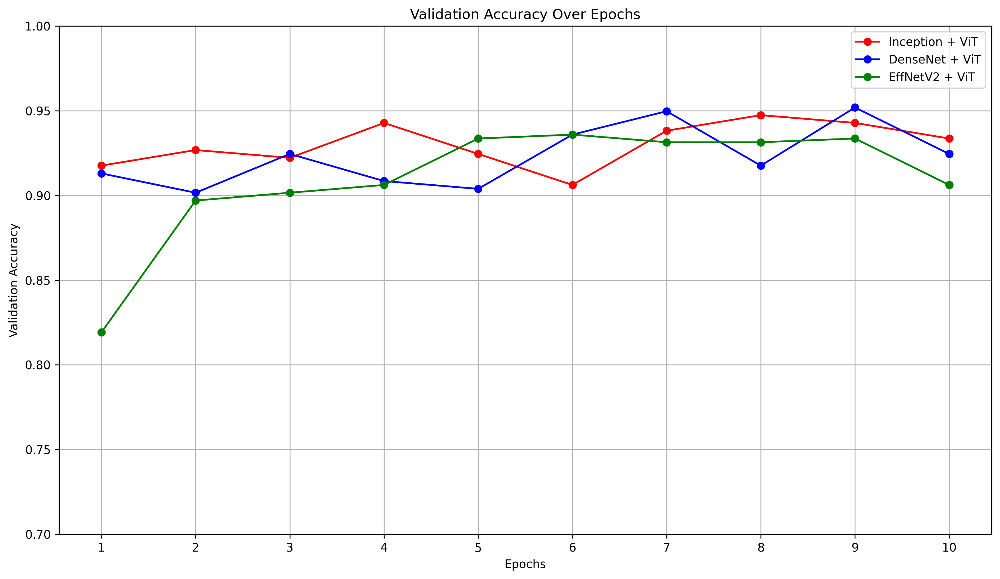

In [ ]:
import matplotlib.pyplot as plt

# Validation accuracy per epoch
densenet_vit_val_acc = [0.9130, 0.9016, 0.9245, 0.9085, 0.9039, 0.9359, 0.9497, 0.9176, 0.9519, 0.9245]
efficientnet_vit_val_acc = [0.8192, 0.8970, 0.9016, 0.9062, 0.9336, 0.9359, 0.9314, 0.9314, 0.9336, 0.9062]  # Updated values
inception_vit_val_acc = [0.9176, 0.9268, 0.9222, 0.9428, 0.9245, 0.9062, 0.9382, 0.9474, 0.9428, 0.9336]

epochs = list(range(1, 11))

# Plot with custom colors
plt.figure(figsize=(12, 7), dpi=300)
plt.plot(epochs, inception_vit_val_acc, color='red', marker='o', label='Inception + ViT')
plt.plot(epochs, densenet_vit_val_acc, color='blue', marker='o', label='DenseNet + ViT')
plt.plot(epochs, efficientnet_vit_val_acc, color='green', marker='o', label='EffNetV2 + ViT')

plt.title('Validation Accuracy Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Validation Accuracy')
plt.ylim(0.70, 1.00)
plt.xticks(epochs)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

Per-Class F1 Score Comparison Across Hybrid Models

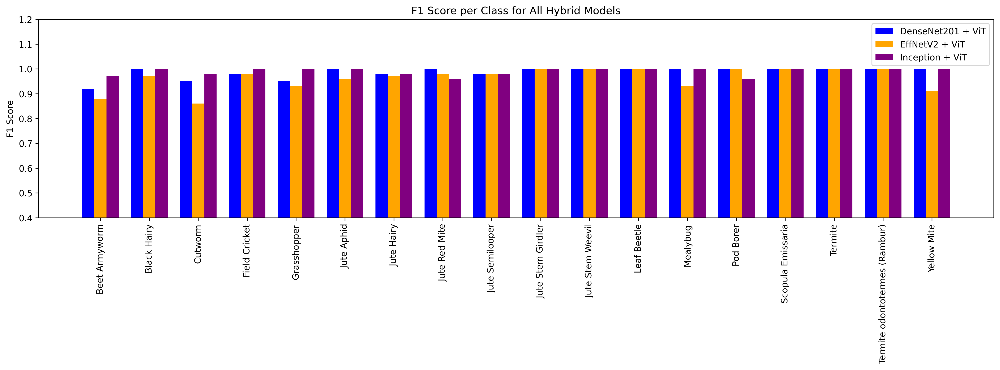

In [ ]:
# F1-scores per class for all three models (based on classification reports from logs)
f1_dense = [0.92, 1.00, 0.95, 0.98, 0.95, 1.00, 0.98, 1.00, 0.98, 1.00, 1.00, 1.00, 1.00, 1.00, 1.00, 1.00, 1.00, 1.00]
f1_eff = [0.88, 0.97, 0.86, 0.98, 0.93, 0.96, 0.97, 0.98, 0.98, 1.00, 1.00, 1.00, 0.93, 1.00, 1.00, 1.00, 1.00, 0.91]
f1_inception = [0.97, 1.00, 0.98, 1.00, 1.00, 1.00, 0.98, 0.96, 0.98, 1.00, 1.00, 1.00, 1.00, 0.96, 1.00, 1.00, 1.00, 1.00]

# Class names
x = np.arange(len(class_names))
width = 0.25

# Plotting
fig, ax = plt.subplots(figsize=(16, 6), dpi=300)
ax.bar(x - width, f1_dense, width, label='DenseNet201 + ViT', color='blue')
ax.bar(x, f1_eff, width, label='EffNetV2 + ViT', color='orange')
ax.bar(x + width, f1_inception, width, label='Inception + ViT', color='purple')

ax.set_ylabel('F1 Score')
ax.set_title('F1 Score per Class for All Hybrid Models')
ax.set_xticks(x)
ax.set_xticklabels(class_names, rotation=90)
ax.set_ylim(0.4, 1.2)
ax.legend()
plt.tight_layout()
plt.show()

Visual Comparison of Confusion Matrices for Hybrid Models

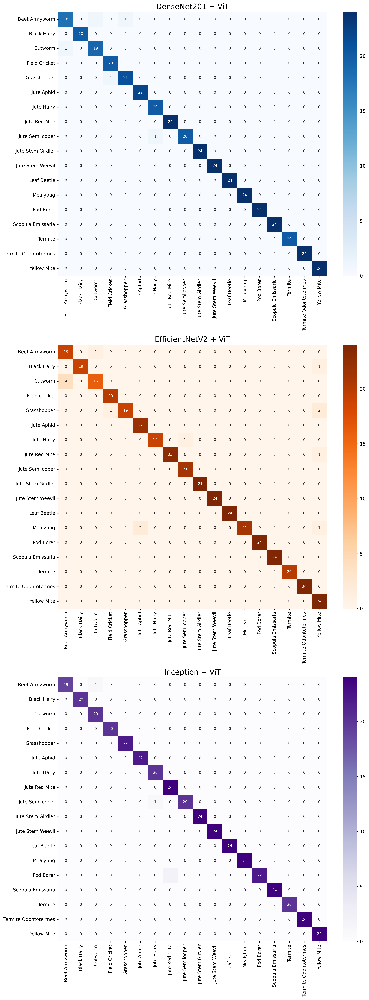

In [ ]:
# Full updated and correct code using confusion matrices based on your actual model outputs

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Class labels
class_names = [
    "Beet Armyworm", "Black Hairy", "Cutworm", "Field Cricket", "Grasshopper", "Jute Aphid", "Jute Hairy",
    "Jute Red Mite", "Jute Semilooper", "Jute Stem Girdler", "Jute Stem Weevil", "Leaf Beetle", "Mealybug",
    "Pod Borer", "Scopula Emissaria", "Termite", "Termite Odontotermes", "Yellow Mite"
]

# Confusion matrices taken from your output files (DenseNet+ViT, EfficientNet+ViT, Inception+ViT)
conf_matrix_dense = np.array([
    [18, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 20, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [1, 0, 19, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 20, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 1, 21, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 22, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 20, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 0, 24, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 1, 0, 20, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 24, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 24, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 24, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 24, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 24, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 24, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20, 0, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 24, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 24]
])

conf_matrix_eff = np.array([
    [19, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 19, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
    [4, 0, 16, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 20, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 1, 19, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2],
    [0, 0, 0, 0, 0, 22, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 19, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 0, 23, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
    [0, 0, 0, 0, 0, 0, 0, 0, 21, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 24, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 24, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 24, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 21, 0, 0, 0, 0, 1],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 24, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 24, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20, 0, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 24, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 24]
])

conf_matrix_incep = np.array([
    [19, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 20, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 20, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 20, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 22, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 22, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 20, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 0, 24, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 1, 0, 20, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 24, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 24, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 24, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 24, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 22, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 24, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 20, 0, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 24, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 24]
])

# Plot annotated confusion matrices

fig, axs = plt.subplots(3, 1, figsize=(12, 30), dpi=300)

sns.heatmap(conf_matrix_dense, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names,
            annot_kws={"size": 8}, ax=axs[0])
axs[0].set_title('DenseNet201 + ViT', fontsize=16)

sns.heatmap(conf_matrix_eff, annot=True, fmt='d', cmap='Oranges',
            xticklabels=class_names, yticklabels=class_names,
            annot_kws={"size": 8}, ax=axs[1])
axs[1].set_title('EfficientNetV2 + ViT', fontsize=16)

sns.heatmap(conf_matrix_incep, annot=True, fmt='d', cmap='Purples',
            xticklabels=class_names, yticklabels=class_names,
            annot_kws={"size": 8}, ax=axs[2])
axs[2].set_title('Inception + ViT', fontsize=16)

plt.tight_layout()
plt.show()

In [ ]:
Conclusion:

This project demonstrates that combining CNNs and Vision Transformers (ViTs) yields highly accurate jute pest detection.

InceptionV3 + ViT had the best performance, with 99% test accuracy, followed by DenseNet201 + ViT and EfficientNetV2 + ViT.
Hybrid models outperform standalone CNNs because they incorporate both local and global features.
ViT integration enhances accuracy, especially for visually similar pests.
